---
# LG - Image Classification
### `OpenCV를 활용한 Object Detection 및 모델링`
---

In [1]:
%matplotlib inline
import os
import re
import cv2
import pandas as pd
import numpy as np
from glob import glob
from PIL import Image
from datetime import datetime as dt
from time import time
import matplotlib.pyplot as plt
from keras.preprocessing.image import ImageDataGenerator
import copy

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 200)
plt.rcParams["axes.grid"] = False

Using TensorFlow backend.


In [2]:
#!pip install labelImg

In [3]:
import keras
np.__version__, keras.__version__, pd.__version__

('1.16.4', '2.2.4', '0.25.0')

# 1. Load Data

In [4]:
df = pd.DataFrame(columns=['path', 'angle', 'pos', 'datetime', 'cc', 'row', 'col', 'label'])
files = sorted(glob("img2/*/*/*/*/*"))
for f in files:
    f_name = f.split("CAM_")[1].split("_")
    df.loc[len(df)] = [f, f_name[0], f_name[1], "-".join(f_name[2:5]),
                       f_name[5][5:], f_name[6][3:], f_name[7][3:-1], f[5:7]]
    
df['datetime_id'] = df['datetime']
df['datetime'] = pd.to_datetime(df['datetime'], format="%Y%m%d-%H%M%S-%f")
df['cc'].replace('', np.NaN, inplace=True)
for i in range(0,len(df)):
    df['datetime_id'][i]= df['datetime_id'][i].replace("-","")

c:\python\python37\lib\site-packages\ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [5]:
df.tail()

,path,angle,pos,datetime,cc,row,col,label,datetime_id
4489,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:05.479,CC0261,8,5,OK,20190919155605479
4490,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:15.649,CC0261,9,5,OK,20190919155615649
4491,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:26.372,CC0261,10,5,OK,20190919155626372
4492,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:36.548,CC0261,11,5,OK,20190919155636548
4493,img2\OK\2-2-120\Z\POS_3\CAM_Z_POS3_20190919_15...,Z,POS3,2019-09-19 15:56:46.953,CC0261,12,5,OK,20190919155646953


- 이미지에 패딩을 주어 정사각형 이미지 생성

In [6]:
def input_preproc(angle='Z', label='NG'):
    sqr_img = []
    path_list = []
    for idx, path in enumerate(df[(df['angle']==angle) & (df['label']==label)]['path']):
        img = cv2.imread(path)
    
        # convert img to square
        height, width, _ = img.shape
        size = max(height, width)
        empty_img = np.zeros((size, size, 3), np.uint8)

        x_offset = int((size - width) / 2)
        y_offset = int((size - height) / 2)
        empty_img[y_offset : y_offset + height, x_offset : x_offset + width] = img

        empty_img = cv2.resize(empty_img, (size, size), interpolation=cv2.INTER_CUBIC)
        sqr_img.append(cv2.cvtColor(empty_img, cv2.COLOR_BGR2RGB))
        path_list.append(path)
        
    return sqr_img, path_list

In [7]:
def input_preproc_2(angle='Z', label='NG', pos= 'POS1'):
    sqr_img = []
    for idx, path in enumerate(df[(df['angle']==angle) & (df['label']==label) & (df['pos']== pos)]['path']):
        img = cv2.imread(path)
    
        # convert img to square
        height, width, _ = img.shape
        size = max(height, width)
        empty_img = np.zeros((size, size, 3), np.uint8)

        x_offset = int((size - width) / 2)
        y_offset = int((size - height) / 2)
        empty_img[y_offset : y_offset + height, x_offset : x_offset + width] = img

        empty_img = cv2.resize(empty_img, (size, size), interpolation=cv2.INTER_CUBIC)
        sqr_img.append(cv2.cvtColor(empty_img, cv2.COLOR_BGR2RGB))
        
    return sqr_img

In [ ]:
insp_ng, path_list_insp_ng = input_preproc(angle='INSP', label='NG')
insp_ok, path_list_insp_ok = input_preproc(angle='INSP', label='OK')

In [40]:
Z_ng, path_list_z_ng = input_preproc(angle='Z', label='NG')
Z_ok, path_list_z_ok = input_preproc(angle='Z', label='OK')

In [8]:
up_ng, path_list_up_ng = input_preproc(angle='UP', label='NG')
up_ok, path_list_up_ok = input_preproc(angle='UP', label='OK')

In [ ]:
print(up_ok[2].shape)
plt.imshow(up_ok[52])

In [ ]:
up_ok_pos1 = input_preproc_2(angle='UP', label='OK',pos='POS1')

In [ ]:
print(Z_ng[24].shape)
plt.imshow(Z_ng[45])

# 2. Object Detection

- 노란 물체 인식

# upper and lower limit , INSP& Z

In [9]:
def y_up(input_img):
    shape = input_img.shape[0]    
    
    # ============
    # PREPROCSSING
    # ============

    # _______________________________________________________________________________________ 블러 효과
    input_data = np.float32(cv2.fastNlMeansDenoisingColored(input_img.copy(),None,7,7,7,13))
    # _______________________________________________________________________________________
    
    #### filter yellow
    pad = int(shape*0.25)
    mean = np.mean(input_data[pad:-pad, :, :]) # mean img brightness
    if mean < 60: # if img is dark
        for r in input_data:
            for c in r: # c = [r, g, b]
                c[c > 50] *= 1.4 # bright area x 1.4 brighter
                c[0] *= 1.2 # yellow channel x 1.2 brighter again
                c[1] *= 1.2 # yellow channel x 1.2 brighter again
                c[c <= 50] *= 1.2 # dark area x 1.2 brighter
                c[c > 255] = 255

                if c[0] > 40 and c[1] > 70 and c[2] < 60: # if yellow
                    # white
                    c[0] = 255
                    c[1] = 255
                    c[2] = 255

                else:
                    # black
                    c[0] = 0
                    c[1] = 0
                    c[2] = 0
                    
    else: # if img is bright enough to detect
        for r in input_data:
            for c in r: # c = [r, g, b]
                # find yellow and make it yellower
                if c[0] > 180 and c[1] > 185 and c[2] < 175: # if yellow
                    # white
                    c[0] = 255
                    c[1] = 255
                    c[2] = 255

                else:
                    # black
                    c[0] = 0
                    c[1] = 0
                    c[2] = 0
                    
    #### filter area by threshold
    # _______________________________________________________________________________________ 흑백 필터
    img_gray = cv2.cvtColor(np.uint8(input_data.copy()), cv2.COLOR_RGB2GRAY)
    kernel = np.ones((3, 3), np.uint8)
    img_dilation = cv2.dilate(img_gray, kernel, iterations=1)
    img_gray_blurred = cv2.GaussianBlur(img_dilation, (25, 25), 0)
    _, thresh = cv2.threshold(img_gray_blurred, 51, 255, cv2.THRESH_BINARY)
    # _______________________________________________________________________________________


    # =========
    # DETECTION
    # =========

    #### detect contours
    # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
    cnts = cv2.findContours(np.uint8(thresh), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    # _______________________________________________________________________________________
    
    #### filter contour rectangles by condition
    r_cdn = np.empty((0,4))
    for cnt in cnts:
        # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
        x, y, w, h = cv2.boundingRect(cnt) # convert contour to rectangles
        # ___________________________________________________________________________________
        
        # conditions
        cdn_1 = y > shape * 0.4
        cdn_2 = x > shape * 0.55
        cdn_3 = x+w < shape * 0.45
        cdn_4 = w > shape * 0.035
        cdn_5 = ((y+h)/shape)**5 * h > 3
        cdn_6 = (np.abs(shape-(2*x+w))/shape)**2 * h > 2
        # cdn5,6 : 왼/오/아래 가장자리에서 멀수록 컨투어 크기가 더 커야된다

        if cdn_1 and (cdn_2 or cdn_3) and cdn_4 and cdn_5 and cdn_6:
            r_cdn = np.concatenate((r_cdn, np.array([x, y, w, h])[np.newaxis,:]), axis=0)
            # ______________________________________________________________________________ 연두색 사각형 표시
            img_rect = cv2.rectangle(input_data.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
            # ______________________________________________________________________________
    
    #### return axis y of detected object
    # final condition
    if r_cdn.shape[0] > 1: # if rectangle is more than one
        x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
        
    elif r_cdn.shape[0] == 1: # if rectangle is only one
        x, y, w, h = r_cdn[0]

    else: # if no rectangle is found
        img_rect = input_data.copy()
        y = int(shape * 0.7)
    
    
    # =======
    # DISPLAY
    # =======
#     plt.figure(figsize=(2, 2))
#     plt.imshow(img_rect)
#     plt.axhline(y=y, color='r', linestyle='-')
#     plt.xticks([])
#     plt.yticks([])
#     plt.show()
    
    return y

# upper and lower limit, UP

In [10]:
def y_up_pos(input_img):
    shape = input_img.shape[0]    
    
    # ============
    # PREPROCSSING
    # ============

    # _______________________________________________________________________________________ 블러 효과
    input_data = np.float32(cv2.fastNlMeansDenoisingColored(input_img.copy(),None,7,7,7,13))
    # _______________________________________________________________________________________
    
    #### filter yellow
    pad = int(shape*0.25)
#     mean = np.mean(input_data[pad:-pad, :, :]) # mean img brightness
#     if mean < 60: # if img is dark
#         for r in input_data:
#             for c in r: # c = [r, g, b]
#                 c[c > 50] *= 1.4 # bright area x 1.4 brighter
#                 c[0] *= 1.2 # yellow channel x 1.2 brighter again
#                 c[1] *= 1.2 # yellow channel x 1.2 brighter again
#                 c[c <= 50] *= 1.2 # dark area x 1.2 brighter
#                 c[c > 255] = 255

#                 if c[0] > 40 and c[1] > 70 and c[2] < 60: # if yellow
#                     # white
#                     c[0] = 255
#                     c[1] = 255
#                     c[2] = 255

#                 else:
#                     # black
#                     c[0] = 0
#                     c[1] = 0
#                     c[2] = 0
                    
#     else: # if img is bright enough to detect
#         for r in input_data:
#             for c in r: # c = [r, g, b]
#                 # find yellow and make it yellower
#                 if c[0] > 180 and c[1] > 185 and c[2] < 175: # if yellow
#                     # white
#                     c[0] = 255
#                     c[1] = 255
#                     c[2] = 255

#                 else:
#                     # black
#                     c[0] = 0
#                     c[1] = 0
#                     c[2] = 0
####################################################################################################################################
    img_hsv = cv2.cvtColor(np.uint8(input_img.copy()), cv2.COLOR_BGR2HSV)

    # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
    # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
    #lower_blue = (120-10, 30, 30)
    #upper_blue = (120+10, 255, 255)
    # yellow color upper and lower bound
    lowerBound = np.array([50, 50, 50],np.uint8)
    upperBound = np.array([200, 200, 180],np.uint8) ## 200, 
    # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
    img_mask = cv2.inRange(img_hsv.copy(), lowerBound, upperBound)
    
    
    #img_denoised_2 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,21)
    img_gray_2 = cv2.cvtColor(np.uint8(input_img.copy()), cv2.COLOR_RGB2GRAY)
    kernel_2 = np.ones((1, 1), np.uint8)
    img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
    #img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)
    
    
    

    # 원본이미지에서 범위값에 해당하는 영상부분을 흭득한다.
    img_result = cv2.bitwise_and(np.uint8(input_img.copy()), np.uint8(input_img.copy()), mask = img_mask)
    h, s, v1 = cv2.split(img_result)
    ret, thresh = cv2.threshold(v1, 110, 200, cv2.THRESH_TOZERO)
    ret1, thresh1 = cv2.threshold(img_dilation_2.copy(), 90, 200, cv2.THRESH_TOZERO)  # 195 234
    ret2, thresh2 = cv2.threshold(img_dilation_2.copy(), 125, 200, cv2.THRESH_TOZERO)  # 195 234 
    ret3, thresh3 = cv2.threshold(img_dilation_2.copy(), 155, 200, cv2.THRESH_TOZERO)  # 195 234   
    ret4, thresh4 = cv2.threshold(img_dilation_2.copy(), 170, 200, cv2.THRESH_TOZERO)  # 195 234   
    ret5, thresh5 = cv2.threshold(img_dilation_2.copy(), 195, 200, cv2.THRESH_TOZERO)  # 195 234   



    cnts, hierachy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts1, hierachy1 = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts2, hierachy2 = cv2.findContours(thresh2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts3, hierachy3 = cv2.findContours(thresh3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts4, hierachy4 = cv2.findContours(thresh4, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cnts5, hierachy5 = cv2.findContours(thresh5, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contss = cnts# + cnts1 + cnts2 + cnts3 + cnts4 + cnts5
####################################################################################################################################                    
#     #### filter area by threshold
#     # _______________________________________________________________________________________ 흑백 필터
#     img_gray = cv2.cvtColor(np.uint8(input_data.copy()), cv2.COLOR_RGB2GRAY)
#     kernel = np.ones((3, 3), np.uint8)
#     img_dilation = cv2.dilate(img_gray, kernel, iterations=1)
#     img_gray_blurred = cv2.GaussianBlur(img_dilation, (25, 25), 0)
#     _, thresh = cv2.threshold(img_gray_blurred, 215, 255, cv2.THRESH_BINARY)
#     # _______________________________________________________________________________________

#     # =========
#     # DETECTION
#     # =========

#     #### detect contours
#     # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
#     cnts = cv2.findContours(np.uint8(thresh), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#     # _______________________________________________________________________________________
#####################################################################################################################################

    #### filter contour rectangles by condition
    r_cdn = np.empty((0,4))
    for cnt in contss:
        # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
        x, y, w, h = cv2.boundingRect(cnt) # convert contour to rectangles
        # ___________________________________________________________________________________
        draw_con = cv2.drawContours(input_img.copy(), contss, -1, (0, 255, 0), 2)
        # conditions
        cdn_1 = y > shape * 0.4
        cdn_2 = x > shape * 0.55
        cdn_3 = x+w < shape * 0.45
        cdn_4 = w > shape * 0.035
        cdn_5 = ((y+h)/shape)**5 * h > 3
        cdn_6 = (np.abs(shape-(2*x+w))/shape)**2 * h > 2
        # cdn5,6 : 왼/오/아래 가장자리에서 멀수록 컨투어 크기가 더 커야된다

        if cdn_1 and (cdn_2 or cdn_3) and cdn_4 and cdn_5 and cdn_6:
            r_cdn = np.concatenate((r_cdn, np.array([x, y, w, h])[np.newaxis,:]), axis=0)
            # ______________________________________________________________________________ 연두색 사각형 표시
            img_rect = cv2.rectangle(input_img.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
            # ______________________________________________________________________________
    
    #### return axis y of detected object
    # final condition
    if r_cdn.shape[0] > 1: # if rectangle is more than one
        x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
        print('two')
    elif r_cdn.shape[0] == 1: # if rectangle is only one
        x, y, w, h = r_cdn[0]
        print('one')

    else: # if no rectangle is found
        img_rect = input_img.copy()
        y = int(shape * 0.7)
        print('nothing')
        #print(r_cdn.shape[0])
    
    
    # =======
    # DISPLAY
    # =======
    plt.figure(figsize=(20, 5))
    plt.subplot(1,4,1)
    plt.imshow(draw_con)
    plt.axhline(y=y, color='r', linestyle='-')    
    plt.xticks([])
    plt.yticks([])
    plt.subplot(1,4,2)
    plt.imshow(img_mask)    
    plt.subplot(1,4,3)
    plt.imshow(input_img)
    plt.axhline(y=y, color='r', linestyle='-')    
    plt.subplot(1,4,4)
    plt.imshow(input_img)
    plt.show()
    
    return y

- 타겟 물체 인식 (노란 물체를 하한(변수명:y_upper)으로 사용)
    - Display 부분 주석을 해제하면 이미지 하나를 저장할 때마다 전처리 과정을 출력한다.
    - *정정: 보라색 필터는 적용하지 않음

# Z , INSP DETECTION

In [11]:
def detection(input_img, start=0, file_name='detection'):
    img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
    
    for idx, input_data in enumerate(input_img):
        print(start + idx, '='*110)
        # ============
        # PREPROCSSING
        # ============

        #### filter image
        # _______________________________________________________________________________________ 흑백 필터 (6개 concat)
        img_denoised_1 = cv2.fastNlMeansDenoisingColored(input_data.copy(),None,9,9,7,19)
        img_gray_1 = cv2.cvtColor(img_denoised_1.copy(), cv2.COLOR_RGB2GRAY)
        kernel_1 = np.ones((5, 5), np.uint8)
        img_dilation_1 = cv2.dilate(img_gray_1.copy(), kernel_1, iterations=1)
        img_gray_blurred_1 = cv2.GaussianBlur(img_dilation_1.copy(), (31, 31), 0)
        
        img_denoised_2 = cv2.fastNlMeansDenoisingColored(input_data.copy(),None,11,11,7,21)
        img_gray_2 = cv2.cvtColor(img_denoised_2.copy(), cv2.COLOR_RGB2GRAY)
        kernel_2 = np.ones((1, 1), np.uint8)
        img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
        img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)

        # threshold
        _, thresh_1 = cv2.threshold(img_gray_blurred_1.copy(), 210, 255, cv2.THRESH_TOZERO)
        _, thresh_2 = cv2.threshold(img_gray_blurred_1.copy(), 175, 255, cv2.THRESH_TOZERO)
        _, thresh_3 = cv2.threshold(img_gray_blurred_1.copy(), 135, 255, cv2.THRESH_TOZERO)
        
        _, thresh_4 = cv2.threshold(img_gray_blurred_2.copy(), 225, 255, cv2.THRESH_BINARY)
        _, thresh_5 = cv2.threshold(img_gray_blurred_2.copy(), 185, 255, cv2.THRESH_BINARY)
        _, thresh_6 = cv2.threshold(img_gray_blurred_2.copy(), 165, 255, cv2.THRESH_BINARY)
        # _______________________________________________________________________________________
        
        '''
        4,5,6 => 210,175,155 일때 54번 정상, 45,47,52 못잡음
        
        '''    
        
        # =========
        # DETECTION
        # =========

        #### detect contours
        # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
        cnts_1 = cv2.findContours(thresh_1.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_2 = cv2.findContours(thresh_2.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_3 = cv2.findContours(thresh_3.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_4 = cv2.findContours(thresh_4.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_5 = cv2.findContours(thresh_5.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_6 = cv2.findContours(thresh_6.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts = cnts_1 + cnts_2 + cnts_3 + cnts_4 + cnts_5  + cnts_6
        #cnts = cnts_1 + cnts_2 
        # _______________________________________________________________________________________

        #### convert contour to rectangles
        xywh = []
        for cnt in cnts:
            # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
            _x, _y, _w, _h = np.array(cv2.boundingRect(cnt) + np.array([-5,-10,10,20])) # add padding to rectangles
            # ___________________________________________________________________________________
            xywh.append(list(map(int, [_x, _y, _w, _h])))
        # _______________________________________________________________________________________ 중복 사각형 병합
        rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.001) # merge contours with intersection
        # _______________________________________________________________________________________

        #### filter contours by condition
        shape = input_data.shape[0]
        y_upper = y_up(input_data)
        try:
            y_min= np.argmax(np.where(rect[:,1] > y_upper, 0, rect[:,1])) # minimum y
            y_lower = max(rect[y_min, 1]/2.7, shape * 0.1)
        except:
            y_lower = shape * 0.2 # lower가 상한(*상한 픽셀 좌표값이 더 커서 lower라고 변수명 설정)
        
        r_cdn = np.empty((0,4), dtype=int)
        for r in rect:
            x, y, w, h = list(map(int, r))
            # conditions
            cdn_1 = 0.2 < h/w < 1.5
            cdn_2 = x > shape * 0.2
            cdn_3 = x+w < shape * 0.8
            cdn_4 = y > y_lower
            cdn_5 = y+h < y_upper
            cdn_6 = w > shape * 0.05
            cdn_7 = h > shape * 0.05
            
            if cdn_1 and cdn_2 and cdn_3 and cdn_4 and cdn_5 and cdn_6 and cdn_7:
                r_cdn = np.concatenate((r_cdn, np.array(r)[np.newaxis,:]), axis=0)
                
        #### filter target contour by selecting max width
        # final condition
        if r_cdn.shape[0] > 1: # if rectangle is more than one
            x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
        elif r_cdn.shape[0] == 1: # if rectangle is only one
            x, y, w, h = r_cdn[0]
        else: # if no rectangle is found
            x, y, w, h = list(map(int, [shape*0.35, y_lower*2.2, shape*0.2, (y_upper-y_lower)*0.45]))
        # _______________________________________________________________________________________ 연두색 사각형 표시
        img_rect = cv2.rectangle(img_denoised_1.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
        # _______________________________________________________________________________________ 
        
        
        # ============
        # CROP & SAVE
        # ============
        
        # crop target detected contours from img
        # (padding을 주고, 가로세로 비율을 2:1로 확장해 crop하고, shape을(100,200,3)으로 resize)
        pad = int(shape*0.05) # add padding each side
        y_1 = y-pad
        y_2 = y+h+pad
        x_1 = x-pad
        x_2 = x+w+pad
        
        if (y_2-y_1)/(x_2-x_1) >= 1/2: # widen x axis
            x_pad = int((y_2-y_1)-(x_2-x_1)/2) # more padding to w
            x_1 -= x_pad
            x_2 += x_pad
            
            if x_1 < 0 and x_2 > shape: # if padded contour overflow on both left and right side 
                y_1 -= int((shape/2-y_2)/2)
                y_2 = y_1+int(shape/2)
                x_1 = 0
                x_2 = shape
                
            else:
                if x_1 < 0: # if padded contour overflow on left side
                    x_2 += (-x_1)
                    x_1 = 0
                    
                if x_2 > shape: # if padded contour overflow on right side
                    x_1 -= (x_2-shape)
                    x_2 = shape
                    if x_1 < 0:
                        x_1 = 0
                    
        else:  # widen y axis
            y_pad = int((x_2-x_1)/2-(y_2-y_1)) # more padding to h
            y_1 -= y_pad
            y_2 += y_pad
            
            if y_1 < 0 and y_2 > shape: # if padded contour overflow on both top and bottom side 
                y_1 = 0
                y_2 = shape
                x_1 -= int((shape/2-x_2)/2)
                x_2 = x_1+int(shape/2)
                
            else:
                if y_1 < 0: # if padded contour overflow on top side
                    print('t')
                    y_2 += (-y_1)
                    y_1 = 0
                    
                if y_2 > shape: # if padded contour overflow on bottom side
                    print('b')
                    y_1 -= (y_2-shape)
                    y_2 = shape
                    if y_1 < 0:
                        y_1 = 0
        
        img = input_data[y_1:y_2, x_1:x_2] # crop
        
        # resize img
        img_resized = cv2.resize(img.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
        
        # save detected image
        img_detection = np.concatenate((img_detection, img_resized[np.newaxis,...]), axis=0)
        #cv2.imwrite(f'img/{file_name}/{file_name}_{start + idx}.jpg', cv2.cvtColor(img_resized, cv2.COLOR_RGB2BGR))
        
        # =======
        # DISPLAY
        # =======
#         plt.figure(figsize=(20, 8))
        
#         plt.subplot(141)
#         plt.imshow(input_data)
#         plt.xticks([])
#         plt.yticks([])
        
#         plt.subplot(142)
#         plt.imshow(np.concatenate((np.concatenate((thresh_1, thresh_2, thresh_3), axis=1), 
#                                    np.concatenate((thresh_4, thresh_5, thresh_6), axis=1))))
#         plt.axhline(y=shape, color='w', linestyle='-')
#         plt.axvline(x=shape, color='w', linestyle='-')
#         plt.axvline(x=shape*2, color='w', linestyle='-')
#         plt.xticks([])
#         plt.yticks([])

#         plt.subplot(143)
#         plt.imshow(img_rect)
#         plt.axhline(y=y_lower, color='r', linestyle='-')
#         plt.axhline(y=y_upper, color='r', linestyle='-')
#         plt.xticks([])
#         plt.yticks([])

#         plt.subplot(144)
#         plt.imshow(img_resized)
#         plt.xticks([])
#         plt.yticks([])

#         plt.show()

    return img_detection

# UP DETECTION

In [12]:
def up_detection(input_img, start=0, file_name='detection'):
    img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
    
    for idx, input_data in enumerate(input_img):
        print(start + idx, '='*110)
        # ============
        # PREPROCSSING
        # ============

        #### filter image
        # _______________________________________________________________________________________ 흑백 필터 (6개 concat)
        img_denoised_1 = cv2.fastNlMeansDenoisingColored(input_data.copy(),None,7,7,7,13)
        img_gray_1 = cv2.cvtColor(img_denoised_1.copy(), cv2.COLOR_RGB2GRAY)
        kernel_1 = np.ones((5, 5), np.uint8)
        img_dilation_1 = cv2.dilate(img_gray_1.copy(), kernel_1, iterations=1)
        img_gray_blurred_1 = cv2.GaussianBlur(img_dilation_1.copy(), (21, 21), 0)
        
        img_denoised_2 = cv2.fastNlMeansDenoisingColored(input_data.copy(),None,11,11,7,21)
        img_gray_2 = cv2.cvtColor(img_denoised_2.copy(), cv2.COLOR_RGB2GRAY)
        kernel_2 = np.ones((1, 1), np.uint8)
        img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
        img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)

        # threshold
        _, thresh_1 = cv2.threshold(img_gray_blurred_1.copy(), 110, 255, cv2.THRESH_BINARY)
        _, thresh_2 = cv2.threshold(img_gray_blurred_1.copy(), 135, 255, cv2.THRESH_BINARY)
        _, thresh_3 = cv2.threshold(img_gray_blurred_1.copy(), 175, 255, cv2.THRESH_BINARY)
        
        _, thresh_4 = cv2.threshold(img_gray_blurred_2.copy(), 110, 255, cv2.THRESH_BINARY)
        _, thresh_5 = cv2.threshold(img_gray_blurred_2.copy(), 135, 255, cv2.THRESH_BINARY)
        _, thresh_6 = cv2.threshold(img_gray_blurred_2.copy(), 175, 255, cv2.THRESH_BINARY)
        # _______________________________________________________________________________________
        
        '''
        4,5,6 => 210,175,155 일때 54번 정상, 45,47,52 못잡음
        
        '''    
        
        # =========
        # DETECTION
        # =========

        #### detect contours
        # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
        cnts_1 = cv2.findContours(thresh_1.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_2 = cv2.findContours(thresh_2.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        cnts_3 = cv2.findContours(thresh_3.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        #cnts_4 = cv2.findContours(thresh_4.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_5 = cv2.findContours(thresh_5.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_6 = cv2.findContours(thresh_6.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
        #cnts = cnts_1 + cnts_2 + cnts_3 + cnts_4 + cnts_5  + cnts_6
        cnts = cnts_1 + cnts_2 + cnts_3
        # _______________________________________________________________________________________

        #### convert contour to rectangles
        xywh = []
        for cnt in cnts:
            # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
            _x, _y, _w, _h = np.array(cv2.boundingRect(cnt) + np.array([-5,-10,10,20])) # add padding to rectangles
            # ___________________________________________________________________________________
            xywh.append(list(map(int, [_x, _y, _w, _h])))
        # _______________________________________________________________________________________ 중복 사각형 병합
        rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.001) # merge contours with intersection
        # _______________________________________________________________________________________

        #### filter contours by condition
        shape = input_data.shape[0]
        #y_upper = y_up(input_data)
        y_upper = y_up_pos(input_data)
        try:
            y_min= np.argmax(np.where(rect[:,1] > y_upper, 0, rect[:,1])) # minimum y
            y_lower = max(rect[y_min, 1]/2.7, shape * 0.1)
        except:
            y_lower = shape * 0.2 # lower가 상한(*상한 픽셀 좌표값이 더 커서 lower라고 변수명 설정)
        
        r_cdn = np.empty((0,4), dtype=int)
        for r in rect:
            x, y, w, h = list(map(int, r))
            # conditions
            cdn_1 = 0.2 < h/w < 1.5
            cdn_2 = x > shape * 0.2
            cdn_3 = x+w < shape * 0.8
            cdn_4 = y > y_lower
            cdn_5 = y+h < y_upper
            cdn_6 = w > shape * 0.05
            cdn_7 = h > shape * 0.05
            
            if cdn_1 and cdn_2 and cdn_3 and cdn_4 and cdn_5 and cdn_6 and cdn_7:
                r_cdn = np.concatenate((r_cdn, np.array(r)[np.newaxis,:]), axis=0)
                
        #### filter target contour by selecting max width
        # final condition
        if r_cdn.shape[0] > 1: # if rectangle is more than one
            x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
            print('least two')
        elif r_cdn.shape[0] == 1: # if rectangle is only one
            x, y, w, h = r_cdn[0]
            print('one')
        else: # if no rectangle is found
            x, y, w, h = list(map(int, [shape*0.2, y_lower*1.4, shape*0.4, (y_upper-y_lower)*1.2]))
            print('nothing')
        # _______________________________________________________________________________________ 연두색 사각형 표시
        img_rect = cv2.rectangle(img_denoised_1.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
        # _______________________________________________________________________________________ 
        
        
        # ============
        # CROP & SAVE
        # ============
        
        # crop target detected contours from img
        # (padding을 주고, 가로세로 비율을 2:1로 확장해 crop하고, shape을(100,200,3)으로 resize)
        pad = int(shape*0.05) # add padding each side
        y_1 = y-pad
        y_2 = y+h+pad
        x_1 = x-pad
        x_2 = x+w+pad
        
        if (y_2-y_1)/(x_2-x_1) >= 1/2: # widen x axis
            x_pad = int((y_2-y_1)-(x_2-x_1)/2) # more padding to w
            x_1 -= x_pad
            x_2 += x_pad
            
            if x_1 < 0 and x_2 > shape: # if padded contour overflow on both left and right side 
                y_1 -= int((shape/2-y_2)/2)
                y_2 = y_1+int(shape/2)
                x_1 = 0
                x_2 = shape
                
            else:
                if x_1 < 0: # if padded contour overflow on left side
                    x_2 += (-x_1)
                    x_1 = 0
                    
                if x_2 > shape: # if padded contour overflow on right side
                    x_1 -= (x_2-shape)
                    x_2 = shape
                    if x_1 < 0:
                        x_1 = 0
                    
        else:  # widen y axis
            y_pad = int((x_2-x_1)/2-(y_2-y_1)) # more padding to h
            y_1 -= y_pad
            y_2 += y_pad
            
            if y_1 < 0 and y_2 > shape: # if padded contour overflow on both top and bottom side 
                y_1 = 0
                y_2 = shape
                x_1 -= int((shape/2-x_2)/2)
                x_2 = x_1+int(shape/2)
                
            else:
                if y_1 < 0: # if padded contour overflow on top side
                    print('t')
                    y_2 += (-y_1)
                    y_1 = 0
                    
                if y_2 > shape: # if padded contour overflow on bottom side
                    print('b')
                    y_1 -= (y_2-shape)
                    y_2 = shape
                    if y_1 < 0:
                        y_1 = 0
        
        img = input_data[y_1:y_2, x_1:x_2] # crop
        
        # resize img
        img_resized = cv2.resize(img.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
        #img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img

        # save detected image        
        img_detection = np.concatenate((img_detection, img_resized[np.newaxis,...]), axis=0)        
        #cv2.imwrite(f'img/{file_name}/{file_name}_{start + idx}.jpg', cv2.cvtColor(img_resized, cv2.COLOR_RGB2BGR))
        #print(' ',file_name)
        # =======
        # DISPLAY
        # =======
        plt.figure(figsize=(20, 8))
        
        plt.subplot(141)
        plt.imshow(input_data)
        plt.xticks([])
        plt.yticks([])
        
        plt.subplot(142)
        plt.imshow(np.concatenate((np.concatenate((thresh_1, thresh_2, thresh_3), axis=1), 
                                   np.concatenate((thresh_4, thresh_5, thresh_6), axis=1))))
        plt.axhline(y=shape, color='w', linestyle='-')
        plt.axvline(x=shape, color='w', linestyle='-')
        plt.axvline(x=shape*2, color='w', linestyle='-')
        plt.xticks([])
        plt.yticks([])

        plt.subplot(143)
        plt.imshow(img_rect)
        plt.axhline(y=y_lower, color='r', linestyle='-')
        plt.axhline(y=y_upper, color='r', linestyle='-')
        plt.xticks([])
        plt.yticks([])

        plt.subplot(144)
        plt.imshow(img_resized)
        plt.xticks([])
        plt.yticks([])

        plt.show()

    return img_detection

# Detection_y

In [13]:
import numpy as np
import cv2
import operator

def detection_y(data,path_list):
    cnt_1 = 0
    img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
    ##for i in up_ok[1400:1410] pos3
    for i in data:
        img_color = copy.deepcopy(i)
        string_path = path_list[cnt_1]

        #input_data = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,13)
        # BGR(파랑색)
        #color = [255, 0, 0]
#         color = [50, 255, 255]
#         pixel = np.uint8([[color]])
#         # cvtColor를 사용하여 HSV 색공간으로 변환한다.
#         hsv = cv2.cvtColor(pixel, cv2.COLOR_BGR2HSV)
#         # HSV값을 출력하기위해 픽셀값만 갖고온다.
#         hsv = hsv[0][0]

        # bgr과 hsv 값 출력
        #print("bgr: ", color)
        #print("hsv: ", hsv)

        # 이미지파일을 컬러로 읽어온다.
        #img_color = cv2.imread('food.jpg')

        # 이미지의 높이와 너비를 갖고온다.
        height,width = img_color.shape[:2]
        shape = img_color.shape[0]
        #print(shape)

        # hsv이미지로 변환한다.
        img_hsv = cv2.cvtColor(img_color.copy(), cv2.COLOR_BGR2HSV)

        # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
        # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
        #lower_blue = (120-10, 30, 30)
        #upper_blue = (120+10, 255, 255)
        # yellow color upper and lower bound   

        # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
        mask1 = cv2.inRange(img_hsv.copy(), (60,60,60), (180, 200, 200))
        kernel = np.ones((2,2),np.uint8)        
        dilation = cv2.dilate(mask1.copy(),kernel,iterations = 1)
        opening = cv2.morphologyEx(dilation.copy(), cv2.MORPH_OPEN, kernel)
        #closing = cv2.morphologyEx(opening.copy(), cv2.MORPH_CLOSE, kernel)
        _, thresh = cv2.threshold(opening, 60, 255, cv2.THRESH_BINARY)


        bluecnts2 = cv2.findContours(thresh,cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]

        img_color2 = copy.deepcopy(img_color)

        list_val = []        
        for cnt in bluecnts2:                        
            x2, y2, w2, h2 = cv2.boundingRect(cnt)
            area_x = cv2.contourArea(cnt)
            rect2 = cv2.rectangle(img_color2, (x2, y2), (x2 + w2, y2 + h2), (0,255,0), 1)        
            list_val.append(area_x)

        index1, value1 = max(enumerate(list_val), key=operator.itemgetter(1))
        index2 = []
        ex_list = [[],[]]
        count_num = 0
        #print('contour length = ', len(bluecnts2))
        for cnt in bluecnts2:                                
            area_x = cv2.contourArea(cnt)
            if (value1/4) < area_x:#  or (value1/) < area_x:  contour 사각형 넓이 최대크기와 1/4 크기까지
                index2.append(count_num)            
                ex_list[0].append(cnt)            
                ex_list[1].append(area_x)            
            count_num = count_num + 1

        img_color3 = copy.deepcopy(img_color)
        img_color4 = copy.deepcopy(img_color)
        #print('counts of rectangle = ',index2)
        #index2.sort(reverse=True)
        #print('[0] = ',ex_list[0])
        #print('[1] = ',ex_list[1])
        if len(index2) > 1 :
            for cnt in index2:                        
                x3, y3, w3, h3 = cv2.boundingRect(bluecnts2[cnt])        
                rect3 = cv2.rectangle(img_color3, (x3, y3), (x3 + w3, y3 + h3), (0,255,0), 1)

            x5, y5, w5, h5 = cv2.boundingRect(bluecnts2[index2[0]])        
            x6, y6, w6, h6 = cv2.boundingRect(bluecnts2[index2[1]])
            x7 = 0 
            y7 = 0
            w7 = 0
            h7 =0
            x8 = 0 
            y8 = 0
            if x5 > x6:
                x7 = x6
            else:
                x7 = x5

            if y5 < y6:
                y7 = y5
            else:
                y7 = y6


            if x5 + w5 < x6 + w6:
                x8 = x6
                w7 = w6        
            else:
                x8 = x5
                w7 = w5

            if y5 + h5 < y6 + h6:
                y8 = y6
                h7 = h6

            else:
                y8 = y5
                h7 = h5

            rect4 = cv2.rectangle(img_color4, (x7-10, y7-20), (x8 + w7+10, y8 + h7+10), (0,255,0), 2)
#             fontface = cv2.FONT_HERSHEY_SIMPLEX
#             scale = 0.6
#             thickness = 2
#             size = cv2.getTextSize(string_path, fontface, scale, thickness)
#             text_width = size[0][0]
#             text_height = size[0][1]
#             pt = (x7 + int((w7 - text_width) / 2), y7 + int((h7 + text_height) / 2))
#             cv2.putText(img_color, string_path, pt, fontface, scale, (255, 255, 255), thickness, 8)
            img_resized_1 = img_color[y7-20:y8 + h7+10, x7-10: x8 + w7+10] # crop
            try:
                img_resized_2 = cv2.resize(img_resized_1.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
                cnt_1 = cnt_1 + 1 
            except:
                img_resized_1 = img_color[y7:y8 + h7, x7: x8 + w7] # crop
                img_resized_2 = cv2.resize(img_resized_1.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
                cnt_1 = cnt_1 + 1 
                

#             except:
#                 img_re = img_resized(img_color.copy(),x7,y7,w7,h7)
#                 img_resized_2 = cv2.resize(img_re.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
#                 print('*'*135)
#                 plt.imshow(img_resized_2)
#                 plt.show()
#                 print('*'*135)
            


                



        else:
            arr = []
            for cnt in index2:                        
                x3, y3, w3, h3 = cv2.boundingRect(bluecnts2[cnt])
                #if (shape/2) > (x3 + w3 + 10):                    
                rect4 = cv2.rectangle(img_color4, (x3-10, y3-20), (x3 + w3 + 10, y3 + h3 + 20), (0,255,0), 2)    
                img_resized_1 = img_color[y3-20:y3 + h3 + 20, x3-10:x3 + w3 + 10] # crop
                img_resized_2 = cv2.resize(img_resized_1.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
                x2, y2, w2, h2 = cv2.boundingRect(bluecnts2[cnt])
                rect2 = cv2.rectangle(img_color2.copy(), (x2, y2), (x2 + w2, y2 + h2), (0,255,0), 1)
                print(cnt_1)
                cnt_1 = cnt_1 + 1 
                print(string_path)
                #print(bluecnts2[cnt])
                #### convert contour to rectangles
                xywh = []
                for cnt1 in bluecnts2[cnt]:
                # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
                    _x, _y, _w, _h = np.array(cv2.boundingRect(cnt1) + np.array([-5,-10,10,20])) # add padding to rectangles
                # ___________________________________________________________________________________
                    xywh.append(list(map(int, [_x, _y, _w, _h])))
                # _______________________________________________________________________________________ 중복 사각형 병합
                rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.001) # merge contours with intersection
                # _______________________________________________________________________________________
                print('o'*135)
                plt.figure(figsize=(30,10))    
                plt.subplot(1,4,1)
                plt.imshow(rect2)
                plt.subplot(1,4,2)
                plt.imshow(rect4)
                plt.subplot(1,4,3)
                plt.imshow(rect)
                plt.subplot(1,4,4)
                plt.imshow(img_resized_2)
                plt.show()
                print('o'*135)

        img_detection = np.concatenate((img_detection, img_resized_2[np.newaxis,...]), axis=0)        
        print(cnt_1)
        temp = string_path[0:-4].split('CAM_')        
#        cv2.imwrite('img//UP_OK_2/{}.jpg'.format(temp[1]), cv2.cvtColor(img_resized_2, cv2.COLOR_RGB2BGR))        
        print(string_path)
#         plt.figure(figsize=(30,10))    
#         plt.subplot(1,4,1)
#         plt.imshow(img_color)
#         plt.subplot(1,4,2)
#         plt.imshow(rect2)
# #         plt.subplot(1,4,3)
# #         plt.imshow(rect3)
#         plt.subplot(1,4,3)
#         plt.imshow(dilation) 
#         plt.subplot(1,4,4)
#         plt.imshow(img_resized_2) 
#         plt.show()
        print('='*135)
        

    return img_detection


# img_resized

In [14]:
def img_resized(input_data,x,y,w,h):
    shape = input_data.shape[0]
    pad = int(shape*0.05) # add padding each side
    y_1 = y-pad
    y_2 = y+h+pad
    x_1 = x-pad
    x_2 = x+w+pad

    if (y_2-y_1)/(x_2-x_1) >= 1/2: # widen x axis
        x_pad = int((y_2-y_1)-(x_2-x_1)/2) # more padding to w
        x_1 -= x_pad
        x_2 += x_pad

        if x_1 < 0 and x_2 > shape: # if padded contour overflow on both left and right side 
            y_1 -= int((shape/2-y_2)/2)
            y_2 = y_1+int(shape/2)
            x_1 = 0
            x_2 = shape

        else:
            if x_1 < 0: # if padded contour overflow on left side
                x_2 += (-x_1)
                x_1 = 0

            if x_2 > shape: # if padded contour overflow on right side
                x_1 -= (x_2-shape)
                x_2 = shape
                if x_1 < 0:
                    x_1 = 0

    else:  # widen y axis
        y_pad = int((x_2-x_1)/2-(y_2-y_1)) # more padding to h
        y_1 -= y_pad
        y_2 += y_pad

        if y_1 < 0 and y_2 > shape: # if padded contour overflow on both top and bottom side 
            y_1 = 0
            y_2 = shape
            x_1 -= int((shape/2-x_2)/2)
            x_2 = x_1+int(shape/2)

        else:
            if y_1 < 0: # if padded contour overflow on top side
                print('t')
                y_2 += (-y_1)
                y_1 = 0

            if y_2 > shape: # if padded contour overflow on bottom side
                print('b')
                y_1 -= (y_2-shape)
                y_2 = shape
                if y_1 < 0:
                    y_1 = 0

    img = input_data[y_1:y_2, x_1:x_2] # crop
    return img

### (100, 200)

In [ ]:
len(Z_ok)

In [41]:
Z_ok_det = detection(Z_ok, start=0, file_name='Z_OK')

0 ==============================================================================================================
1 ==============================================================================================================
2 ==============================================================================================================
3 ==============================================================================================================
4 ==============================================================================================================
5 ==============================================================================================================
6 ==============================================================================================================
7 ==============================================================================================================
8 ==============================================================================================

72 ==============================================================================================================
73 ==============================================================================================================
74 ==============================================================================================================
75 ==============================================================================================================
76 ==============================================================================================================
77 ==============================================================================================================
78 ==============================================================================================================
79 ==============================================================================================================
80 =====================================================================================

144 ==============================================================================================================
145 ==============================================================================================================
146 ==============================================================================================================
147 ==============================================================================================================
148 ==============================================================================================================
149 ==============================================================================================================
150 ==============================================================================================================
151 ==============================================================================================================
152 ============================================================================

216 ==============================================================================================================
217 ==============================================================================================================
218 ==============================================================================================================
219 ==============================================================================================================
220 ==============================================================================================================
221 ==============================================================================================================
222 ==============================================================================================================
223 ==============================================================================================================
224 ============================================================================

288 ==============================================================================================================
289 ==============================================================================================================
290 ==============================================================================================================
291 ==============================================================================================================
292 ==============================================================================================================
293 ==============================================================================================================
294 ==============================================================================================================
295 ==============================================================================================================
296 ============================================================================

360 ==============================================================================================================
361 ==============================================================================================================
362 ==============================================================================================================
363 ==============================================================================================================
364 ==============================================================================================================
365 ==============================================================================================================
366 ==============================================================================================================
367 ==============================================================================================================
368 ============================================================================

432 ==============================================================================================================
433 ==============================================================================================================
434 ==============================================================================================================
435 ==============================================================================================================
436 ==============================================================================================================
437 ==============================================================================================================
438 ==============================================================================================================
439 ==============================================================================================================
440 ============================================================================

504 ==============================================================================================================
505 ==============================================================================================================
506 ==============================================================================================================
507 ==============================================================================================================
508 ==============================================================================================================
509 ==============================================================================================================
510 ==============================================================================================================
511 ==============================================================================================================
512 ============================================================================

576 ==============================================================================================================
577 ==============================================================================================================
578 ==============================================================================================================
579 ==============================================================================================================
580 ==============================================================================================================
581 ==============================================================================================================
582 ==============================================================================================================
583 ==============================================================================================================
584 ============================================================================

648 ==============================================================================================================
649 ==============================================================================================================
650 ==============================================================================================================
651 ==============================================================================================================
652 ==============================================================================================================
653 ==============================================================================================================
654 ==============================================================================================================
655 ==============================================================================================================
656 ============================================================================

720 ==============================================================================================================
721 ==============================================================================================================
722 ==============================================================================================================
723 ==============================================================================================================
724 ==============================================================================================================
725 ==============================================================================================================
726 ==============================================================================================================
727 ==============================================================================================================
728 ============================================================================

792 ==============================================================================================================
793 ==============================================================================================================
794 ==============================================================================================================
795 ==============================================================================================================
796 ==============================================================================================================
797 ==============================================================================================================
798 ==============================================================================================================
799 ==============================================================================================================
800 ============================================================================

864 ==============================================================================================================
865 ==============================================================================================================
866 ==============================================================================================================
867 ==============================================================================================================
868 ==============================================================================================================
869 ==============================================================================================================
870 ==============================================================================================================
871 ==============================================================================================================
872 ============================================================================

936 ==============================================================================================================
937 ==============================================================================================================
938 ==============================================================================================================
939 ==============================================================================================================
940 ==============================================================================================================
941 ==============================================================================================================
942 ==============================================================================================================
943 ==============================================================================================================
944 ============================================================================

1008 ==============================================================================================================
1009 ==============================================================================================================
1010 ==============================================================================================================
1011 ==============================================================================================================
1012 ==============================================================================================================
1013 ==============================================================================================================
1014 ==============================================================================================================
1015 ==============================================================================================================
1016 ===================================================================

1079 ==============================================================================================================
1080 ==============================================================================================================
1081 ==============================================================================================================
1082 ==============================================================================================================
1083 ==============================================================================================================
1084 ==============================================================================================================
1085 ==============================================================================================================
1086 ==============================================================================================================
1087 ===================================================================

1150 ==============================================================================================================
1151 ==============================================================================================================
1152 ==============================================================================================================
1153 ==============================================================================================================
1154 ==============================================================================================================
1155 ==============================================================================================================
1156 ==============================================================================================================
1157 ==============================================================================================================
1158 ===================================================================

1221 ==============================================================================================================
1222 ==============================================================================================================
1223 ==============================================================================================================
1224 ==============================================================================================================
1225 ==============================================================================================================
1226 ==============================================================================================================
1227 ==============================================================================================================
1228 ==============================================================================================================
1229 ===================================================================

1292 ==============================================================================================================
1293 ==============================================================================================================
1294 ==============================================================================================================
1295 ==============================================================================================================
1296 ==============================================================================================================
1297 ==============================================================================================================
1298 ==============================================================================================================
1299 ==============================================================================================================
1300 ===================================================================

1363 ==============================================================================================================
1364 ==============================================================================================================
1365 ==============================================================================================================
1366 ==============================================================================================================
1367 ==============================================================================================================
1368 ==============================================================================================================
1369 ==============================================================================================================
1370 ==============================================================================================================
1371 ===================================================================

1434 ==============================================================================================================
1435 ==============================================================================================================
1436 ==============================================================================================================
1437 ==============================================================================================================
1438 ==============================================================================================================
1439 ==============================================================================================================


In [42]:
Z_ng_det = detection(Z_ng, start=0, file_name='Z_NG')

0 ==============================================================================================================
1 ==============================================================================================================
2 ==============================================================================================================
3 ==============================================================================================================
4 ==============================================================================================================
5 ==============================================================================================================
6 ==============================================================================================================
7 ==============================================================================================================
8 ==============================================================================================

In [ ]:
up_ng_det = detection(up_ok[1400:1410], start=0, file_name='UP_OK')

In [ ]:
#up_ng_det = up_detection(up_ng, start=0, file_name='UP_NG')
up_ng_det = up_detection2(up_ng)
len(up_ng_det)

In [ ]:
#up_ok_det = up_detection(up_ok, start=0, file_name='UP_OK')
up_ok_det = up_detection2(up_ok)

In [ ]:
up_ng_det = detection(up_ok[1400:1410], file_name='UP_OK')

0 ==============================================================================================================
nothing


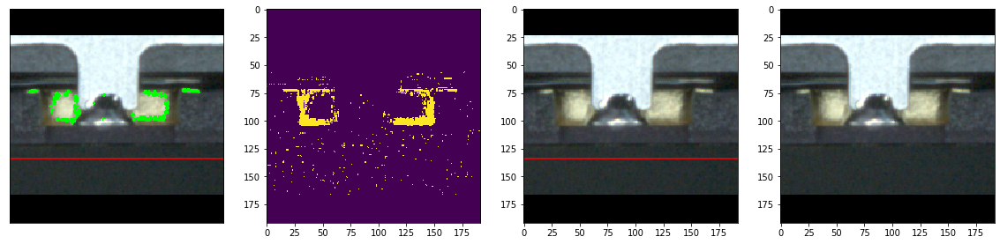

least two


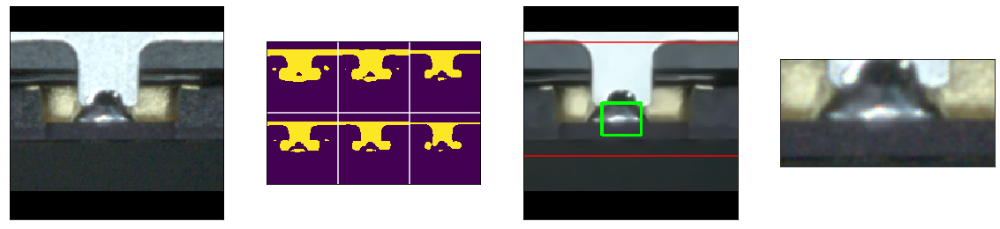

1 ==============================================================================================================
nothing


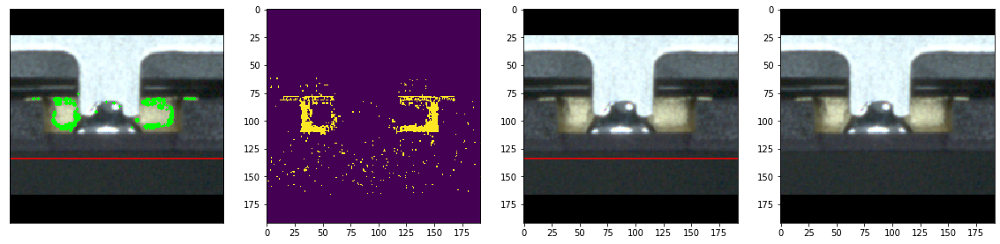

least two


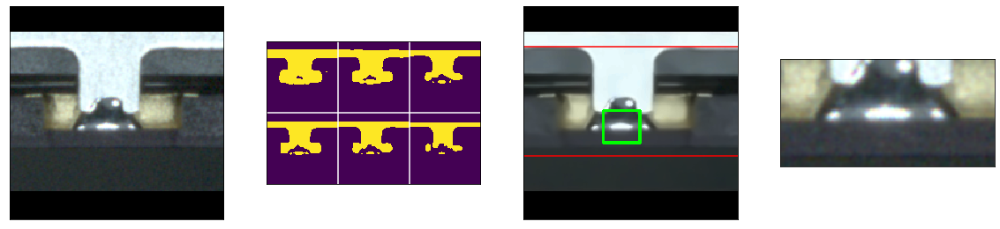

2 ==============================================================================================================
nothing


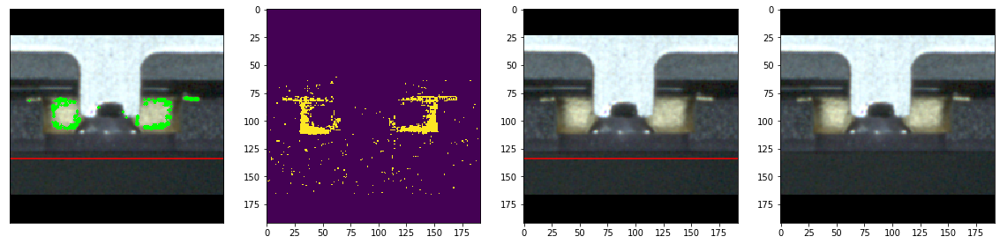

least two


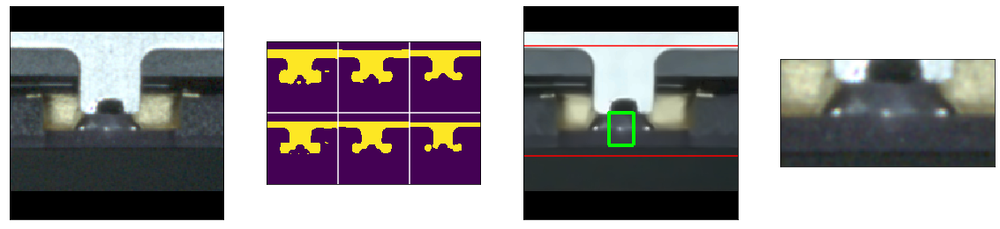

3 ==============================================================================================================
nothing


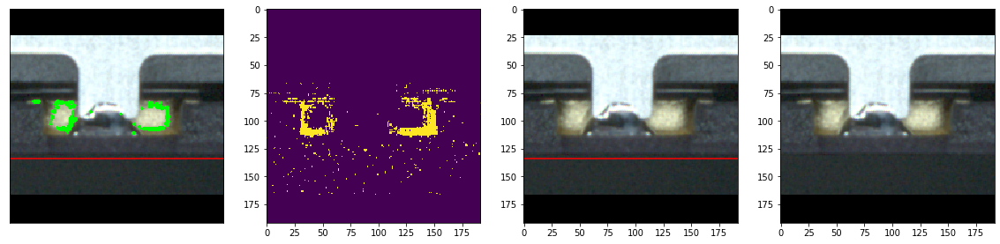

least two


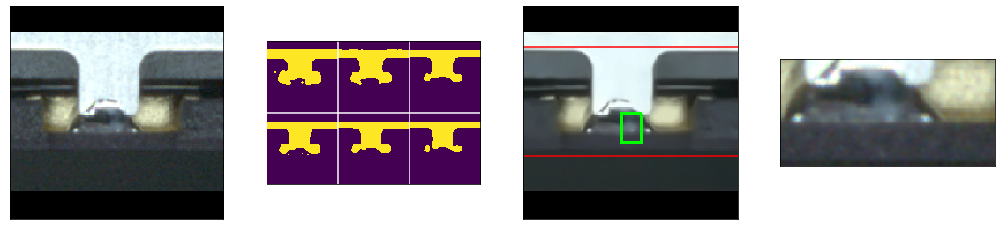

4 ==============================================================================================================
nothing


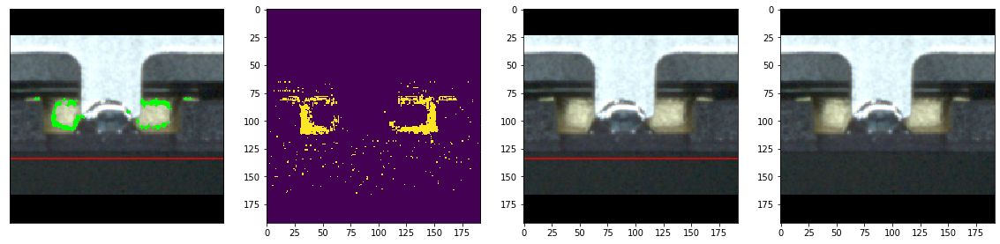

nothing


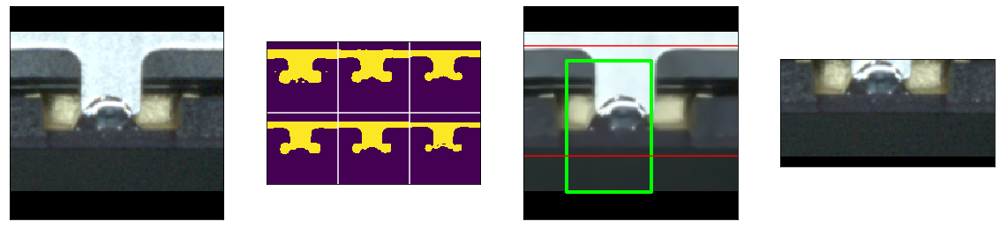

5 ==============================================================================================================
nothing


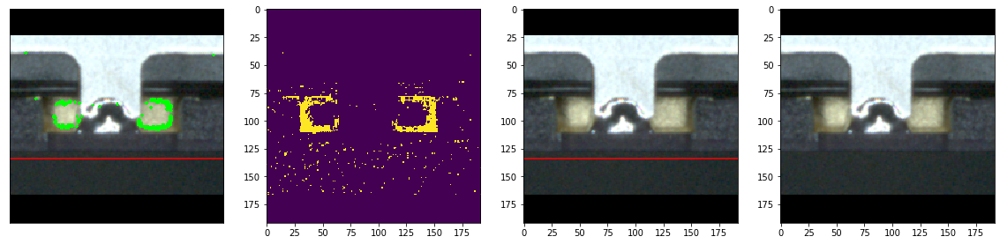

nothing


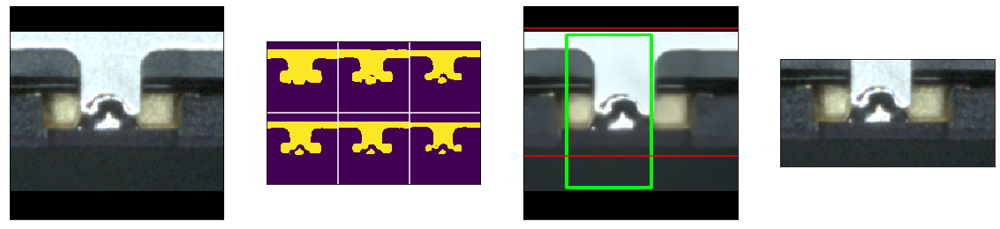

6 ==============================================================================================================
nothing


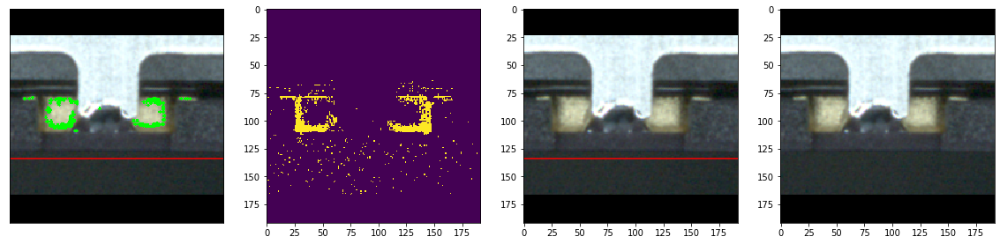

nothing


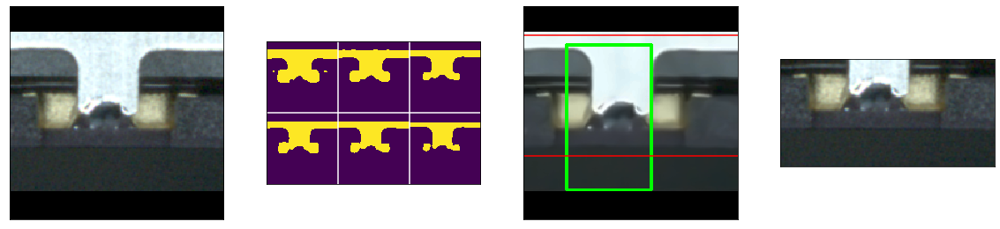

7 ==============================================================================================================
nothing


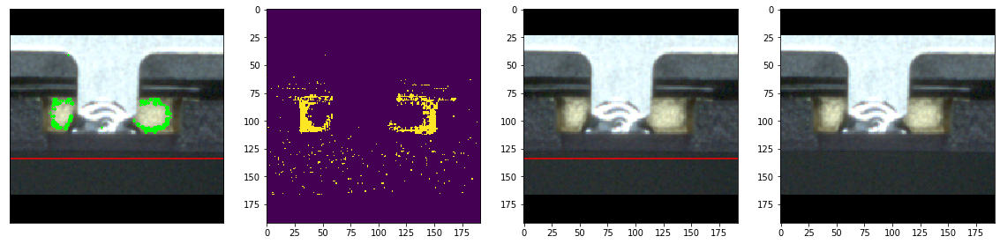

nothing


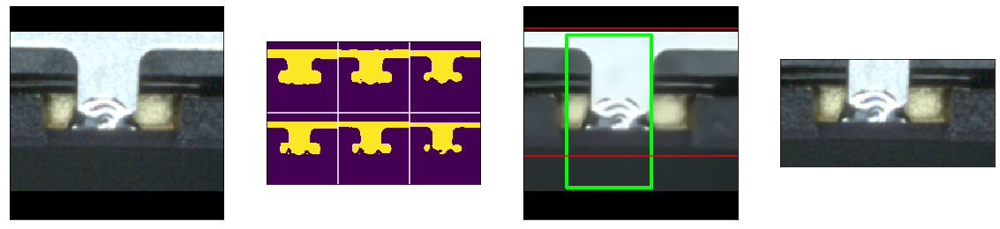

8 ==============================================================================================================
nothing


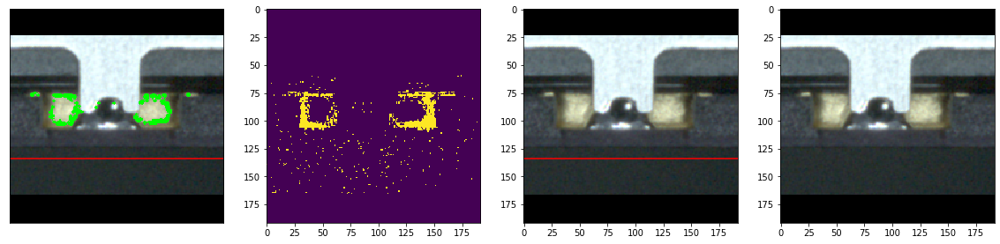

least two


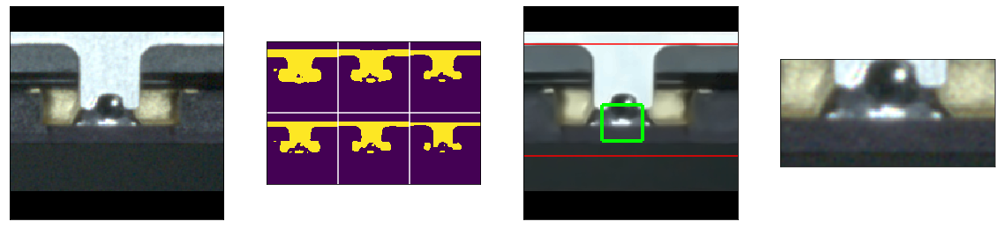

9 ==============================================================================================================
nothing


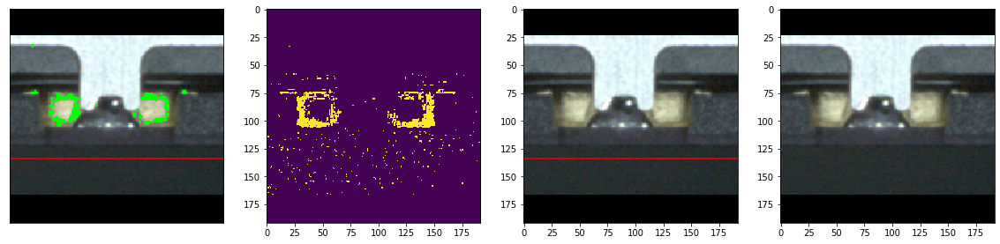

least two


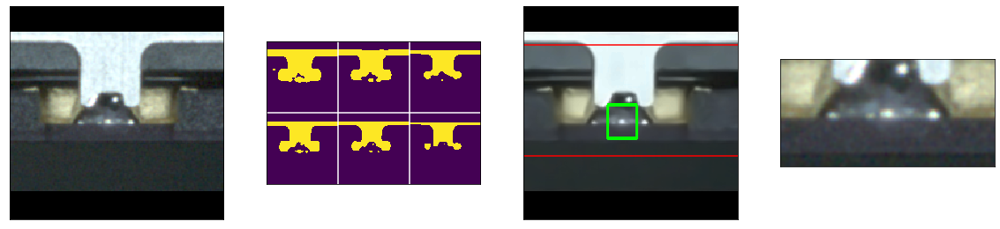

In [16]:
up_ng_det = up_detection(up_ok[1400:1410])

### (100, 200)

- 1개 이미지 당 약 2초 소요
- 일부를 수정 한다면 1초 대로 단축 가능할 것으로 예상..
    - 이미지를 display 하기위한 구현 부분 생략
    - 이미지를 크롭하는 수정
    - 이미지를 실제로 저장하지 않고 메모리 상에 바로 할당해 모델링

In [ ]:
# insp_ng_mini = detection(insp_ng, start=0, file_name='INSP_NG_2')

In [ ]:
%%time
insp_ng_mini = detection(insp_ng, start=0, file_name='INSP_NG_2')

In [ ]:
insp_ok_mini = detection(insp_ok, start=0, file_name='INSP_OK_2')

In [34]:
img_up_ok_det = detection_y(up_ok, path_list_up_ok)

1
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151906_620_Boat[CC0376_Row1_Col1]_Pos1.BMP
2
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151916_95_Boat[CC0376_Row2_Col1]_Pos1.BMP
3
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151926_923_Boat[CC0376_Row3_Col1]_Pos1.BMP
4
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151936_903_Boat[CC0376_Row4_Col1]_Pos1.BMP
5
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151946_833_Boat[CC0376_Row5_Col1]_Pos1.BMP
6
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_151956_375_Boat[CC0376_Row6_Col1]_Pos1.BMP
7
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152006_66_Boat[CC0376_Row7_Col1]_Pos1.BMP
8
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152016_357_Boat[CC0376_Row8_Col1]_Pos1.BMP
9
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152026_89_Boat[CC0376_Row9_Col1]_Pos1.BMP
10
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152035_411_Boat[CC0376_Row10_Col1]_Pos1.BMP
11
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152045_353_Boat[CC0376_Row11_Col1]_Pos1.BM

38
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152511_399_Boat[CC0376_Row11_Col4]_Pos1.BMP
39
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152521_550_Boat[CC0376_Row10_Col4]_Pos1.BMP
40
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152531_100_Boat[CC0376_Row9_Col4]_Pos1.BMP
41
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152540_854_Boat[CC0376_Row8_Col4]_Pos1.BMP
42
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152550_433_Boat[CC0376_Row7_Col4]_Pos1.BMP
43
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152600_424_Boat[CC0376_Row6_Col4]_Pos1.BMP
44
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152610_160_Boat[CC0376_Row5_Col4]_Pos1.BMP
45
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152619_549_Boat[CC0376_Row4_Col4]_Pos1.BMP
46
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152629_615_Boat[CC0376_Row3_Col4]_Pos1.BMP
47
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152639_342_Boat[CC0376_Row2_Col4]_Pos1.BMP
48
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_152648_729_Boat[CC0376_Row1_C

76
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160201_50_Boat[CC0087_Row9_Col2]_Pos1.BMP
77
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160210_452_Boat[CC0087_Row8_Col2]_Pos1.BMP
78
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160219_588_Boat[CC0087_Row7_Col2]_Pos1.BMP
79
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160228_725_Boat[CC0087_Row6_Col2]_Pos1.BMP
80
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160238_281_Boat[CC0087_Row5_Col2]_Pos1.BMP
81
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160247_682_Boat[CC0087_Row4_Col2]_Pos1.BMP
82
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160256_950_Boat[CC0087_Row3_Col2]_Pos1.BMP
83
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160306_63_Boat[CC0087_Row2_Col2]_Pos1.BMP
84
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160315_183_Boat[CC0087_Row1_Col2]_Pos1.BMP
85
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160324_300_Boat[CC0087_Row1_Col3]_Pos1.BMP
86
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160333_264_Boat[CC0087_Row2_Col3]

114
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160753_174_Boat[CC0087_Row6_Col5]_Pos1.BMP
115
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160802_140_Boat[CC0087_Row7_Col5]_Pos1.BMP
116
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160811_386_Boat[CC0087_Row8_Col5]_Pos1.BMP
117
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160820_961_Boat[CC0087_Row9_Col5]_Pos1.BMP
118
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160830_162_Boat[CC0087_Row10_Col5]_Pos1.BMP
119
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160839_455_Boat[CC0087_Row11_Col5]_Pos1.BMP
120
img2\OK\1-1-120\UP\POS_1\CAM_UP_POS1_20190919_160849_797_Boat[CC0087_Row12_Col5]_Pos1.BMP
121
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_151907_307_Boat[CC0376_Row1_Col1]_Pos2.BMP
122
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_151916_791_Boat[CC0376_Row2_Col1]_Pos2.BMP
123
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_151927_599_Boat[CC0376_Row3_Col1]_Pos2.BMP
124
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_151937_635_Boat[C

150
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152353_561_Boat[CC0376_Row6_Col3]_Pos2.BMP
151
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152402_782_Boat[CC0376_Row7_Col3]_Pos2.BMP
152
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152412_901_Boat[CC0376_Row8_Col3]_Pos2.BMP
153
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152422_953_Boat[CC0376_Row9_Col3]_Pos2.BMP
154
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152432_860_Boat[CC0376_Row10_Col3]_Pos2.BMP
155
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152442_396_Boat[CC0376_Row11_Col3]_Pos2.BMP
156
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152452_257_Boat[CC0376_Row12_Col3]_Pos2.BMP
157
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152502_128_Boat[CC0376_Row12_Col4]_Pos2.BMP
158
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152512_144_Boat[CC0376_Row11_Col4]_Pos2.BMP
159
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152522_268_Boat[CC0376_Row10_Col4]_Pos2.BMP
160
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_152531_826_Boa

186
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160029_661_Boat[CC0087_Row6_Col1]_Pos2.BMP
187
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160038_578_Boat[CC0087_Row7_Col1]_Pos2.BMP
188
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160047_696_Boat[CC0087_Row8_Col1]_Pos2.BMP
189
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160057_55_Boat[CC0087_Row9_Col1]_Pos2.BMP
190
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160106_303_Boat[CC0087_Row10_Col1]_Pos2.BMP
191
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160115_443_Boat[CC0087_Row11_Col1]_Pos2.BMP
192
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160124_537_Boat[CC0087_Row12_Col1]_Pos2.BMP
193
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160134_32_Boat[CC0087_Row12_Col2]_Pos2.BMP
194
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160143_303_Boat[CC0087_Row11_Col2]_Pos2.BMP
195
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160152_488_Boat[CC0087_Row10_Col2]_Pos2.BMP
196
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160201_778_Boat[

img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160603_66_Boat[CC0087_Row7_Col4]_Pos2.BMP
223
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160612_294_Boat[CC0087_Row6_Col4]_Pos2.BMP
224
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160621_738_Boat[CC0087_Row5_Col4]_Pos2.BMP
225
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160631_75_Boat[CC0087_Row4_Col4]_Pos2.BMP
226
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160640_172_Boat[CC0087_Row3_Col4]_Pos2.BMP
227
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160649_269_Boat[CC0087_Row2_Col4]_Pos2.BMP
228
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160658_496_Boat[CC0087_Row1_Col4]_Pos2.BMP
229
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160707_655_Boat[CC0087_Row1_Col5]_Pos2.BMP
230
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160716_879_Boat[CC0087_Row2_Col5]_Pos2.BMP
231
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160725_960_Boat[CC0087_Row3_Col5]_Pos2.BMP
232
img2\OK\1-1-120\UP\POS_2\CAM_UP_POS2_20190919_160735_271_Boat[CC0087_Row

262
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152234_209_Boat[CC0376_Row3_Col2]_Pos3.BMP
263
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152243_961_Boat[CC0376_Row2_Col2]_Pos3.BMP
264
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152253_855_Boat[CC0376_Row1_Col2]_Pos3.BMP
265
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152303_11_Boat[CC0376_Row1_Col3]_Pos3.BMP
266
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152313_819_Boat[CC0376_Row2_Col3]_Pos3.BMP
267
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152323_565_Boat[CC0376_Row3_Col3]_Pos3.BMP
268
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152333_943_Boat[CC0376_Row4_Col3]_Pos3.BMP
269
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152344_256_Boat[CC0376_Row5_Col3]_Pos3.BMP
270
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152353_961_Boat[CC0376_Row6_Col3]_Pos3.BMP
271
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152403_278_Boat[CC0376_Row7_Col3]_Pos3.BMP
272
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152413_346_Boat[CC037

298
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152902_898_Boat[CC0376_Row10_Col5]_Pos3.BMP
299
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152912_719_Boat[CC0376_Row11_Col5]_Pos3.BMP
300
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_152922_607_Boat[CC0376_Row12_Col5]_Pos3.BMP
301
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_155943_613_Boat[CC0087_Row1_Col1]_Pos3.BMP
302
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_155952_797_Boat[CC0087_Row2_Col1]_Pos3.BMP
303
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160002_200_Boat[CC0087_Row3_Col1]_Pos3.BMP
304
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160011_340_Boat[CC0087_Row4_Col1]_Pos3.BMP
305
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160020_829_Boat[CC0087_Row5_Col1]_Pos3.BMP
306
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160030_125_Boat[CC0087_Row6_Col1]_Pos3.BMP
307
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160039_20_Boat[CC0087_Row7_Col1]_Pos3.BMP
308
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160048_291_Boat[CC

334
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160447_518_Boat[CC0087_Row10_Col3]_Pos3.BMP
335
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160457_29_Boat[CC0087_Row11_Col3]_Pos3.BMP
336
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160506_563_Boat[CC0087_Row12_Col3]_Pos3.BMP
337
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160516_383_Boat[CC0087_Row12_Col4]_Pos3.BMP
338
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160525_588_Boat[CC0087_Row11_Col4]_Pos3.BMP
339
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160534_967_Boat[CC0087_Row10_Col4]_Pos3.BMP
340
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160544_300_Boat[CC0087_Row9_Col4]_Pos3.BMP
341
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160554_16_Boat[CC0087_Row8_Col4]_Pos3.BMP
342
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160603_465_Boat[CC0087_Row7_Col4]_Pos3.BMP
343
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160612_781_Boat[CC0087_Row6_Col4]_Pos3.BMP
344
img2\OK\1-1-120\UP\POS_3\CAM_UP_POS3_20190919_160622_224_Boat[

374
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152127_819_Boat[CC0087_Row11_Col2]_Pos1.BMP
375
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152137_335_Boat[CC0087_Row10_Col2]_Pos1.BMP
376
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152147_27_Boat[CC0087_Row9_Col2]_Pos1.BMP
377
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152157_63_Boat[CC0087_Row8_Col2]_Pos1.BMP
378
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152206_491_Boat[CC0087_Row7_Col2]_Pos1.BMP
379
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152216_215_Boat[CC0087_Row6_Col2]_Pos1.BMP
380
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152226_46_Boat[CC0087_Row5_Col2]_Pos1.BMP
381
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152235_679_Boat[CC0087_Row4_Col2]_Pos1.BMP
382
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152245_628_Boat[CC0087_Row3_Col2]_Pos1.BMP
383
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152255_326_Boat[CC0087_Row2_Col2]_Pos1.BMP
384
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152304_712_Boat[CC008

411
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152730_918_Boat[CC0087_Row3_Col5]_Pos1.BMP
412
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152741_144_Boat[CC0087_Row4_Col5]_Pos1.BMP
413
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152750_23_Boat[CC0087_Row5_Col5]_Pos1.BMP
414
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152759_295_Boat[CC0087_Row6_Col5]_Pos1.BMP
415
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152809_746_Boat[CC0087_Row7_Col5]_Pos1.BMP
416
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152819_26_Boat[CC0087_Row8_Col5]_Pos1.BMP
417
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152829_111_Boat[CC0087_Row9_Col5]_Pos1.BMP
418
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152839_197_Boat[CC0087_Row10_Col5]_Pos1.BMP
419
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152848_615_Boat[CC0087_Row11_Col5]_Pos1.BMP
420
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_152858_140_Boat[CC0087_Row12_Col5]_Pos1.BMP
421
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_155945_133_Boat[CC0

447
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160345_185_Boat[CC0088_Row3_Col3]_Pos1.BMP
448
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160354_145_Boat[CC0088_Row4_Col3]_Pos1.BMP
449
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160403_157_Boat[CC0088_Row5_Col3]_Pos1.BMP
450
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160412_348_Boat[CC0088_Row6_Col3]_Pos1.BMP
451
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160421_550_Boat[CC0088_Row7_Col3]_Pos1.BMP
452
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160430_774_Boat[CC0088_Row8_Col3]_Pos1.BMP
453
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160439_823_Boat[CC0088_Row9_Col3]_Pos1.BMP
454
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160449_116_Boat[CC0088_Row10_Col3]_Pos1.BMP
455
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160458_803_Boat[CC0088_Row11_Col3]_Pos1.BMP
456
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160507_855_Boat[CC0088_Row12_Col3]_Pos1.BMP
457
img2\OK\1-2-120\UP\POS_1\CAM_UP_POS1_20190919_160517_766_Boat[C

485
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152003_604_Boat[CC0087_Row5_Col1]_Pos2.BMP
486
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152012_832_Boat[CC0087_Row6_Col1]_Pos2.BMP
487
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152021_934_Boat[CC0087_Row7_Col1]_Pos2.BMP
488
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152031_158_Boat[CC0087_Row8_Col1]_Pos2.BMP
489
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152040_185_Boat[CC0087_Row9_Col1]_Pos2.BMP
490
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152049_386_Boat[CC0087_Row10_Col1]_Pos2.BMP
491
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152059_42_Boat[CC0087_Row11_Col1]_Pos2.BMP
492
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152109_460_Boat[CC0087_Row12_Col1]_Pos2.BMP
493
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152118_956_Boat[CC0087_Row12_Col2]_Pos2.BMP
494
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152128_484_Boat[CC0087_Row11_Col2]_Pos2.BMP
495
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152138_4_Boat[CC

img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152554_105_Boat[CC0087_Row8_Col4]_Pos2.BMP
522
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152604_56_Boat[CC0087_Row7_Col4]_Pos2.BMP
523
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152613_762_Boat[CC0087_Row6_Col4]_Pos2.BMP
524
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152623_437_Boat[CC0087_Row5_Col4]_Pos2.BMP
525
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152633_0_Boat[CC0087_Row4_Col4]_Pos2.BMP
526
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152642_947_Boat[CC0087_Row3_Col4]_Pos2.BMP
527
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152652_194_Boat[CC0087_Row2_Col4]_Pos2.BMP
528
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152702_387_Boat[CC0087_Row1_Col4]_Pos2.BMP
529
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152712_345_Boat[CC0087_Row1_Col5]_Pos2.BMP
530
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152722_36_Boat[CC0087_Row2_Col5]_Pos2.BMP
531
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_152731_573_Boat[CC0087_Row3_

559
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160232_187_Boat[CC0088_Row6_Col2]_Pos2.BMP
560
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160241_566_Boat[CC0088_Row5_Col2]_Pos2.BMP
561
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160251_142_Boat[CC0088_Row4_Col2]_Pos2.BMP
562
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160300_413_Boat[CC0088_Row3_Col2]_Pos2.BMP
563
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160309_511_Boat[CC0088_Row2_Col2]_Pos2.BMP
564
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160318_408_Boat[CC0088_Row1_Col2]_Pos2.BMP
565
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160327_551_Boat[CC0088_Row1_Col3]_Pos2.BMP
566
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160336_601_Boat[CC0088_Row2_Col3]_Pos2.BMP
567
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160345_825_Boat[CC0088_Row3_Col3]_Pos2.BMP
568
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160354_838_Boat[CC0088_Row4_Col3]_Pos2.BMP
569
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160403_894_Boat[CC00

595
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160805_457_Boat[CC0088_Row7_Col5]_Pos2.BMP
596
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160814_572_Boat[CC0088_Row8_Col5]_Pos2.BMP
597
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160824_453_Boat[CC0088_Row9_Col5]_Pos2.BMP
598
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160833_546_Boat[CC0088_Row10_Col5]_Pos2.BMP
599
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160842_968_Boat[CC0088_Row11_Col5]_Pos2.BMP
600
img2\OK\1-2-120\UP\POS_2\CAM_UP_POS2_20190919_160852_881_Boat[CC0088_Row12_Col5]_Pos2.BMP
601
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_151924_747_Boat[CC0087_Row1_Col1]_Pos3.BMP
602
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_151934_235_Boat[CC0087_Row2_Col1]_Pos3.BMP
603
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_151944_308_Boat[CC0087_Row3_Col1]_Pos3.BMP
604
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_151953_994_Boat[CC0087_Row4_Col1]_Pos3.BMP
605
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152003_979_Boat[C

631
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152416_893_Boat[CC0087_Row7_Col3]_Pos3.BMP
632
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152426_233_Boat[CC0087_Row8_Col3]_Pos3.BMP
633
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152436_76_Boat[CC0087_Row9_Col3]_Pos3.BMP
634
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152445_800_Boat[CC0087_Row10_Col3]_Pos3.BMP
635
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152456_433_Boat[CC0087_Row11_Col3]_Pos3.BMP
636
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152506_257_Boat[CC0087_Row12_Col3]_Pos3.BMP
637
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152515_593_Boat[CC0087_Row12_Col4]_Pos3.BMP
638
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152525_447_Boat[CC0087_Row11_Col4]_Pos3.BMP
639
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152535_233_Boat[CC0087_Row10_Col4]_Pos3.BMP
640
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152545_66_Boat[CC0087_Row9_Col4]_Pos3.BMP
641
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_152554_529_Boat[

669
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160100_207_Boat[CC0088_Row9_Col1]_Pos3.BMP
670
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160109_454_Boat[CC0088_Row10_Col1]_Pos3.BMP
671
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160118_593_Boat[CC0088_Row11_Col1]_Pos3.BMP
672
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160127_444_Boat[CC0088_Row12_Col1]_Pos3.BMP
673
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160137_153_Boat[CC0088_Row12_Col2]_Pos3.BMP
674
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160146_471_Boat[CC0088_Row11_Col2]_Pos3.BMP
675
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160155_607_Boat[CC0088_Row10_Col2]_Pos3.BMP
676
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160204_743_Boat[CC0088_Row9_Col2]_Pos3.BMP
677
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160214_394_Boat[CC0088_Row8_Col2]_Pos3.BMP
678
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160223_752_Boat[CC0088_Row7_Col2]_Pos3.BMP
679
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160232_697_Boa

706
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160643_549_Boat[CC0088_Row3_Col4]_Pos3.BMP
707
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160652_521_Boat[CC0088_Row2_Col4]_Pos3.BMP
708
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160701_703_Boat[CC0088_Row1_Col4]_Pos3.BMP
709
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160710_621_Boat[CC0088_Row1_Col5]_Pos3.BMP
710
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160719_999_Boat[CC0088_Row2_Col5]_Pos3.BMP
711
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160728_963_Boat[CC0088_Row3_Col5]_Pos3.BMP
712
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160738_278_Boat[CC0088_Row4_Col5]_Pos3.BMP
713
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160747_751_Boat[CC0088_Row5_Col5]_Pos3.BMP
714
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160756_978_Boat[CC0088_Row6_Col5]_Pos3.BMP
715
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160805_921_Boat[CC0088_Row7_Col5]_Pos3.BMP
716
img2\OK\1-2-120\UP\POS_3\CAM_UP_POS3_20190919_160815_58_Boat[CC008

742
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152335_516_Boat[CC0088_Row3_Col2]_Pos1.BMP
743
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152345_308_Boat[CC0088_Row2_Col2]_Pos1.BMP
744
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152354_793_Boat[CC0088_Row1_Col2]_Pos1.BMP
745
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152404_194_Boat[CC0088_Row1_Col3]_Pos1.BMP
746
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152414_546_Boat[CC0088_Row2_Col3]_Pos1.BMP
747
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152425_166_Boat[CC0088_Row3_Col3]_Pos1.BMP
748
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152434_955_Boat[CC0088_Row4_Col3]_Pos1.BMP
749
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152444_494_Boat[CC0088_Row5_Col3]_Pos1.BMP
750
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152454_372_Boat[CC0088_Row6_Col3]_Pos1.BMP
751
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152505_69_Boat[CC0088_Row7_Col3]_Pos1.BMP
752
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152514_820_Boat[CC008

780
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_152951_462_Boat[CC0088_Row12_Col5]_Pos1.BMP
781
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154705_23_Boat[CC0376_Row1_Col1]_Pos1.BMP
782
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154715_748_Boat[CC0376_Row2_Col1]_Pos1.BMP
783
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154725_176_Boat[CC0376_Row3_Col1]_Pos1.BMP
784
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154734_599_Boat[CC0376_Row4_Col1]_Pos1.BMP
785
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154743_830_Boat[CC0376_Row5_Col1]_Pos1.BMP
786
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154753_43_Boat[CC0376_Row6_Col1]_Pos1.BMP
787
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154802_608_Boat[CC0376_Row7_Col1]_Pos1.BMP
788
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154811_686_Boat[CC0376_Row8_Col1]_Pos1.BMP
789
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154820_930_Boat[CC0376_Row9_Col1]_Pos1.BMP
790
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_154830_295_Boat[CC037

817
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155257_418_Boat[CC0376_Row12_Col4]_Pos1.BMP
818
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155306_657_Boat[CC0376_Row11_Col4]_Pos1.BMP
819
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155315_800_Boat[CC0376_Row10_Col4]_Pos1.BMP
820
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155325_78_Boat[CC0376_Row9_Col4]_Pos1.BMP
821
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155334_812_Boat[CC0376_Row8_Col4]_Pos1.BMP
822
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155344_451_Boat[CC0376_Row7_Col4]_Pos1.BMP
823
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155354_811_Boat[CC0376_Row6_Col4]_Pos1.BMP
824
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155404_88_Boat[CC0376_Row5_Col4]_Pos1.BMP
825
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155414_681_Boat[CC0376_Row4_Col4]_Pos1.BMP
826
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155424_613_Boat[CC0376_Row3_Col4]_Pos1.BMP
827
img2\OK\2-1-120\UP\POS_1\CAM_UP_POS1_20190919_155433_905_Boat[CC0

853
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152209_110_Boat[CC0088_Row12_Col2]_Pos2.BMP
854
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152218_322_Boat[CC0088_Row11_Col2]_Pos2.BMP
855
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152228_514_Boat[CC0088_Row10_Col2]_Pos2.BMP
856
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152237_880_Boat[CC0088_Row9_Col2]_Pos2.BMP
857
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152247_217_Boat[CC0088_Row8_Col2]_Pos2.BMP
858
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152256_738_Boat[CC0088_Row7_Col2]_Pos2.BMP
859
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152306_318_Boat[CC0088_Row6_Col2]_Pos2.BMP
860
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152315_801_Boat[CC0088_Row5_Col2]_Pos2.BMP
861
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152326_410_Boat[CC0088_Row4_Col2]_Pos2.BMP
862
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152336_292_Boat[CC0088_Row3_Col2]_Pos2.BMP
863
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152346_108_Boat[C

889
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152803_902_Boat[CC0088_Row1_Col5]_Pos2.BMP
890
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152813_229_Boat[CC0088_Row2_Col5]_Pos2.BMP
891
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152822_770_Boat[CC0088_Row3_Col5]_Pos2.BMP
892
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152832_832_Boat[CC0088_Row4_Col5]_Pos2.BMP
893
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152842_415_Boat[CC0088_Row5_Col5]_Pos2.BMP
894
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152853_585_Boat[CC0088_Row6_Col5]_Pos2.BMP
895
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152902_640_Boat[CC0088_Row7_Col5]_Pos2.BMP
896
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152912_498_Boat[CC0088_Row8_Col5]_Pos2.BMP
897
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152922_200_Boat[CC0088_Row9_Col5]_Pos2.BMP
898
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152931_342_Boat[CC0088_Row10_Col5]_Pos2.BMP
899
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_152940_974_Boat[CC0

930
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155147_475_Boat[CC0376_Row6_Col3]_Pos2.BMP
931
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155157_391_Boat[CC0376_Row7_Col3]_Pos2.BMP
932
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155207_269_Boat[CC0376_Row8_Col3]_Pos2.BMP
933
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155217_744_Boat[CC0376_Row9_Col3]_Pos2.BMP
934
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155228_413_Boat[CC0376_Row10_Col3]_Pos2.BMP
935
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155238_638_Boat[CC0376_Row11_Col3]_Pos2.BMP
936
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155248_728_Boat[CC0376_Row12_Col3]_Pos2.BMP
937
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155258_58_Boat[CC0376_Row12_Col4]_Pos2.BMP
938
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155307_411_Boat[CC0376_Row11_Col4]_Pos2.BMP
939
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155316_495_Boat[CC0376_Row10_Col4]_Pos2.BMP
940
img2\OK\2-1-120\UP\POS_2\CAM_UP_POS2_20190919_155325_696_Boat

969
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152131_33_Boat[CC0088_Row9_Col1]_Pos3.BMP
970
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152140_829_Boat[CC0088_Row10_Col1]_Pos3.BMP
971
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152150_396_Boat[CC0088_Row11_Col1]_Pos3.BMP
972
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152159_954_Boat[CC0088_Row12_Col1]_Pos3.BMP
973
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152209_592_Boat[CC0088_Row12_Col2]_Pos3.BMP
974
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152218_741_Boat[CC0088_Row11_Col2]_Pos3.BMP
975
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152228_964_Boat[CC0088_Row10_Col2]_Pos3.BMP
976
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152238_361_Boat[CC0088_Row9_Col2]_Pos3.BMP
977
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152247_704_Boat[CC0088_Row8_Col2]_Pos3.BMP
978
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152257_173_Boat[CC0088_Row7_Col2]_Pos3.BMP
979
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152306_934_Boat

1008
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152753_771_Boat[CC0088_Row1_Col4]_Pos3.BMP
1009
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152804_749_Boat[CC0088_Row1_Col5]_Pos3.BMP
1010
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152813_665_Boat[CC0088_Row2_Col5]_Pos3.BMP
1011
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152823_244_Boat[CC0088_Row3_Col5]_Pos3.BMP
1012
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152833_292_Boat[CC0088_Row4_Col5]_Pos3.BMP
1013
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152844_773_Boat[CC0088_Row5_Col5]_Pos3.BMP
1014
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152854_40_Boat[CC0088_Row6_Col5]_Pos3.BMP
1015
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152903_40_Boat[CC0088_Row7_Col5]_Pos3.BMP
1016
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152913_74_Boat[CC0088_Row8_Col5]_Pos3.BMP
1017
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152923_165_Boat[CC0088_Row9_Col5]_Pos3.BMP
1018
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_152931_797_B

1045
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155059_284_Boat[CC0376_Row1_Col3]_Pos3.BMP
1046
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155108_563_Boat[CC0376_Row2_Col3]_Pos3.BMP
1047
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155118_677_Boat[CC0376_Row3_Col3]_Pos3.BMP
1048
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155128_984_Boat[CC0376_Row4_Col3]_Pos3.BMP
1049
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155138_785_Boat[CC0376_Row5_Col3]_Pos3.BMP
1050
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155148_40_Boat[CC0376_Row6_Col3]_Pos3.BMP
1051
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155157_877_Boat[CC0376_Row7_Col3]_Pos3.BMP
1052
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155207_742_Boat[CC0376_Row8_Col3]_Pos3.BMP
1053
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155218_393_Boat[CC0376_Row9_Col3]_Pos3.BMP
1054
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155228_993_Boat[CC0376_Row10_Col3]_Pos3.BMP
1055
img2\OK\2-1-120\UP\POS_3\CAM_UP_POS3_20190919_155239_15

1081
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152044_92_Boat[CC0261_Row1_Col1]_Pos1.BMP
1082
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152053_616_Boat[CC0261_Row2_Col1]_Pos1.BMP
1083
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152103_759_Boat[CC0261_Row3_Col1]_Pos1.BMP
1084
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152113_181_Boat[CC0261_Row4_Col1]_Pos1.BMP
1085
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152123_79_Boat[CC0261_Row5_Col1]_Pos1.BMP
1086
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152132_870_Boat[CC0261_Row6_Col1]_Pos1.BMP
1087
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152142_528_Boat[CC0261_Row7_Col1]_Pos1.BMP
1088
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152152_73_Boat[CC0261_Row8_Col1]_Pos1.BMP
1089
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152201_705_Boat[CC0261_Row9_Col1]_Pos1.BMP
1090
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152211_186_Boat[CC0261_Row10_Col1]_Pos1.BMP
1091
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152221_201_

1120
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152713_804_Boat[CC0261_Row9_Col4]_Pos1.BMP
1121
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152723_783_Boat[CC0261_Row8_Col4]_Pos1.BMP
1122
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152733_829_Boat[CC0261_Row7_Col4]_Pos1.BMP
1123
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152745_54_Boat[CC0261_Row6_Col4]_Pos1.BMP
1124
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152755_636_Boat[CC0261_Row5_Col4]_Pos1.BMP
1125
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152806_180_Boat[CC0261_Row4_Col4]_Pos1.BMP
1126
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152815_615_Boat[CC0261_Row3_Col4]_Pos1.BMP
1127
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152825_640_Boat[CC0261_Row2_Col4]_Pos1.BMP
1128
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152836_104_Boat[CC0261_Row1_Col4]_Pos1.BMP
1129
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152846_220_Boat[CC0261_Row1_Col5]_Pos1.BMP
1130
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_152856_880

img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154945_789_Boat[CC0261_Row8_Col2]_Pos1.BMP
1158
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_154956_838_Boat[CC0261_Row7_Col2]_Pos1.BMP
1159
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155007_209_Boat[CC0261_Row6_Col2]_Pos1.BMP
1160
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155017_176_Boat[CC0261_Row5_Col2]_Pos1.BMP
1161
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155026_836_Boat[CC0261_Row4_Col2]_Pos1.BMP
1162
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155036_576_Boat[CC0261_Row3_Col2]_Pos1.BMP
1163
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155045_441_Boat[CC0261_Row2_Col2]_Pos1.BMP
1164
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155054_459_Boat[CC0261_Row1_Col2]_Pos1.BMP
1165
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155104_588_Boat[CC0261_Row1_Col3]_Pos1.BMP
1166
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155114_591_Boat[CC0261_Row2_Col3]_Pos1.BMP
1167
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155124_595_Boa

1197
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155614_402_Boat[CC0261_Row9_Col5]_Pos1.BMP
1198
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155625_159_Boat[CC0261_Row10_Col5]_Pos1.BMP
1199
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155635_402_Boat[CC0261_Row11_Col5]_Pos1.BMP
1200
img2\OK\2-2-120\UP\POS_1\CAM_UP_POS1_20190919_155645_837_Boat[CC0261_Row12_Col5]_Pos1.BMP
1201
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152044_787_Boat[CC0261_Row1_Col1]_Pos2.BMP
1202
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152054_267_Boat[CC0261_Row2_Col1]_Pos2.BMP
1203
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152104_420_Boat[CC0261_Row3_Col1]_Pos2.BMP
1204
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152113_829_Boat[CC0261_Row4_Col1]_Pos2.BMP
1205
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152123_765_Boat[CC0261_Row5_Col1]_Pos2.BMP
1206
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152133_569_Boat[CC0261_Row6_Col1]_Pos2.BMP
1207
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152143

1237
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152645_576_Boat[CC0261_Row12_Col4]_Pos2.BMP
1238
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152655_84_Boat[CC0261_Row11_Col4]_Pos2.BMP
1239
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152704_638_Boat[CC0261_Row10_Col4]_Pos2.BMP
1240
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152714_438_Boat[CC0261_Row9_Col4]_Pos2.BMP
1241
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152724_400_Boat[CC0261_Row8_Col4]_Pos2.BMP
1242
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152734_501_Boat[CC0261_Row7_Col4]_Pos2.BMP
1243
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152745_746_Boat[CC0261_Row6_Col4]_Pos2.BMP
1244
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152756_287_Boat[CC0261_Row5_Col4]_Pos2.BMP
1245
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152806_863_Boat[CC0261_Row4_Col4]_Pos2.BMP
1246
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152816_293_Boat[CC0261_Row3_Col4]_Pos2.BMP
1247
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_152826_

1276
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154936_488_Boat[CC0261_Row9_Col2]_Pos2.BMP
1277
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154946_576_Boat[CC0261_Row8_Col2]_Pos2.BMP
1278
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_154957_608_Boat[CC0261_Row7_Col2]_Pos2.BMP
1279
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155008_14_Boat[CC0261_Row6_Col2]_Pos2.BMP
1280
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155017_881_Boat[CC0261_Row5_Col2]_Pos2.BMP
1281
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155027_631_Boat[CC0261_Row4_Col2]_Pos2.BMP
1282
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155037_276_Boat[CC0261_Row3_Col2]_Pos2.BMP
1283
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155046_149_Boat[CC0261_Row2_Col2]_Pos2.BMP
1284
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155055_98_Boat[CC0261_Row1_Col2]_Pos2.BMP
1285
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155105_294_Boat[CC0261_Row1_Col3]_Pos2.BMP
1286
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155115_319_

img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155525_934_Boat[CC0261_Row4_Col5]_Pos2.BMP
1313
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155536_298_Boat[CC0261_Row5_Col5]_Pos2.BMP
1314
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155545_281_Boat[CC0261_Row6_Col5]_Pos2.BMP
1315
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155555_282_Boat[CC0261_Row7_Col5]_Pos2.BMP
1316
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155604_976_Boat[CC0261_Row8_Col5]_Pos2.BMP
1317
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155615_168_Boat[CC0261_Row9_Col5]_Pos2.BMP
1318
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155625_889_Boat[CC0261_Row10_Col5]_Pos2.BMP
1319
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155636_105_Boat[CC0261_Row11_Col5]_Pos2.BMP
1320
img2\OK\2-2-120\UP\POS_2\CAM_UP_POS2_20190919_155646_547_Boat[CC0261_Row12_Col5]_Pos2.BMP
1321
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152045_287_Boat[CC0261_Row1_Col1]_Pos3.BMP
1322
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152054_747_

img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152509_323_Boat[CC0261_Row4_Col3]_Pos3.BMP
1349
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152518_533_Boat[CC0261_Row5_Col3]_Pos3.BMP
1350
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152528_373_Boat[CC0261_Row6_Col3]_Pos3.BMP
1351
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152538_207_Boat[CC0261_Row7_Col3]_Pos3.BMP
1352
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152547_993_Boat[CC0261_Row8_Col3]_Pos3.BMP
1353
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152557_643_Boat[CC0261_Row9_Col3]_Pos3.BMP
1354
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152607_999_Boat[CC0261_Row10_Col3]_Pos3.BMP
1355
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152617_616_Boat[CC0261_Row11_Col3]_Pos3.BMP
1356
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152627_645_Boat[CC0261_Row12_Col3]_Pos3.BMP
1357
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152645_990_Boat[CC0261_Row12_Col4]_Pos3.BMP
1358
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_152655_565

1386
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154758_626_Boat[CC0261_Row6_Col1]_Pos3.BMP
1387
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154808_215_Boat[CC0261_Row7_Col1]_Pos3.BMP
1388
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154818_78_Boat[CC0261_Row8_Col1]_Pos3.BMP
1389
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154827_917_Boat[CC0261_Row9_Col1]_Pos3.BMP
1390
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154837_703_Boat[CC0261_Row10_Col1]_Pos3.BMP
1391
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154847_677_Boat[CC0261_Row11_Col1]_Pos3.BMP
1392
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154857_673_Boat[CC0261_Row12_Col1]_Pos3.BMP
1393
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154907_540_Boat[CC0261_Row12_Col2]_Pos3.BMP
1394
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154917_531_Boat[CC0261_Row11_Col2]_Pos3.BMP
1395
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_154926_707_Boat[CC0261_Row10_Col2]_Pos3.BMP
1396
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_1549

1425
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155419_209_Boat[CC0261_Row4_Col4]_Pos3.BMP
1426
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155428_412_Boat[CC0261_Row3_Col4]_Pos3.BMP
1427
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155439_77_Boat[CC0261_Row2_Col4]_Pos3.BMP
1428
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155448_653_Boat[CC0261_Row1_Col4]_Pos3.BMP
1429
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155457_706_Boat[CC0261_Row1_Col5]_Pos3.BMP
1430
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155507_325_Boat[CC0261_Row2_Col5]_Pos3.BMP
1431
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155516_488_Boat[CC0261_Row3_Col5]_Pos3.BMP
1432
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155526_369_Boat[CC0261_Row4_Col5]_Pos3.BMP
1433
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155536_813_Boat[CC0261_Row5_Col5]_Pos3.BMP
1434
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155545_683_Boat[CC0261_Row6_Col5]_Pos3.BMP
1435
img2\OK\2-2-120\UP\POS_3\CAM_UP_POS3_20190919_155555_783

0
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_142721_650_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


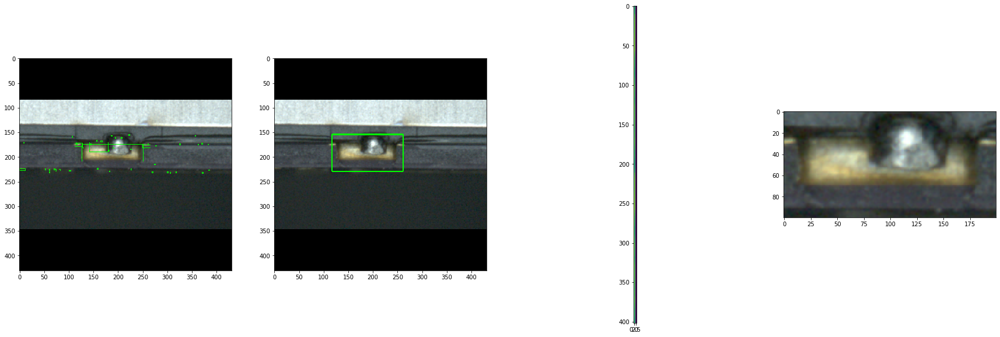

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
1
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_142721_650_Boat[_Col1_Row1]_Pos1.BMP
2
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_150211_49_Boat[_Col1_Row1]_Pos1.BMP
2
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153238_267_Boat[_Col1_Row2]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


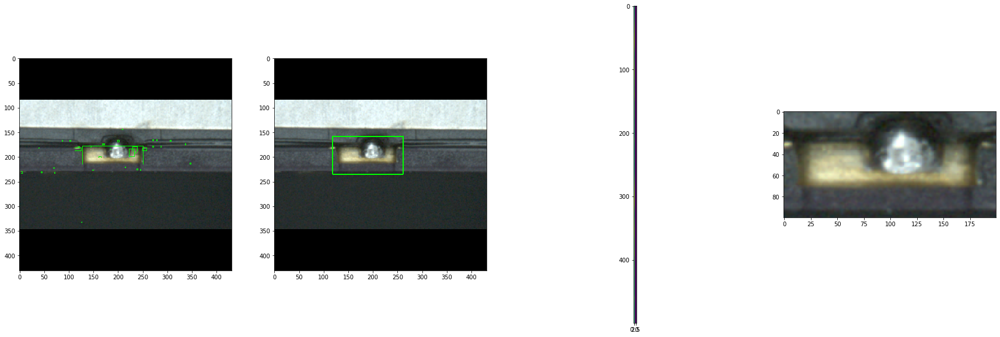

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
3
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153238_267_Boat[_Col1_Row2]_Pos1.BMP
3
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153711_461_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


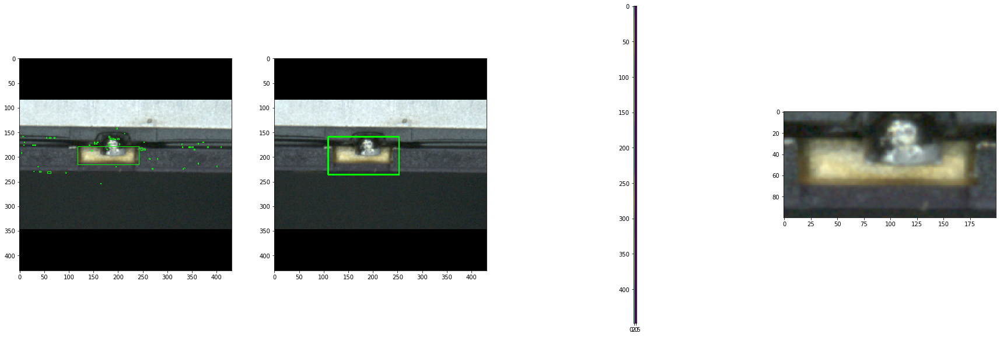

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
4
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153711_461_Boat[_Col1_Row1]_Pos1.BMP
4
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153714_255_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


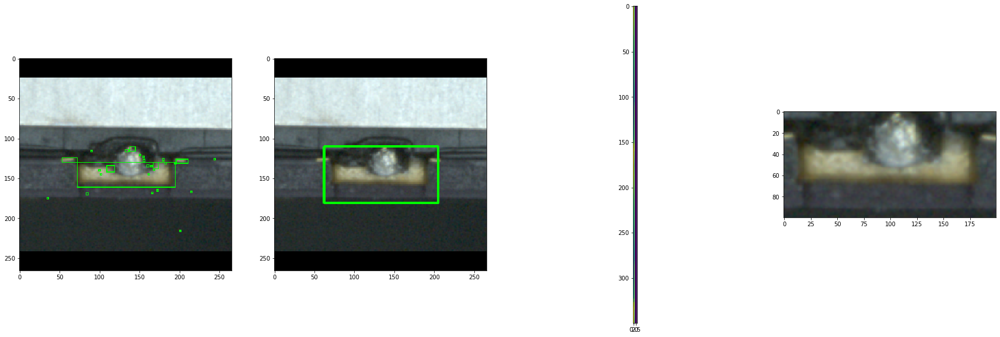

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
5
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153714_255_Boat[_Col1_Row1]_Pos1.BMP
5
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153720_627_Boat[_Col1_Row2]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


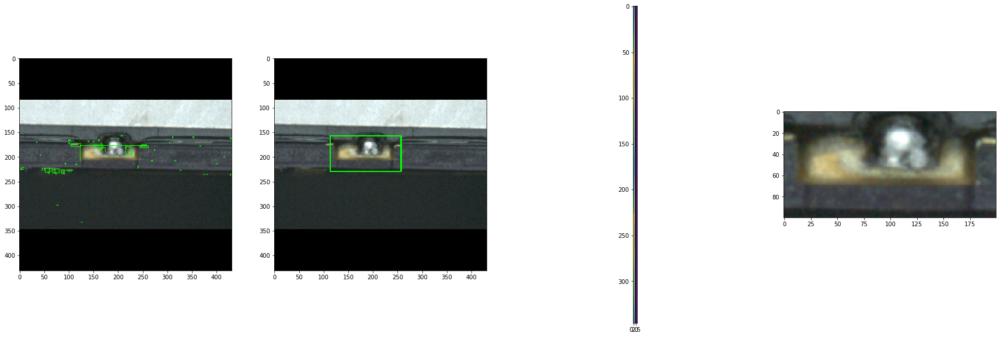

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
6
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_153720_627_Boat[_Col1_Row2]_Pos1.BMP
6
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_155258_863_Boat[_Col1_Row5]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


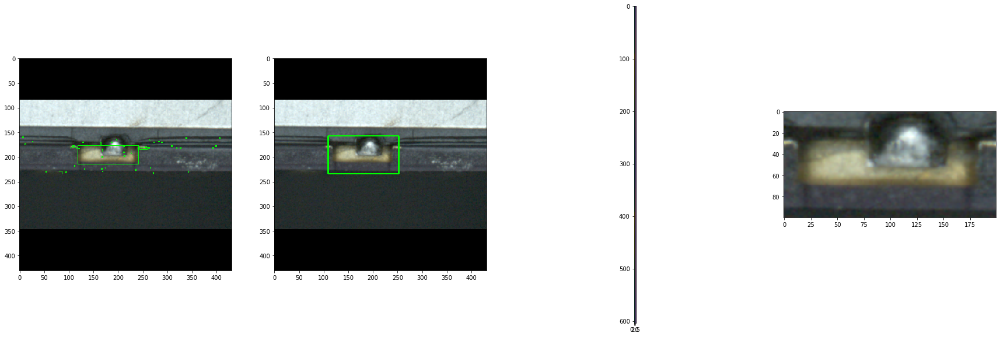

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
7
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_155258_863_Boat[_Col1_Row5]_Pos1.BMP
7
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160151_981_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


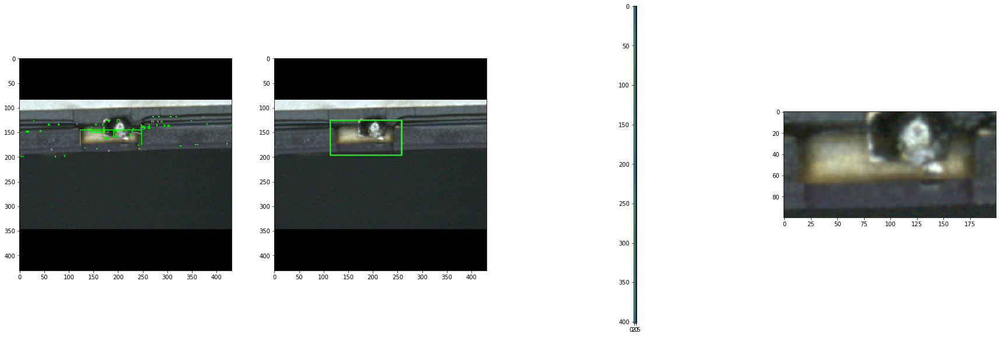

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
8
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160151_981_Boat[_Col1_Row1]_Pos1.BMP
8
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160409_682_Boat[_Col1_Row4]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


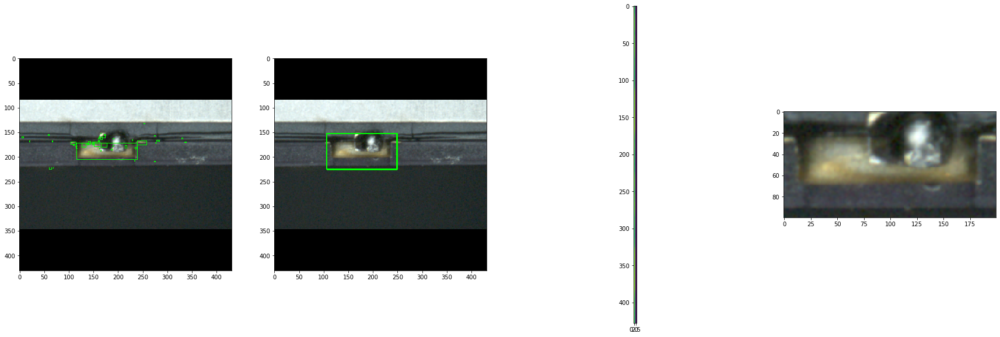

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
9
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160409_682_Boat[_Col1_Row4]_Pos1.BMP
10
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160503_314_Boat[_Col1_Row10]_Pos1.BMP
10
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160508_36_Boat[_Col1_Row10]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


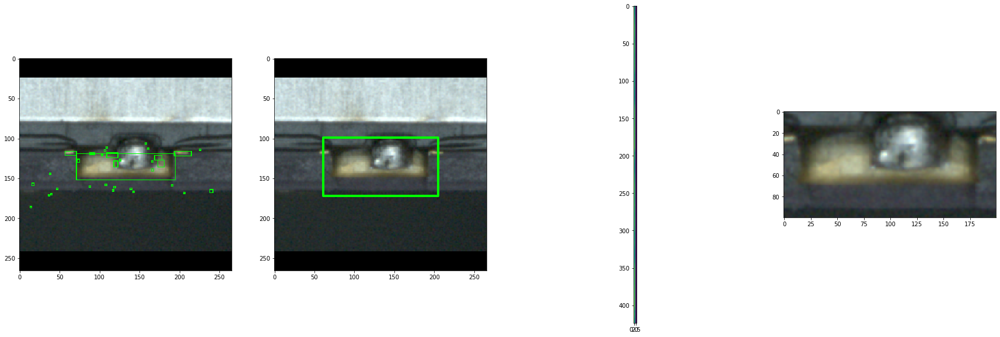

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
11
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_160508_36_Boat[_Col1_Row10]_Pos1.BMP
11
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_163833_707_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


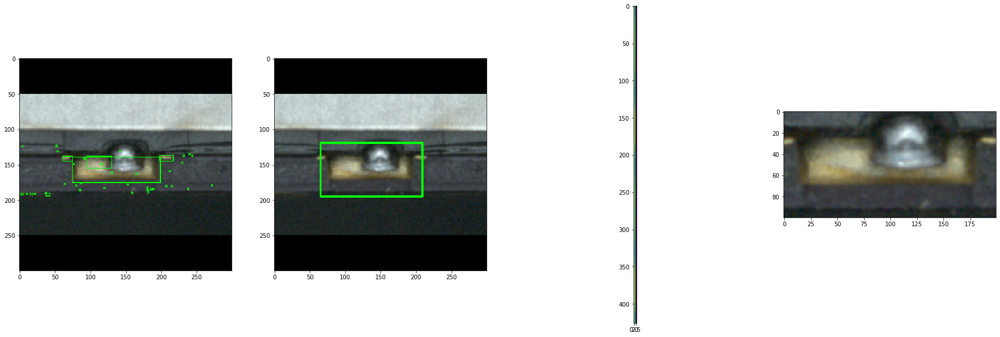

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
12
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_163833_707_Boat[_Col1_Row1]_Pos1.BMP
13
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_164537_450_Boat[_Col1_Row2]_Pos1.BMP
13
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165145_535_Boat[_Col1_Row3]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


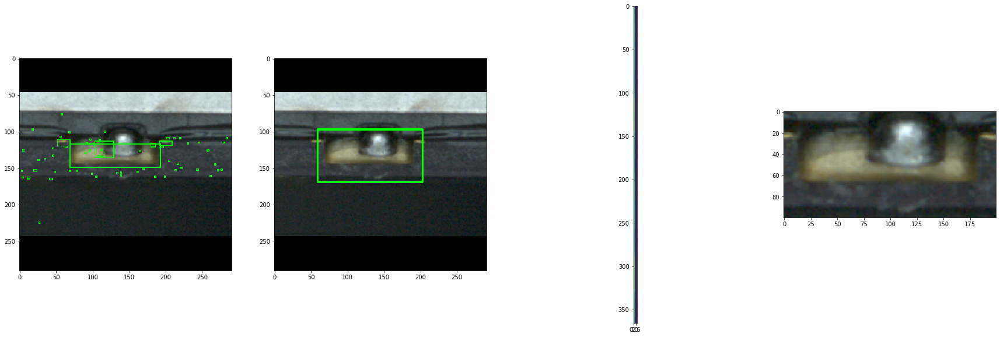

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
14
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165145_535_Boat[_Col1_Row3]_Pos1.BMP
14
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165148_37_Boat[_Col1_Row5]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


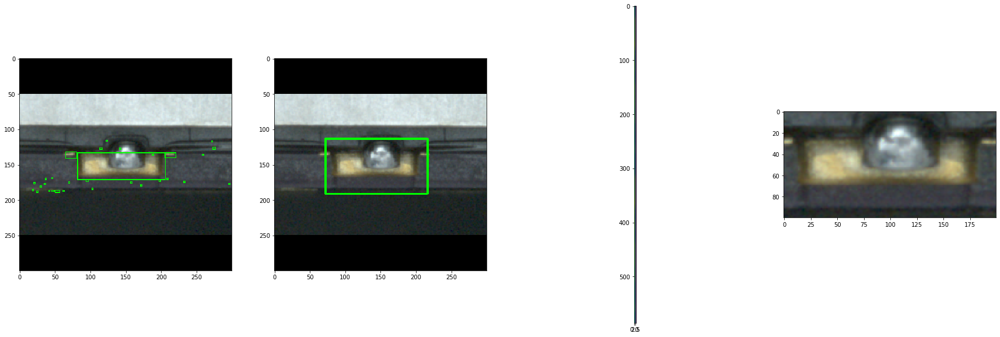

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
15
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165148_37_Boat[_Col1_Row5]_Pos1.BMP
16
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_165202_878_Boat[_Col1_Row5]_Pos1.BMP
16
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170111_820_Boat[_Col1_Row1]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


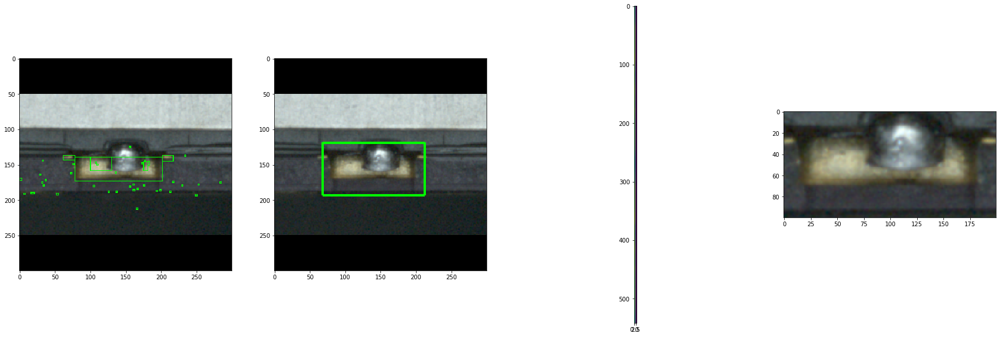

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
17
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170111_820_Boat[_Col1_Row1]_Pos1.BMP
18
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170114_214_Boat[_Col1_Row1]_Pos1.BMP
18
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170120_643_Boat[_Col1_Row2]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


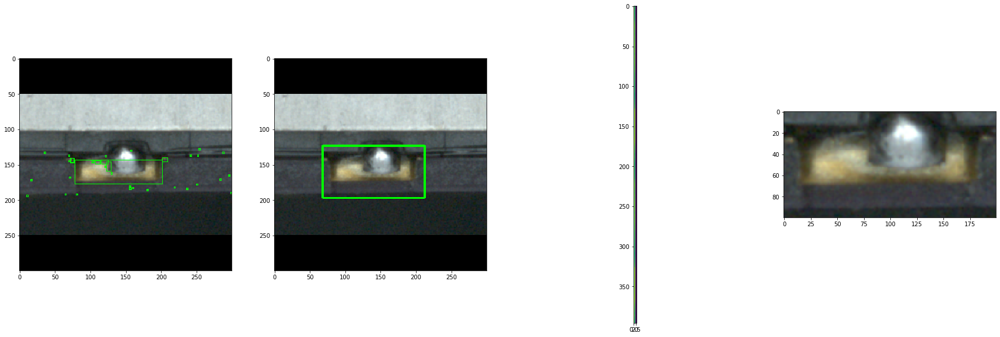

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
19
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170120_643_Boat[_Col1_Row2]_Pos1.BMP
20
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170615_69_Boat[_Col1_Row6]_Pos1.BMP
20
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170951_758_Boat[_Col1_Row9]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


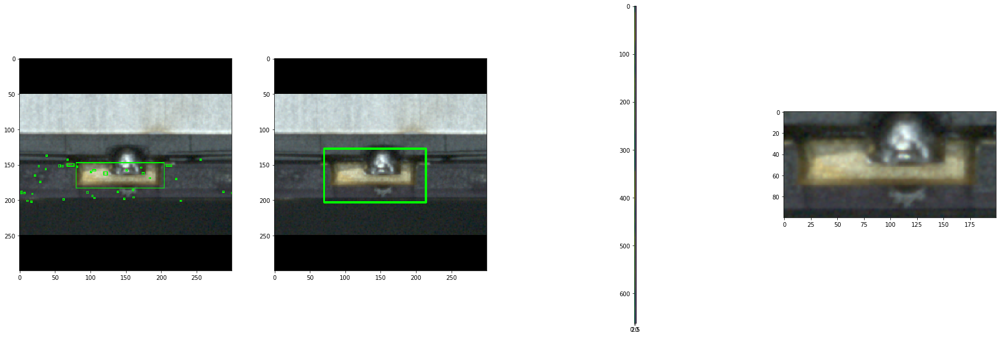

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
21
img2\NG\all\UP\POS1\NG_CAM_UP_POS1_20190723_170951_758_Boat[_Col1_Row9]_Pos1.BMP
21
img2\NG\all\UP\POS1\Ng_CAM_UP_POS1_20190723_170134_322_Boat[_Col1_Row4]_Pos1.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


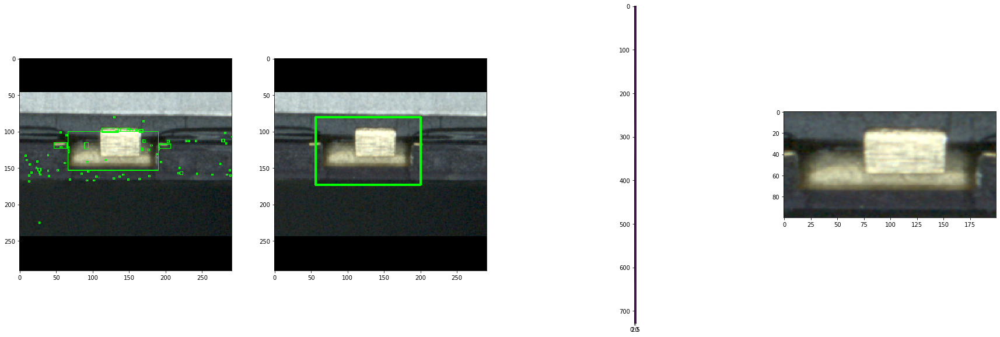

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
22
img2\NG\all\UP\POS1\Ng_CAM_UP_POS1_20190723_170134_322_Boat[_Col1_Row4]_Pos1.BMP
23
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_145831_883_Boat[_Col1_Row1]_Pos2.BMP
23
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_150025_781_Boat[_Col1_Row1]_Pos2.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


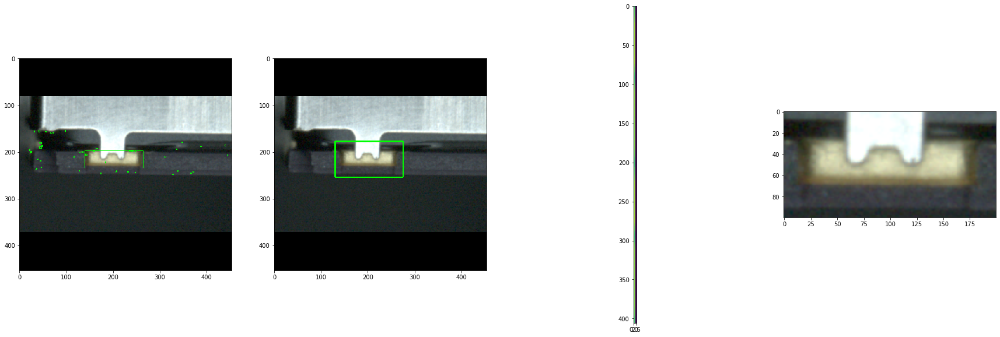

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
24
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_150025_781_Boat[_Col1_Row1]_Pos2.BMP
25
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_153238_860_Boat[_Col1_Row2]_Pos2.BMP
26
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160156_985_Boat[_Col1_Row1]_Pos2.BMP
27
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160410_254_Boat[_Col1_Row4]_Pos2.BMP
28
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160414_360_Boat[_Col1_Row4]_Pos2.BMP
29
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160424_726_Boat[_Col1_Row5]_Pos2.BMP
30
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160440_842_Boat[_Col1_Row7]_Pos2.BMP
31
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160445_870_Boat[_Col1_Row7]_Pos2.BMP
31
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160458_163_Boat[_Col1_Row9]_Pos2.BMP
oooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo

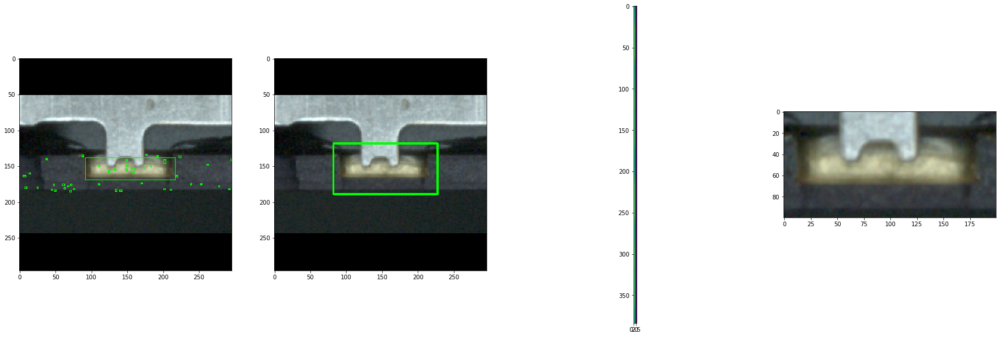

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
32
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_160458_163_Boat[_Col1_Row9]_Pos2.BMP
32
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_165146_33_Boat[_Col1_Row3]_Pos2.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


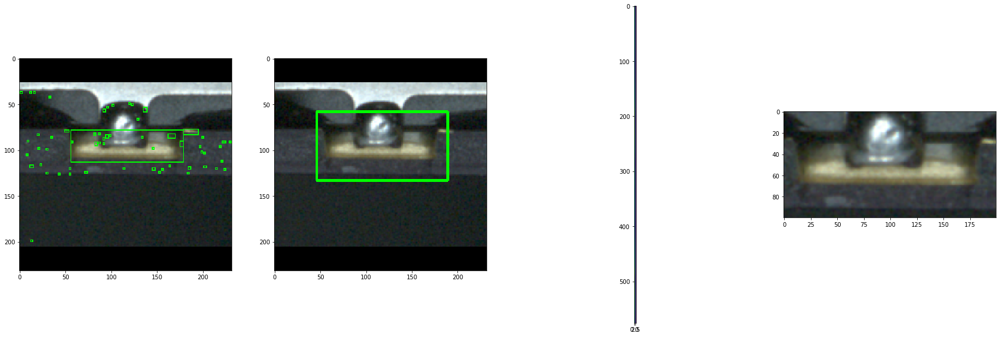

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
33
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_165146_33_Boat[_Col1_Row3]_Pos2.BMP
34
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_170114_771_Boat[_Col1_Row1]_Pos2.BMP
34
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_170615_691_Boat[_Col1_Row6]_Pos2.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


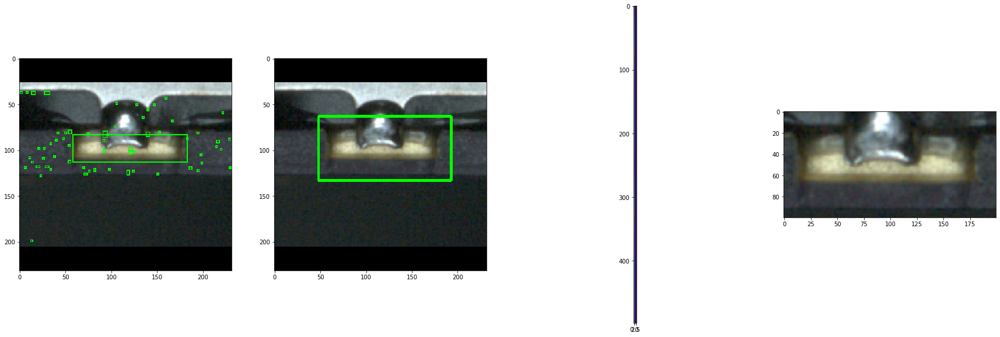

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
35
img2\NG\all\UP\POS2\NG_CAM_UP_POS2_20190723_170615_691_Boat[_Col1_Row6]_Pos2.BMP
36
img2\NG\all\UP\POS2\Ng_CAM_UP_POS2_20190723_153712_116_Boat[_Col1_Row1]_Pos2.BMP
37
img2\NG\all\UP\POS2\Ng_CAM_UP_POS2_20190723_155243_425_Boat[_Col1_Row2]_Pos2.BMP
38
img2\NG\all\UP\POS2\Ng_CAM_UP_POS2_20190723_155248_863_Boat[_Col1_Row4]_Pos2.BMP
39
img2\NG\all\UP\POS2\Ng_CAM_UP_POS2_20190723_155259_447_Boat[_Col1_Row5]_Pos2.BMP
39
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_140705_791_Boat[_Col1_Row2]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


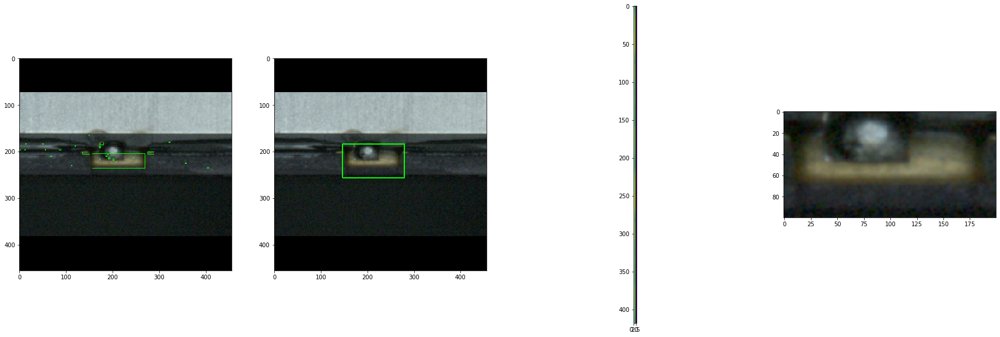

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
40
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_140705_791_Boat[_Col1_Row2]_Pos3.BMP
41
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_142722_798_Boat[_Col1_Row1]_Pos3.BMP
42
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_153248_563_Boat[_Col1_Row3]_Pos3.BMP
43
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_153712_695_Boat[_Col1_Row1]_Pos3.BMP
44
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_153721_945_Boat[_Col1_Row2]_Pos3.BMP
44
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155249_475_Boat[_Col1_Row4]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


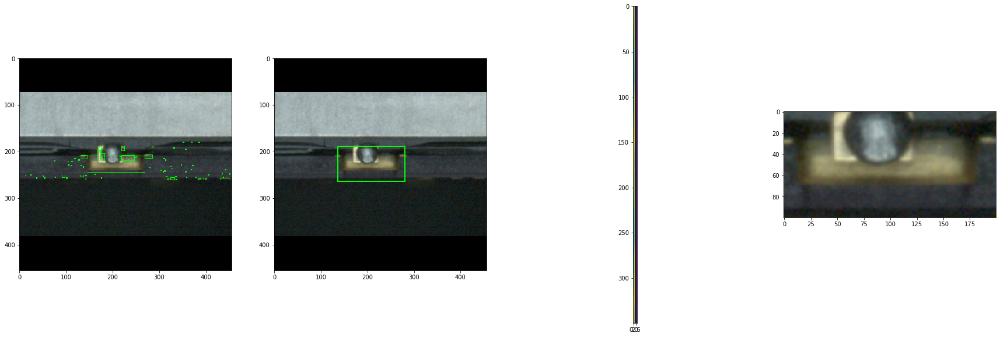

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
45
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155249_475_Boat[_Col1_Row4]_Pos3.BMP
45
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155310_222_Boat[_Col1_Row6]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


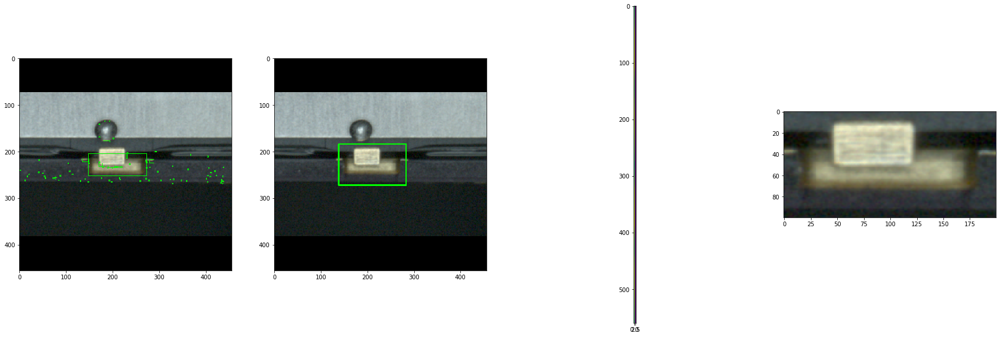

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
46
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155310_222_Boat[_Col1_Row6]_Pos3.BMP
47
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_155857_381_Boat[_Col1_Row9]_Pos3.BMP
47
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_160431_521_Boat[_Col1_Row6]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


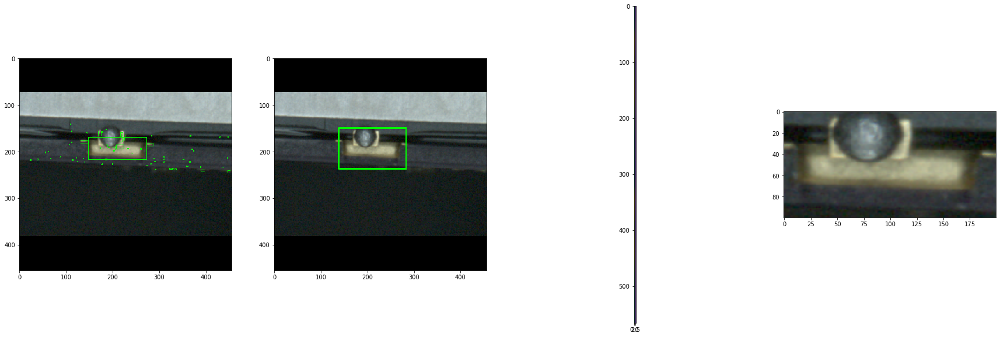

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
48
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_160431_521_Boat[_Col1_Row6]_Pos3.BMP
49
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_160451_887_Boat[_Col1_Row8]_Pos3.BMP
49
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_161343_14_Boat[_Col1_Row1]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


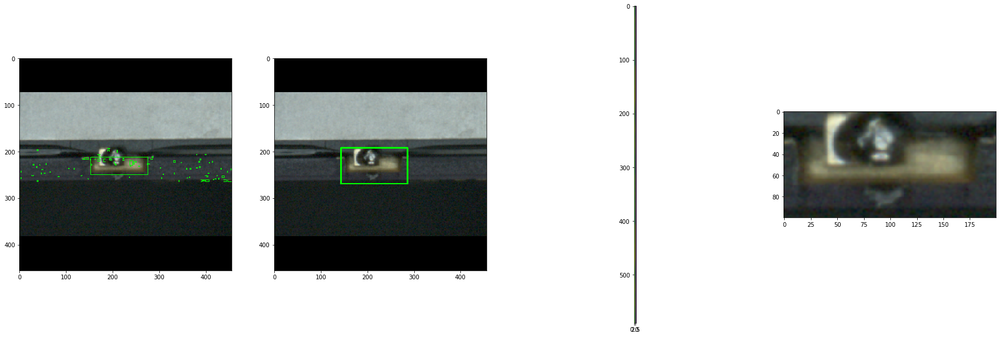

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
50
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_161343_14_Boat[_Col1_Row1]_Pos3.BMP
50
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_165155_457_Boat[_Col1_Row4]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


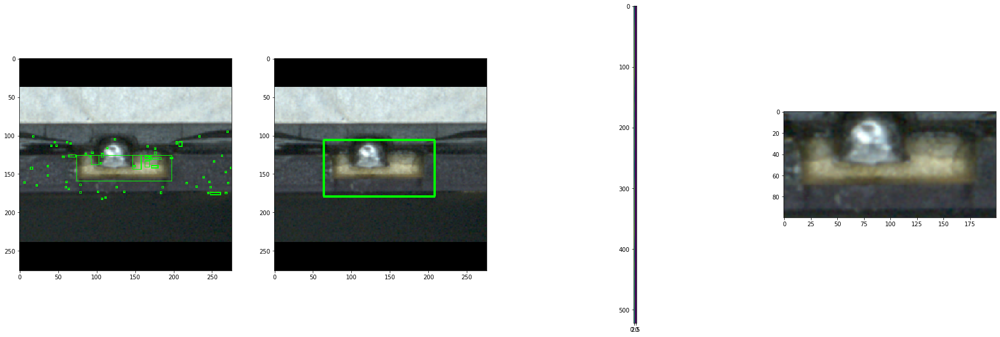

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
51
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_165155_457_Boat[_Col1_Row4]_Pos3.BMP
52
img2\NG\all\UP\POS3\NG_CAM_UP_POS3_20190723_170616_214_Boat[_Col1_Row6]_Pos3.BMP
52
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_155237_536_Boat[_Col1_Row2]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


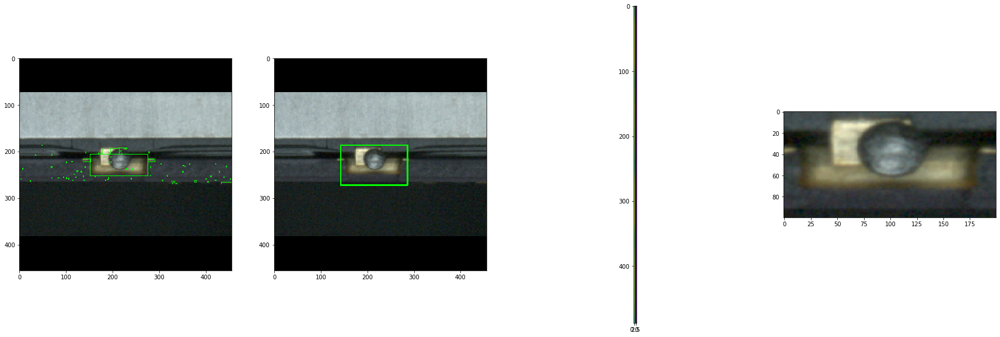

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
53
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_155237_536_Boat[_Col1_Row2]_Pos3.BMP
53
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_160441_432_Boat[_Col1_Row7]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


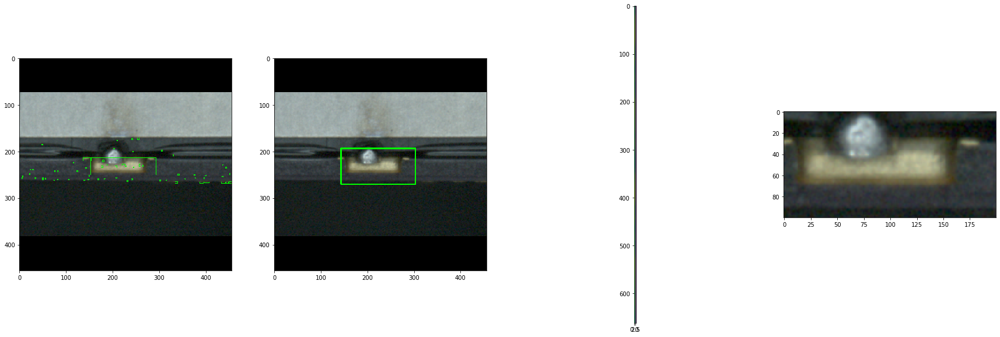

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
54
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_160441_432_Boat[_Col1_Row7]_Pos3.BMP
55
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_163834_875_Boat[_Col1_Row1]_Pos3.BMP
56
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_165146_663_Boat[_Col1_Row3]_Pos3.BMP
56
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_165204_91_Boat[_Col1_Row5]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


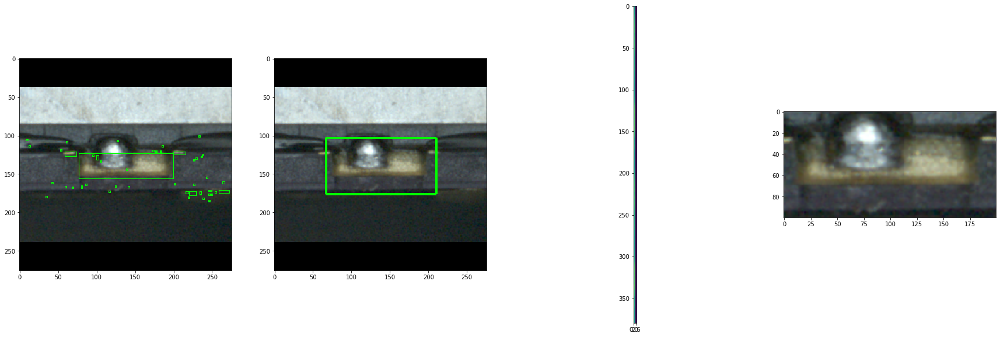

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
57
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_165204_91_Boat[_Col1_Row5]_Pos3.BMP
57
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_170113_37_Boat[_Col1_Row1]_Pos3.BMP
ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo


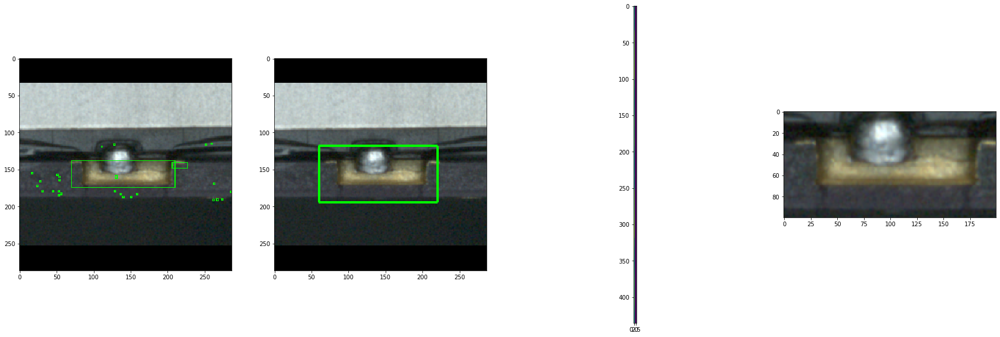

ooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooooo
58
img2\NG\all\UP\POS3\Ng_CAM_UP_POS3_20190723_170113_37_Boat[_Col1_Row1]_Pos3.BMP


In [35]:
img_up_ng_det = detection_y(up_ng, path_list_up_ng)

In [18]:
#ok_det = detection_y(up_ok[700:720], path_list_up_ok[700:720])

In [19]:
#ok_det = up_detection(up_ok[700:720])

# 3. Modeling

In [16]:
#up_ng_det.shape, up_ok_det.shape

In [36]:
img_up_ok_det.shape, img_up_ng_det.shape

((1440, 100, 200, 3), (58, 100, 200, 3))

In [ ]:
#Z_ng_det.shape, Z_ok_det.shape

#### Data Augmentation
- OK data 증식후 OK데이터 CONCAT


In [79]:
image_generator = ImageDataGenerator(horizontal_flip=True)

In [80]:
xtas, ytas = [], []
for i in range(img_up_ok_det.shape[0]):
    num_aug = 0
    x = img_up_ok_det[i]
    x = x.reshape((1,) + x.shape)
    for x_aug in image_generator.flow(x, batch_size = 1) :
        if num_aug >= 1:
            break
        xtas.append(x_aug[0].astype(int))
        num_aug += 1

In [81]:
for i in range(img_up_ng_det.shape[0]):
    num_aug = 0
    y = img_up_ng_det[i]
    y = y.reshape((1,) + y.shape)
    for y_aug in image_generator.flow(y, batch_size = 1) :
        if num_aug >= 1:
            break
        ytas.append(y_aug[0].astype(int))
        num_aug += 1
           

In [82]:
img_up_ok_det1 = np.concatenate((img_up_ok_det, xtas))
img_up_ng_det1 = np.concatenate((img_up_ng_det, ytas))

In [84]:
img_up_ok_det1.shape, img_up_ng_det1.shape

((2880, 100, 200, 3), (116, 100, 200, 3))

In [17]:
#insp_ng_mini.shape, insp_ok_mini.shape

In [43]:
X = np.concatenate((Z_ng_det, Z_ok_det))
y = np.concatenate((np.ones(len(Z_ng_det)), np.zeros(len(Z_ok_det))))

In [100]:
# X = np.concatenate((up_ng_det, up_ok_det))
# y = np.concatenate((np.ones(len(up_ng_det)), np.zeros(len(up_ok_det))))

In [ ]:
# X = np.concatenate((insp_ng_mini, insp_ok_mini))
# y = np.concatenate((np.ones(len(insp_ng_mini)), np.zeros(len(insp_ok_mini))))

In [22]:
## Data Augmentation
X = np.concatenate((img_up_ng_det1, img_up_ok_det1))
y = np.concatenate((np.ones(len(img_up_ok_det1)), np.zeros(len(img_up_ok_det1))))

In [37]:
X = np.concatenate((img_up_ng_det, img_up_ok_det))
y = np.concatenate((np.ones(len(img_up_ng_det)), np.zeros(len(img_up_ok_det))))

In [38]:
X.shape, y.shape

((1498, 100, 200, 3), (1498,))

In [39]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y, random_state=77)

In [16]:
from keras.optimizers import Adam,RMSprop,SGD
from keras import optimizers, metrics
from keras.layers import Input, Dense, Conv2D, Activation, GlobalAveragePooling2D, Flatten, concatenate
from keras.layers import Dropout, BatchNormalization, MaxPooling2D, Lambda
from keras.models import Model, Input, model_from_json

from keras.models import load_model
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
from keras.utils import np_utils
from keras.applications.vgg16 import VGG16
from keras.applications.mobilenet_v2 import MobileNetV2
from keras.utils import multi_gpu_model


In [17]:
from keras.utils.vis_utils import plot_model
import pydot as pyd
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
import keras
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix

## Baseline

### 1

In [20]:
x_input = Input(shape=(100, 200, 3))

x = Conv2D(32, (3, 3), padding='same')(x_input)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(32, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D()(x)

x = Conv2D(64, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Conv2D(64, (3, 3), padding='same')(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = GlobalAveragePooling2D()(x)

x = Dense(1024, activation='relu')(x)
x = Dropout(rate=0.5)(x)
x = Dense(512, activation='relu')(x)
x_output = Dense(1, activation='sigmoid')(x)

model = Model(inputs=x_input, outputs=x_output)

In [24]:
plot_model(model, to_file='model_plot_up_baseline_1.png', show_shapes=True, show_layer_names=True)

In [ ]:
model.summary()

In [49]:
batch_size = 450
epochs = 2

#### Train Model
 - lr=0.001

In [31]:
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
RMSprop = optimizers.RMSprop(lr=0.0001, clipvalue=1.0, decay=1e-6)
adam = optimizers.Adam(lr=0.001, decay=1e-6)


#model = multi_gpu_model(model, gpus=2)
model.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])

callbacks = [ReduceLROnPlateau(patience=100, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("model_plot_up_baseline_1.h5", save_best_only=True, verbose=1)]

# hist = model.fit(X_train, y_train, validation_data=[X_test, y_test],
#           batch_size=batch_size, epochs=epochs, callbacks=callbacks)


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


### model save
- to_json

In [21]:
#save model
model_json = model.to_json()
# with open("best_model_baseline_2.json", "w") as f:
#     f.write(model_json)

# json.dump(str(hist), open("best_model_baseline_2.json", 'w'))




- to_json     gpu_model & cpu_model  save

In [ ]:
'''
model = Sequential()

model.add(Embedding(input_dim, output_dim, input_length=input_length, mask_zero=True))
model.add(Bidirectional(LSTM(hidden_units, return_sequences=True)))
model.add(TimeDistributed(Dense(output_units, activation="softmax")))

multi_model = multi_gpu_model(model, gpus=gpus)

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
multi_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

'''


with open(model_path, "w") as f:
    f.write(model.to_json())

model.set_weights(multi_model.get_weights())
model.save_weights(weight_path)

#저장된 model을 다시 읽어오려면 아래와 같이 해준다...
with open(model_path) as f:
    model = model_from_json(f.read())
    
multi_model = multi_gpu_model(model, gpus=gpus)
model.load_weights(weight_path)
multi_model.load_weights(weight_path)

In [ ]:
# from keras.models import load_model
# multi_gpus_model = load_model('model')
# origin_model = multi_gpus_model.layers[-2]  # you can use multi_gpus_model.summary() to see the layer of the original model
# origin_model.save_weights('single_gpu_model.hdf5')

In [41]:
model.load_weights("model_plot_up_baseline_1.h5")

In [42]:
train_pred = model.predict(X_train)
train_pred[train_pred<0.5] = 0
train_pred[train_pred>=0.5] = 1

#### Predict Train

In [43]:
print(classification_report(y_train, train_pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00      1296
         1.0       1.00      1.00      1.00        52

    accuracy                           1.00      1348
   macro avg       1.00      1.00      1.00      1348
weighted avg       1.00      1.00      1.00      1348



In [44]:
print(confusion_matrix(y_train, train_pred))

[[1296    0]
 [   0   52]]


In [46]:
for i in range(0,len(y_train)):
    if y_train[i] != train_pred[i]:
        print(i)
        plt.imshow(X_train[i])
        plt.show()

#### Predict Test

In [47]:
pred = model.predict(X_test)
pred[pred<0.5] = 0
pred[pred>=0.5] = 1

In [48]:
print(classification_report(y_test, pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00       144
         1.0       1.00      0.83      0.91         6

    accuracy                           0.99       150
   macro avg       1.00      0.92      0.95       150
weighted avg       0.99      0.99      0.99       150



In [49]:
print(confusion_matrix(y_test, pred))

[[144   0]
 [  1   5]]


#### find fault - predict image 

67


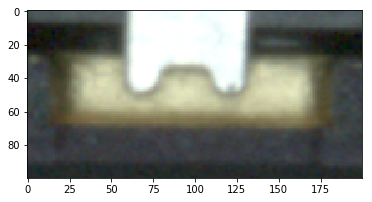

In [50]:
for i in range(0,len(y_test)):
    if y_test[i] != pred[i]:
        print(i)
        plt.imshow(X_test[i])
        plt.show()

#### Plot

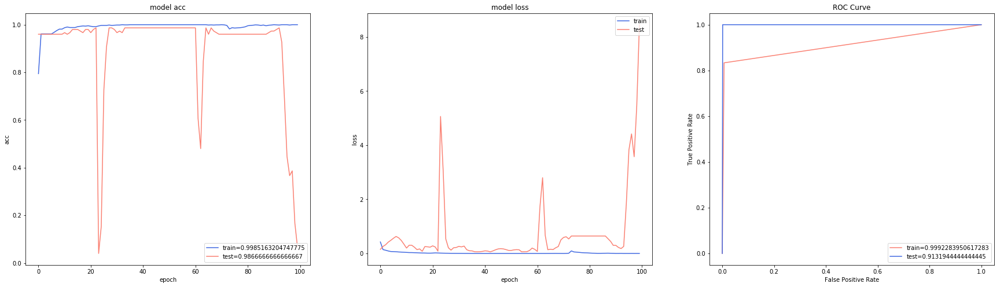

In [41]:
plt.figure(figsize=(30,8))
from sklearn.metrics import accuracy_score
from sklearn import metrics

# acc plot
train_acc = accuracy_score(y_train, train_pred)
test_acc = accuracy_score(y_test, pred)

plt.subplot(131)
plt.plot(hist.history['acc'], color="royalblue")
plt.plot(hist.history['val_acc'], color="salmon")
plt.title('model acc')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train='+str(train_acc), 'test='+str(test_acc)], loc=4)

# loss plot
plt.subplot(132)
plt.plot(hist.history['loss'], color="royalblue")
plt.plot(hist.history['val_loss'], color="salmon")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc=1)

# ROC Curve
train_fpr, train_tpr, _ = metrics.roc_curve(y_train,  train_pred)
test_fpr, test_tpr, _ = metrics.roc_curve(y_test,  pred)
train_auc = metrics.roc_auc_score(y_train, train_pred)
test_auc = metrics.roc_auc_score(y_test, pred)

plt.subplot(133)
plt.plot(test_fpr, test_tpr, color="salmon")
plt.plot(train_fpr, train_tpr, color="royalblue")
plt.legend(['train='+str(train_auc), 'test='+str(test_auc)],loc=4)
plt.title('ROC Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

### 2 `(Accuracy 100%)`

#### Train Model
 - lr=0.0005

In [50]:
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
#model = multi_gpu_model(model, gpus=2)
model.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])

callbacks = [ReduceLROnPlateau(patience=100, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_baseline_2_z.h5", save_best_only=False, verbose=1)]

keras.backend.get_session().run(tf.global_variables_initializer())

In [51]:
hist = model.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

Train on 1348 samples, validate on 150 samples
Epoch 1/2
1348/1348 [==============================] - 154s 115ms/step - loss: 0.5497 - acc: 0.7871 - val_loss: 0.3493 - val_acc: 0.9600

Epoch 00001: saving model to best_model_baseline_2_z.h5
Epoch 2/2
1348/1348 [==============================] - 127s 94ms/step - loss: 0.2321 - acc: 0.9614 - val_loss: 0.2193 - val_acc: 0.9600

Epoch 00002: saving model to best_model_baseline_2_z.h5


#### gpu model save

In [48]:
# save model
# model_json = model.to_json()
# with open("best_model_baseline_2.json", "w") as f:
#     f.write(model_json)

# json.dump(str(hist), open("best_model_baseline_2.json", 'w'))

In [ ]:
# from keras.models import load_model
# multi_gpus_model = load_model('model')
# origin_model = multi_gpus_model.layers[-2]  # you can use multi_gpus_model.summary() to see the layer of the original model
# origin_model.save_weights('single_gpu_model.hdf5')

In [57]:
model.load_weights("best_model_baseline_2_z.h5")

#### Predict Train

In [58]:
train_pred = model.predict(X_train)
train_pred[train_pred<0.5] = 0
train_pred[train_pred>=0.5] = 1

In [59]:
print(classification_report(y_train, train_pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1296
         1.0       0.00      0.00      0.00        52

    accuracy                           0.96      1348
   macro avg       0.48      0.50      0.49      1348
weighted avg       0.92      0.96      0.94      1348



In [60]:
print(confusion_matrix(y_train, train_pred))

[[1296    0]
 [  52    0]]


In [62]:
list_fault = []
for i in range(0,len(y_train)):
    if y_train[i] != train_pred[i]:   
        print(i)
        list_fault.append(i)
#         plt.imshow(X_train[i])
#         plt.show()

7
10
12
30
55
78
96
132
157
160
170
177
226
239
264
271
281
306
341
346
407
409
411
501
504
647
668
677
708
715
720
725
736
788
811
821
832
895
898
903
914
935
994
1107
1116
1129
1134
1260
1298
1305
1307
1345


#### Predict Test

In [63]:
pred = model.predict(X_test)
pred[pred<0.5] = 0
pred[pred>=0.5] = 1

In [64]:
print(classification_report(y_test, pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98       144
         1.0       0.00      0.00      0.00         6

    accuracy                           0.96       150
   macro avg       0.48      0.50      0.49       150
weighted avg       0.92      0.96      0.94       150



In [65]:
print(confusion_matrix(y_test, pred))

[[144   0]
 [  6   0]]


#### find fault - predict image 

In [66]:
for i in range(0,len(y_test)):
    if y_test[i] != pred[i]:
        print(i)
#         plt.imshow(X_test[i])
#         plt.show()

58
67
68
77
80
127


#### Plot

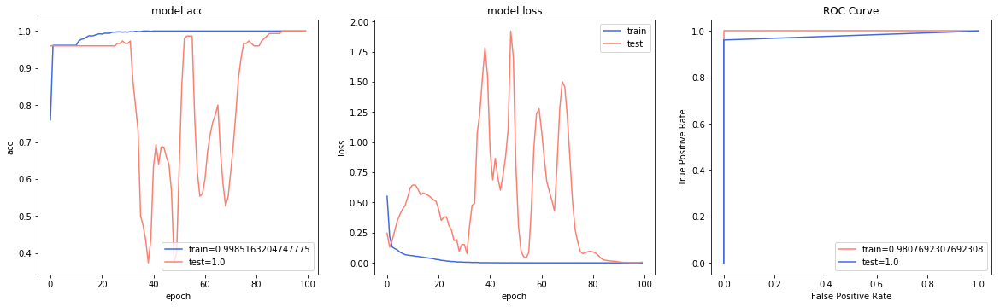

In [57]:
plt.figure(figsize=(20,5.5))
from sklearn.metrics import accuracy_score
from sklearn import metrics

# acc plot
train_acc = accuracy_score(y_train, train_pred)
test_acc = accuracy_score(y_test, pred)

plt.subplot(131)
plt.plot(hist.history['acc'], color="royalblue")
plt.plot(hist.history['val_acc'], color="salmon")
plt.title('model acc')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train='+str(train_acc), 'test='+str(test_acc)], loc=4)

# loss plot
plt.subplot(132)
plt.plot(hist.history['loss'], color="royalblue")
plt.plot(hist.history['val_loss'], color="salmon")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc=1)

# ROC Curve
train_fpr, train_tpr, _ = metrics.roc_curve(y_train,  train_pred)
test_fpr, test_tpr, _ = metrics.roc_curve(y_test,  pred)
train_auc = metrics.roc_auc_score(y_train, train_pred)
test_auc = metrics.roc_auc_score(y_test, pred)

plt.subplot(133)
plt.plot(test_fpr, test_tpr, color="salmon")
plt.plot(train_fpr, train_tpr, color="royalblue")
plt.legend(['train='+str(train_auc), 'test='+str(test_auc)],loc=4)
plt.title('ROC Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

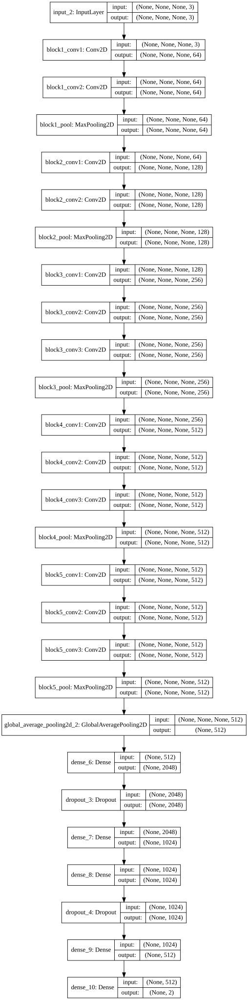

In [40]:
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot

%matplotlib inline

SVG(model_to_dot(model, show_shapes=True).create(prog='dot', format='svg'))

## Mobilenet

In [68]:
base_model_mbv2 =MobileNetV2(weights=None,include_top=False) #imports the MobileNetV2 model and discards the last 1000 neuron layer.
x=base_model_mbv2.output
x=GlobalAveragePooling2D()(x)
x=Dense(2048,activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x = Dropout(rate=0.4)(x)
x=Dense(1024,activation='relu')(x) #dense layer 2
x=Dense(1024,activation='relu')(x) #dense layer 2
x = Dropout(rate=0.4)(x)
x=Dense(512,activation='relu')(x) #dense layer 3
preds=Dense(1,activation='sigmoid')(x) #final layer with softmax activation for N classes

model_mbv2 =Model(inputs=base_model_mbv2.input,outputs=preds) #specify the inputs and outputs

In [69]:
for layer in model_mbv2.layers[:20]:
    layer.trainable=False
for layer in model_mbv2.layers[20:]:
    layer.trainable=True

In [70]:
model_mbv2.summary()

Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            (None, None, None, 3 0                                            
__________________________________________________________________________________________________
Conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_3[0][0]                    
__________________________________________________________________________________________________
Conv1 (Conv2D)                  (None, None, None, 3 864         Conv1_pad[0][0]                  
__________________________________________________________________________________________________
bn_Conv1 (BatchNormalization)   (None, None, None, 3 128         Conv1[0][0]                      
____________________________________________________________________________________________

In [71]:
sgd = optimizers.SGD(lr=0.005, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
model_mbv2 = multi_gpu_model(model_mbv2, gpus=2)
model_mbv2.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])
# step_size_train=train_generator.n//train_generator.batch_size
# step_size_val=val_generator.n//val_generator.batch_size
# model.fit_generator(generator=train_generator,
#                   steps_per_epoch=step_size_train,
#                   epochs=100, validation_data=val_generator,
#                   validation_steps=step_size_val)

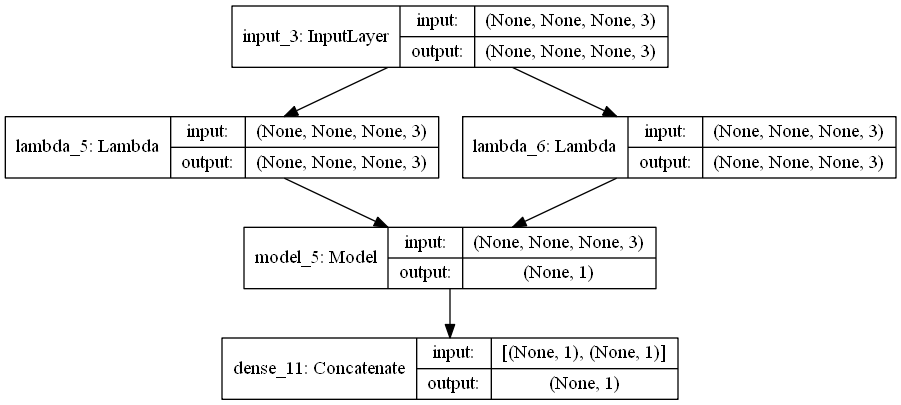

In [72]:
plot_model(model_mbv2, to_file='model_plotmodel_mbv2.png', show_shapes=True, show_layer_names=True)

In [73]:
batch_size = 128
epochs = 200

In [74]:
callbacks = [ReduceLROnPlateau(patience=10, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_mobilenetv2.h5", save_best_only=True, verbose=1)]

keras.backend.get_session().run(tf.global_variables_initializer())
hist = model_mbv2.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

Train on 1348 samples, validate on 150 samples
Epoch 1/100
1348/1348 [==============================] - 24s 18ms/step - loss: 0.2117 - acc: 0.9570 - val_loss: 0.2996 - val_acc: 0.9600

Epoch 00001: val_loss improved from inf to 0.29955, saving model to best_model_mobilenetv2.h5
Epoch 2/100
1348/1348 [==============================] - 4s 3ms/step - loss: 0.1064 - acc: 0.9614 - val_loss: 0.2668 - val_acc: 0.9600

Epoch 00002: val_loss improved from 0.29955 to 0.26676, saving model to best_model_mobilenetv2.h5
Epoch 3/100
1348/1348 [==============================] - 4s 3ms/step - loss: 0.0497 - acc: 0.9614 - val_loss: 0.1802 - val_acc: 0.9600

Epoch 00003: val_loss improved from 0.26676 to 0.18016, saving model to best_model_mobilenetv2.h5
Epoch 4/100
1348/1348 [==============================] - 4s 3ms/step - loss: 0.0436 - acc: 0.9622 - val_loss: 0.2951 - val_acc: 0.9600

Epoch 00004: val_loss did not improve from 0.18016
Epoch 5/100
1348/1348 [==============================] - 4s 3ms/st

1348/1348 [==============================] - 4s 3ms/step - loss: 7.3156e-06 - acc: 1.0000 - val_loss: 11.9148 - val_acc: 0.0400

Epoch 00042: val_loss did not improve from 0.18016
Epoch 43/100
1348/1348 [==============================] - 4s 3ms/step - loss: 8.7525e-06 - acc: 1.0000 - val_loss: 12.0144 - val_acc: 0.0400

Epoch 00043: ReduceLROnPlateau reducing learning rate to 3.125000148429535e-05.

Epoch 00043: val_loss did not improve from 0.18016
Epoch 44/100
1348/1348 [==============================] - 4s 3ms/step - loss: 1.1985e-05 - acc: 1.0000 - val_loss: 12.1030 - val_acc: 0.0400

Epoch 00044: val_loss did not improve from 0.18016
Epoch 45/100
1348/1348 [==============================] - 4s 3ms/step - loss: 8.5046e-06 - acc: 1.0000 - val_loss: 12.1814 - val_acc: 0.0400

Epoch 00045: val_loss did not improve from 0.18016
Epoch 46/100
1348/1348 [==============================] - 4s 3ms/step - loss: 9.9708e-06 - acc: 1.0000 - val_loss: 12.2533 - val_acc: 0.0400

Epoch 00046: val_l

1348/1348 [==============================] - 4s 3ms/step - loss: 5.9764e-06 - acc: 1.0000 - val_loss: 12.9267 - val_acc: 0.0400

Epoch 00083: ReduceLROnPlateau reducing learning rate to 1.9531250927684596e-06.

Epoch 00083: val_loss did not improve from 0.18016
Epoch 84/100
1348/1348 [==============================] - 4s 3ms/step - loss: 6.1257e-06 - acc: 1.0000 - val_loss: 12.9229 - val_acc: 0.0400

Epoch 00084: val_loss did not improve from 0.18016
Epoch 85/100
1348/1348 [==============================] - 4s 3ms/step - loss: 1.0429e-05 - acc: 1.0000 - val_loss: 12.9240 - val_acc: 0.0400

Epoch 00085: val_loss did not improve from 0.18016
Epoch 86/100
1348/1348 [==============================] - 4s 3ms/step - loss: 7.6261e-06 - acc: 1.0000 - val_loss: 12.9257 - val_acc: 0.0400

Epoch 00086: val_loss did not improve from 0.18016
Epoch 87/100
1348/1348 [==============================] - 4s 3ms/step - loss: 3.2476e-06 - acc: 1.0000 - val_loss: 12.9262 - val_acc: 0.0400

Epoch 00087: val_

In [34]:
model_mbv2.load_weights("best_model_mobilenetv2.h5")

NameError: name 'model_mbv2' is not defined

In [81]:
train_pred = model_mbv2.predict(X_train)
train_pred[train_pred<0.5] = 0
train_pred[train_pred>=0.5] = 1

In [82]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_train, train_pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1296
         1.0       0.00      0.00      0.00        52

    accuracy                           0.96      1348
   macro avg       0.48      0.50      0.49      1348
weighted avg       0.92      0.96      0.94      1348



In [83]:
print(confusion_matrix(y_train, train_pred))

[[1296    0]
 [  52    0]]


In [ ]:
for i in range(0,len(y_train)):
    if y_train[i] != train_pred[i]:
        plt.imshow(X_train[i])
        plt.show()

#### Predict Test

In [85]:
pred = model_mbv2.predict(X_test)
pred[pred<0.5] = 0
pred[pred>=0.5] = 1

In [86]:
print(classification_report(y_test, pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98       144
         1.0       0.00      0.00      0.00         6

    accuracy                           0.96       150
   macro avg       0.48      0.50      0.49       150
weighted avg       0.92      0.96      0.94       150



In [88]:
print(confusion_matrix(y_test, pred))

[[144   0]
 [  6   0]]


In [80]:
for i in range(0,len(y_test)):
    if y_test[i] != pred[i]:
        plt.imshow(X_test[i])
        plt.show()

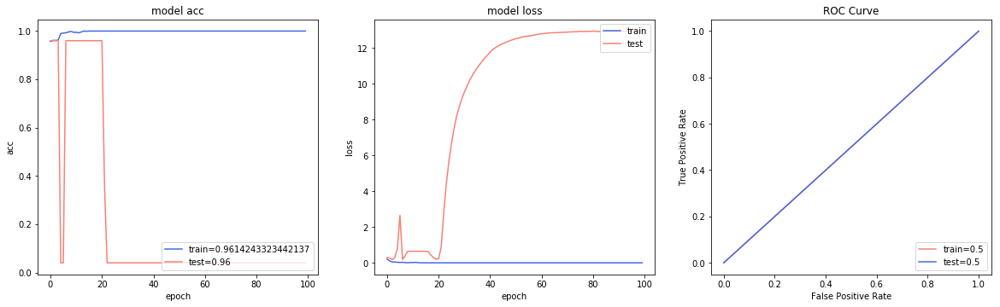

In [89]:
plt.figure(figsize=(20,5.5))
from sklearn.metrics import accuracy_score
from sklearn import metrics

# acc plot
train_acc = accuracy_score(y_train, train_pred)
test_acc = accuracy_score(y_test, pred)

plt.subplot(131)
plt.plot(hist.history['acc'], color="royalblue")
plt.plot(hist.history['val_acc'], color="salmon")
plt.title('model acc')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train='+str(train_acc), 'test='+str(test_acc)], loc=4)

# loss plot
plt.subplot(132)
plt.plot(hist.history['loss'], color="royalblue")
plt.plot(hist.history['val_loss'], color="salmon")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc=1)

# ROC Curve
train_fpr, train_tpr, _ = metrics.roc_curve(y_train,  train_pred)
test_fpr, test_tpr, _ = metrics.roc_curve(y_test,  pred)
train_auc = metrics.roc_auc_score(y_train, train_pred)
test_auc = metrics.roc_auc_score(y_test, pred)

plt.subplot(133)
plt.plot(test_fpr, test_tpr, color="salmon")
plt.plot(train_fpr, train_tpr, color="royalblue")
plt.legend(['train='+str(train_auc), 'test='+str(test_auc)],loc=4)
plt.title('ROC Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

# VGG16

In [112]:
base_model_vgg16 =VGG16(weights=None,include_top=False) #imports the MobileNetV2 model and discards the last 1000 neuron layer.
x=base_model_vgg16.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x = Dropout(rate=0.4)(x)
x=Dense(512,activation='relu')(x) #dense layer 2
x=Dense(512,activation='relu')(x) #dense layer 2
x = Dropout(rate=0.4)(x)
x=Dense(256,activation='relu')(x) #dense layer 3
preds=Dense(1,activation='sigmoid')(x) #final layer with softmax activation for N classes

model_vgg16 =Model(inputs=base_model_vgg16.input,outputs=preds) #specify the inputs and outputs

In [113]:
model_vgg16.summary()

Model: "model_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         (None, None, None, 3)     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0  

In [114]:
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
model_vgg16 = multi_gpu_model(model_vgg16, gpus=2)
model_vgg16.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])
# step_size_train=train_generator.n//train_generator.batch_size
# step_size_val=val_generator.n//val_generator.batch_size
# model.fit_generator(generator=train_generator,
#                   steps_per_epoch=step_size_train,
#                   epochs=100, validation_data=val_generator,
#                   validation_steps=step_size_val)

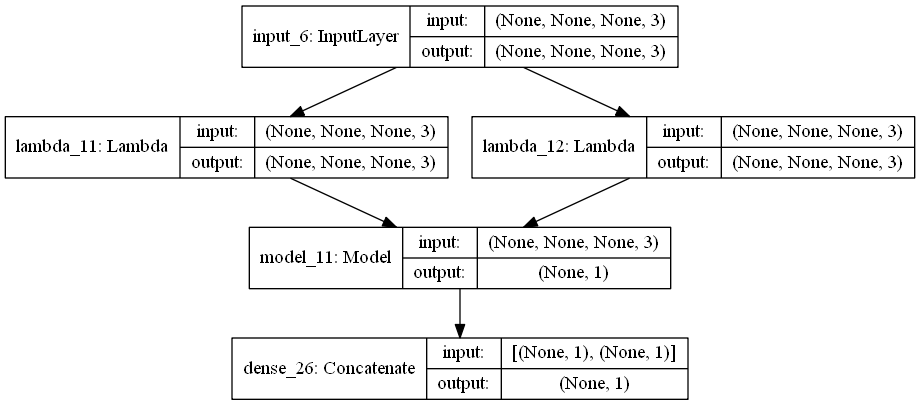

In [115]:
plot_model(model_vgg16, to_file='model_plot_model_vgg16.png', show_shapes=True, show_layer_names=True)

In [116]:
batch_size = 128
epochs = 200

In [117]:
callbacks = [ReduceLROnPlateau(patience=10, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_vgg16.h5", save_best_only=True, verbose=1)]

keras.backend.get_session().run(tf.global_variables_initializer())
hist = model_vgg16.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

Train on 1348 samples, validate on 150 samples
Epoch 1/200
1348/1348 [==============================] - 18s 13ms/step - loss: 0.6474 - acc: 0.9399 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00001: val_loss improved from inf to 0.64472, saving model to best_model_vgg16.h5
Epoch 2/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00002: val_loss did not improve from 0.64472
Epoch 3/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00003: val_loss did not improve from 0.64472
Epoch 4/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00004: val_loss did not improve from 0.64472
Epoch 5/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00005: val_loss did not 

1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00084: val_loss did not improve from 0.64472
Epoch 85/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00085: val_loss did not improve from 0.64472
Epoch 86/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00086: val_loss did not improve from 0.64472
Epoch 87/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00087: val_loss did not improve from 0.64472
Epoch 88/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00088: val_loss did not improve from 0.64472
Epoch 89/200
1348/1348 [==============================] - 5s 4ms/step - l

1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00126: val_loss did not improve from 0.64472
Epoch 127/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00127: val_loss did not improve from 0.64472
Epoch 128/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00128: val_loss did not improve from 0.64472
Epoch 129/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00129: val_loss did not improve from 0.64472
Epoch 130/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00130: val_loss did not improve from 0.64472
Epoch 131/200
1348/1348 [==============================] - 5s 4ms/ste


Epoch 00167: val_loss did not improve from 0.64472
Epoch 168/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00168: val_loss did not improve from 0.64472
Epoch 169/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00169: val_loss did not improve from 0.64472
Epoch 170/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00170: val_loss did not improve from 0.64472
Epoch 171/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00171: ReduceLROnPlateau reducing learning rate to 3.814697446813398e-09.

Epoch 00171: val_loss did not improve from 0.64472
Epoch 172/200
1348/1348 [==============================] - 5s 4ms/step - loss: 0.6218 - acc: 0.9614 - val_loss:

In [118]:
model_vgg16.load_weights("best_model_vgg16.h5")

In [119]:
train_pred = model_vgg16.predict(X_train)
train_pred[train_pred<0.5] = 0
train_pred[train_pred>=0.5] = 1

In [120]:
from sklearn.metrics import classification_report, confusion_matrix

print(classification_report(y_train, train_pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98      1296
         1.0       0.00      0.00      0.00        52

    accuracy                           0.96      1348
   macro avg       0.48      0.50      0.49      1348
weighted avg       0.92      0.96      0.94      1348



c:\users\enssel\appdata\local\programs\python\python35\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [121]:
print(confusion_matrix(y_train, train_pred))

[[1296    0]
 [  52    0]]


#### Predict Test

In [122]:
pred = model_vgg16.predict(X_test)
pred[pred<0.5] = 0
pred[pred>=0.5] = 1

In [123]:
print(classification_report(y_test, pred.reshape(-1)))

              precision    recall  f1-score   support

         0.0       0.96      1.00      0.98       144
         1.0       0.00      0.00      0.00         6

    accuracy                           0.96       150
   macro avg       0.48      0.50      0.49       150
weighted avg       0.92      0.96      0.94       150



In [124]:
print(confusion_matrix(y_test, pred))

[[144   0]
 [  6   0]]


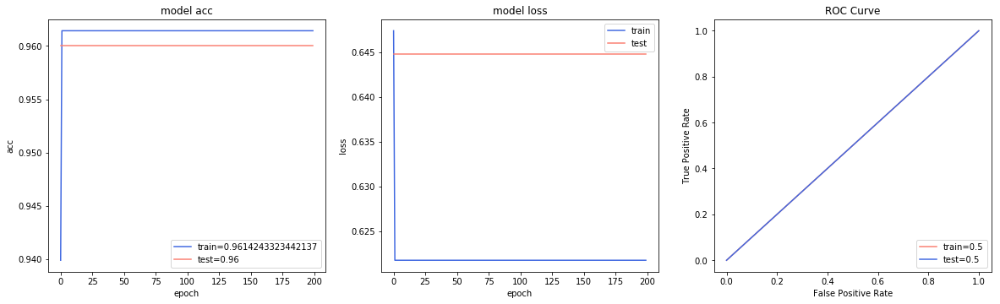

In [125]:
plt.figure(figsize=(20,5.5))
from sklearn.metrics import accuracy_score
from sklearn import metrics

# acc plot
train_acc = accuracy_score(y_train, train_pred)
test_acc = accuracy_score(y_test, pred)

plt.subplot(131)
plt.plot(hist.history['acc'], color="royalblue")
plt.plot(hist.history['val_acc'], color="salmon")
plt.title('model acc')
plt.ylabel('acc')
plt.xlabel('epoch')
plt.legend(['train='+str(train_acc), 'test='+str(test_acc)], loc=4)

# loss plot
plt.subplot(132)
plt.plot(hist.history['loss'], color="royalblue")
plt.plot(hist.history['val_loss'], color="salmon")
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc=1)

# ROC Curve
train_fpr, train_tpr, _ = metrics.roc_curve(y_train,  train_pred)
test_fpr, test_tpr, _ = metrics.roc_curve(y_test,  pred)
train_auc = metrics.roc_auc_score(y_train, train_pred)
test_auc = metrics.roc_auc_score(y_test, pred)

plt.subplot(133)
plt.plot(test_fpr, test_tpr, color="salmon")
plt.plot(train_fpr, train_tpr, color="royalblue")
plt.legend(['train='+str(train_auc), 'test='+str(test_auc)],loc=4)
plt.title('ROC Curve')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.show()

# Efficientnet

In [1]:
# import tensorflow as tf
# import tensorflow.python.keras.backend as K
# import tensorflow.python.keras.layers as KL
# import tensorflow.python.keras.models as KM

In [2]:
# import numpy as np
# from skimage.io import imread
# import matplotlib.pyplot as plt

# from keras.applications.imagenet_utils import decode_predictions
# import efficientnet.keras as efn 
# from efficientnet.keras import center_crop_and_resize, preprocess_input
# import os

In [130]:
import tensorflow as tf
from keras_efficientnets import EfficientNetB0

model3 = EfficientNetB0((100, 200,3), classes=2, weights=None)

Instructions for updating:
Shapes are always computed; don't use the compute_shapes as it has no effect.


In [131]:
model3.summary()

Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            (None, 100, 200, 3)  0                                            
__________________________________________________________________________________________________
conv2d_9 (Conv2D)               (None, 50, 100, 32)  864         input_7[0][0]                    
__________________________________________________________________________________________________
batch_normalization_9 (BatchNor (None, 50, 100, 32)  128         conv2d_9[0][0]                   
__________________________________________________________________________________________________
swish_1 (Swish)                 (None, 50, 100, 32)  0           batch_normalization_9[0][0]      
___________________________________________________________________________________________

In [3]:
#model3 = efn.EfficientNetB3(classes = 2, weights=None,include_top=True)
#model3 = efn.EfficientNetB3(weights='noisy-student')

In [27]:
batch_size = 128
epochs = 100

In [ ]:
model3.layers.pop()
last = model3.output
#last = Dense(512, activation='relu')(last)
x_output = Dense(1, activation='sigmoid')(last)
model3 = Model(model3.input, outputs=x_output)
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
model3 = multi_gpu_model(model3, gpus=2)
model3.compile(loss = "binary_crossentropy", optimizer=adam, metrics=["acc"])
#model3.summary()
callbacks = [ReduceLROnPlateau(patience=10, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_effi_2.h5", save_best_only=True, verbose=1)]


keras.backend.get_session().run(tf.global_variables_initializer())
hist = model3.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

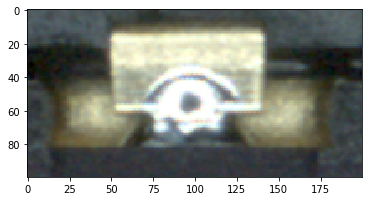

In [79]:
plt.imshow(X_train[0])

In [ ]:
pred_ylist = []
for i in range(0,len(X_train)):
    image_size = model3.input_shape[1] # 224
    x = center_crop_and_resize(X_train[i], image_size=image_size)
    x = preprocess_input(x)
    x = np.expand_dims(x, 0)
    y_list = model3.predict(x)
    pred_ylist.append(decode_predictions(y_list))
   
    
    
    

In [92]:
def inference(model, image):
    #image = imread(image_path)
    plt.figure(figsize=(10, 5))
    plt.subplot(1,3,1)
    plt.imshow(image)
    plt.title('original')
    image_size = model.input_shape[1] # 224
    cx = center_crop_and_resize(image, image_size=image_size)
    
    x = preprocess_input(cx)
    
    plt.subplot(1,3,2)
    plt.imshow(x)
    plt.title('preprocessing')
    
    x = np.expand_dims(x, 0)

    y = model.predict(x)
#     dy = decode_predictions(y)[0]
    
#     for idx, label, confidence in dy:
#          print('%s: %.2f%%' % (label, confidence * 100))

    if y < 0.5:
        print(y)    
        plt.subplot(1,3,3)
        plt.imshow(cx.astype(np.uint8))
        plt.title('center_crop')
        plt.show()

In [ ]:
for i in range(0,len(X_train)):
    inference(model3,X_train[i])


# ETC

In [ ]:
img_r = np.random.randint(0, 255, [10,10])
img_g = np.random.randint(0, 255, [10,10])
img_b = np.random.randint(0, 255, [10,10])
img_rgb = np.concatenate((img_r[...,np.newaxis], img_g[...,np.newaxis], img_b[...,np.newaxis]), axis=2)
                         
img_p = img_rgb.copy()
for r in img_p:
    for c in r:
        if 60 < c[0] < 200 and c[1] < 140 and c[2] > 170: # if yellow
            c[0] = 150
            c[1] = 100
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0

plt.subplot(121)
plt.imshow(img_rgb)
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(img_p)
plt.xticks([])
plt.yticks([])

plt.show()

In [ ]:
img_r = np.random.randint(0, 255, [10,10])
img_g = np.random.randint(0, 255, [10,10])
img_b = np.random.randint(0, 255, [10,10])
img_rgb = np.concatenate((tt_r[...,np.newaxis], tt_g[...,np.newaxis], tt_b[...,np.newaxis]), axis=2)
                         
img_y = img_rgb.copy()
for r in img_y:
    for c in r:
        if c[0] > 140 and c[1] > 140 and c[2] < 70: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 0
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0

plt.subplot(121)
plt.imshow(img_rgb)
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(img_y)
plt.xticks([])
plt.yticks([])

plt.show()

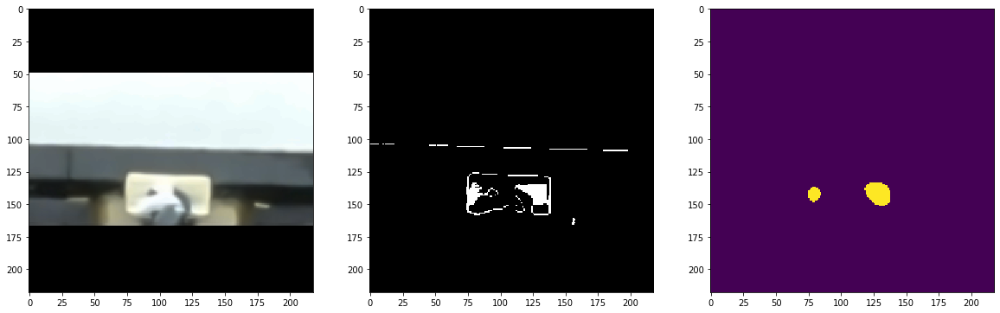

In [28]:
sqr_img = up_ok[117]
ttt = cv2.fastNlMeansDenoisingColored(sqr_img,None,9,9,7,11)
# ttt = sqr_img[1111]
for r in ttt:
    for c in r:
        if c[0] > 135 and c[1] > 180 and c[2] < 200: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0
            
image_gray = cv2.cvtColor(np.float32(ttt), cv2.COLOR_BGR2GRAY)
kernel = np.ones((1, 1), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (35, 35), 0)
_, thresh = cv2.threshold(image_gray_blurred, 100, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20))  

plt.subplot(131)
plt.imshow(cv2.fastNlMeansDenoisingColored(sqr_img,None,9,9,7,15))

plt.subplot(132)
plt.imshow(ttt)

plt.subplot(133)
plt.imshow(thresh)

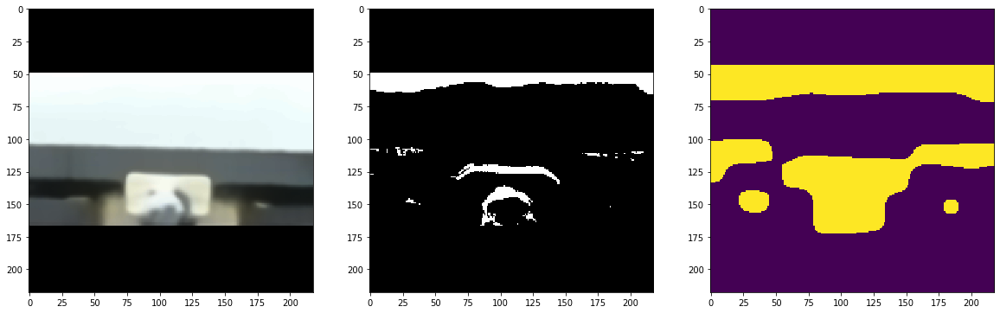

In [29]:
sqr_img = up_ok[117]
ttt = cv2.fastNlMeansDenoisingColored(sqr_img,None,9,9,7,17)
# ttt = sqr_img[1111]
for r in ttt:
    for c in r:
        if (np.max(c) - np.min(c)) < 8 and c[0] > 80: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0
            
image_gray = cv2.cvtColor(np.float32(ttt), cv2.COLOR_BGR2GRAY)
kernel = np.ones((25, 25), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (35, 35), 0)
_, thresh = cv2.threshold(image_gray_blurred, 220, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20))

plt.subplot(131)
plt.imshow(cv2.fastNlMeansDenoisingColored(sqr_img,None,17,17,7,25))

plt.subplot(132)
plt.imshow(ttt)

plt.subplot(133)
plt.imshow(thresh)

In [ ]:
sqr_img = up_ok[117]
test_img = cv2.cvtColor(sqr_img, cv2.COLOR_BGR2RGB)
pad = int(test_img.shape[0]*0.25)
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(test_img[pad:-pad, :, :])
plt.subplot(1,2,2)
plt.imshow(sqr_img)
np.mean(test_img)

In [ ]:
sqr_img = up_ok[117]
test_img = cv2.cvtColor(sqr_img, cv2.COLOR_BGR2RGB)
pad = int(test_img.shape[0]*0.25)
plt.imshow(test_img[pad:-pad, :, :])
np.mean(test_img)

In [ ]:
plt.imshow(cv2.fastNlMeansDenoisingColored(up_ok[117].copy(),None,11,11,7,17))

In [ ]:
sqr_img = up_ok[117]
test_img = sqr_img
pad = int(test_img.shape[0]*0.25)
test_img = test_img[pad:-pad, :, :]
mean = np.mean(test_img)
print(mean)
test_img = test_img.astype('float64')
for r in test_img:
    for c in r:
        c[c > 50] *= 1.4
        c[0] *= 1.2
        c[1] *= 1.2
        c[c > 255] = 255
        c[c <= 50] *= 1.1
test_img = test_img.astype('uint8')

plt.figure(figsize=(20,20))  

plt.subplot(121)
plt.imshow(test_img)
plt.subplot(122)
plt.imshow(sqr_img[pad:-pad, :, :])
print(np.mean(test_img))

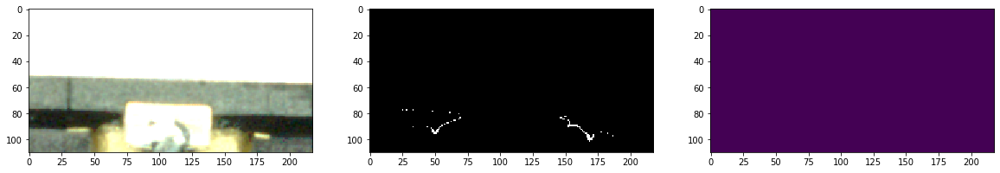

In [40]:
test_image = test_img.copy()
test_image = cv2.fastNlMeansDenoisingColored(test_image,None,11,11,7,21)
for r in test_image:
    for c in r:
        if c[0] > 40 and c[1] > 70 and c[2] < 60: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0
            
image_gray = cv2.cvtColor(test_image, cv2.COLOR_RGB2GRAY)
kernel = np.ones((1, 1), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (35, 35), 0)
_, thresh = cv2.threshold(image_gray_blurred, 100, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20)) 

plt.subplot(131)
plt.imshow(test_img)

plt.subplot(132)
plt.imshow(test_image)

plt.subplot(133)
plt.imshow(thresh)

In [1201]:
ttt = cv2.cvtColor(sqr_img[39], cv2.COLOR_BGR2RGB)


In [ ]:
_, thresh1 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_BINARY)
_, thresh2 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_BINARY_INV)
_, thresh3 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_TRUNC)
_, thresh4 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_TOZERO)
_, thresh5 = cv2.threshold(image_gray_blurred, 127, 255, cv2.THRESH_TOZERO_INV)

In [ ]:
image_denoised = cv2.fastNlMeansDenoisingColored(sqr_img[589],None,9,9,7,17)
image_gray = cv2.cvtColor(image_denoised, cv2.COLOR_RGB2GRAY)
kernel = np.ones((5, 5), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (17, 17), 0)
_, thresh = cv2.threshold(image_gray_blurred, 175, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20))
plt.subplot(121)
plt.imshow(image_denoised)
plt.xticks([])
plt.yticks([])

plt.subplot(122)
plt.imshow(thresh)
plt.xticks([])
plt.yticks([])
plt.show()

In [ ]:
# 노이즈 확인
# shape * 0.8
# 컨투어 박스가 안생김

In [ ]:
sqr_img = up_ok[117]
ttt = cv2.cvtColor(sqr_img, cv2.COLOR_BGR2RGB)
for r in ttt:
    for c in r:
        if c[0] > 160 and c[1] > 160 and c[2] < 170: # if yellow
            c[0] = 255
            c[1] = 255
            c[2] = 255
            
        else:
            c[0] = 0
            c[1] = 0
            c[2] = 0
            
image_gray = cv2.cvtColor(np.float32(ttt), cv2.COLOR_BGR2GRAY)
kernel = np.ones((1, 1), np.uint8)
dilation_image = cv2.dilate(image_gray, kernel, iterations=1)
image_gray_blurred = cv2.GaussianBlur(dilation_image, (7, 7), 0)
_, thresh2 = cv2.threshold(image_gray_blurred, 65, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(20,20))  

plt.subplot(131)
plt.imshow(cv2.cvtColor(sqr_img, cv2.COLOR_BGR2RGB))

plt.subplot(132)
plt.imshow(ttt)

plt.subplot(133)
plt.imshow(thresh2)

# EX FILTER

In [ ]:
import cv2 as cv
import numpy as np

i_cnt = 0
for i_img in up_ng:
    #img_color = Z_ng[52].copy()
    img_color = i_img.copy()
    img_gray = cv.cvtColor(img_color.copy(), cv.COLOR_BGR2GRAY)
    #ret, img_binary = cv.threshold(img_gray.copy(), 190, 255, cv2.THRESH_TOZERO)
    ret, img_binary = cv.threshold(img_gray.copy(), 51, 151, cv2.THRESH_BINARY)
    contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)
    #contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
    #contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    
#### filter image
    # _______________________________________________________________________________________ 흑백 필터 (6개 concat)
    img_denoised_1 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,9,9,7,13)
    img_gray_1 = cv2.cvtColor(img_denoised_1.copy(), cv2.COLOR_RGB2GRAY)
    kernel_1 = np.ones((5, 5), np.uint8)
    img_dilation_1 = cv2.dilate(img_gray_1.copy(), kernel_1, iterations=1)
    img_gray_blurred_1 = cv2.GaussianBlur(img_dilation_1.copy(), (21, 21), 0)

    img_denoised_2 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,11,11,7,13)
    img_gray_2 = cv2.cvtColor(img_denoised_2.copy(), cv2.COLOR_RGB2GRAY)
    kernel_2 = np.ones((1, 1), np.uint8)
    img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
    img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)

    # threshold
    _, thresh_1 = cv2.threshold(img_gray_blurred_1.copy(), 121, 255, cv2.THRESH_TOZERO)
    _, thresh_4 = cv2.threshold(img_gray_blurred_2.copy(), 49, 49, cv2.THRESH_TOZERO)
    # _______________________________________________________________________________________

    # =========
    # DETECTION
    # =========

    #### detect contours
    # _______________________________________________________________________________________ 물체 인식 (컨투어 찾기)
    cnts_1 = cv2.findContours(thresh_1.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_2 = cv2.findContours(thresh_2.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_3 = cv2.findContours(thresh_3.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    cnts_4 = cv2.findContours(thresh_4.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_5 = cv2.findContours(thresh_5.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
#         cnts_6 = cv2.findContours(thresh_6.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    #cnts = cnts_1 + cnts_2 + cnts_3 + cnts_4 + cnts_5  + cnts_6
    cnts = cnts_1 + cnts_4
    # _______________________________________________________________________________________

    #### convert contour to rectangles
    xywh = []
    for cnt in cnts:
        # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
        _x, _y, _w, _h = np.array(cv2.boundingRect(cnt) + np.array([-5,-10,10,20])) # add padding to rectangles
        # ___________________________________________________________________________________
        xywh.append(list(map(int, [_x, _y, _w, _h])))
    # _______________________________________________________________________________________ 중복 사각형 병합
    rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.001) # merge contours with intersection
    # _______________________________________________________________________________________

    #for cnt in contours:
    for cnt in cnts:
        x, y, w, h = cv.boundingRect(cnt)
        im_rect = cv.rectangle(img_color, (x, y), (x + w, y + h), (0, 255, 0), 2)
        print('',cnt.shape[0])

        
#     if r_cdn.shape[0] > 1: # if rectangle is more than one
#             x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
#         elif r_cdn.shape[0] == 1: # if rectangle is only one
#             x, y, w, h = r_cdn[0]
#         else: # if no rectangle is found
#             x, y, w, h = list(map(int, [shape*0.2, y_lower*1.4, shape*0.4, (y_upper-y_lower)*1.2]))
        
        
        
        
    print('{}번째 이미지'.format(i_cnt))
    plt.figure(figsize=(15,10))
    plt.subplot(1,6,1)
    plt.imshow(img_binary)
    plt.subplot(1,6,2)
    plt.imshow(img_color)
    plt.subplot(1,6,3)
    plt.imshow(im_rect)
    plt.subplot(1,6,4)
    plt.imshow(i_img)
    plt.subplot(1,6,5)
    plt.imshow(img_gray_blurred_1)
    plt.subplot(1,6,6)
    plt.imshow(img_gray_blurred_2)
    plt.show()
    i_cnt = i_cnt + 1





# EX2 FILTER

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import copy

i_cnt = 0
for i_img in insp_ng[0:10]:
    #img_color = Z_ng[52].copy()
    img_color = i_img.copy()
    img_color1 = copy.deepcopy(img_color)
    img_gray_blurred = cv2.GaussianBlur(img_color1, (3, 3), 0)
    img_gray = cv.cvtColor(img_gray_blurred.copy(), cv.COLOR_RGB2GRAY)
    #img_gray = cv.cvtColor(img_gray_blurred.copy(), cv.COLOR_BGR2HSV)
#     #img_gray = cv.cvtColor(img_color1, cv.COLOR_BGR2HSV)
#     lowerBound = np.array([20, 100, 100])
#     upperBound = np.array([30, 255, 255])
#     mask = cv2.inRange(img_gray, lowerBound, upperBound)
#     cv2.drawContours(mask,[cnt],0,255,-1)
#     mean = cv2.mean(im,mask = mask)
#     ret, img_binary = cv.threshold(img_gray.copy(), 255, 50, 100, cv2.THRESH_BINARY)
#     ret, origin = cv2.threshold(img_color1, 127, 255, cv2.THRESH_BINARY)
#     thr1 = cv2.adaptiveThreshold(img_gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2) 
#     thr2 = cv2.adaptiveThreshold(img_gray, 115, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)
#     ret1, img_binary1 = cv.threshold(img_gray.copy(), 235, 0, cv2.THRESH_BINARY)
#     ret2, img_binary2 = cv.threshold(img_gray.copy(), 49, 100, cv2.THRESH_BINARY)
#     ee = img_binary1 | img_binary2 
#     ret, img_binary = cv.threshold(img_gray.copy(), 195, 255, 0)
#    contours, hierarchy = cv.findContours(mask.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
    contours, hierarchy = cv.findContours(img_gray.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

#     contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
#     contours, hierarchy = cv.findContours(img_binary.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)
#     cv.drawContours(img_color1,contours, -1, (0, 255, 0), 3)
    plt.figure(figsize=(30,15))
    plt.subplot(1,6,1)
    plt.imshow(i_img)
    plt.subplot(1,6,2)
    plt.imshow(img_gray)
    plt.subplot(1,6,3)
    plt.imshow(img_binary)
    plt.subplot(1,6,4)
    plt.imshow(img_color1)    
    plt.subplot(1,6,5)
    plt.imshow(contours)    
    plt.show

  
    

   

In [15]:
list_123 = [57,58,59,172,173,296,297,298,600,601,606, 609,612,643,644,645,696,711,712,713,1388]
ex_list= []
for i in list_123:
    ex_list.append(up_ok[i])

In [ ]:
for i in range(0,10):
    test_img = cv2.cvtColor(Z_ng[i], cv2.COLOR_BGR2RGB)
    pad = int(test_img.shape[0]*0.25)
    plt.figure()
    plt.subplot(1,2,1)
    plt.imshow(Z_ng[i])
    plt.subplot(1,2,2)
    plt.imshow(test_img[pad:-pad, :, :])
    plt.show()
    np.mean(test_img)

# Contour Color Label 

In [ ]:
from scipy.spatial import distance as dist


def setLabel(image, str, contour):

    fontface = cv2.FONT_HERSHEY_SIMPLEX
    scale = 0.6
    thickness = 2

    size = cv2.getTextSize(str, fontface, scale, thickness)
    text_width = size[0][0]
    text_height = size[0][1]

    x, y, width, height = cv2.boundingRect(contour)

    pt = (x + int((width - text_width) / 2), y + int((height + text_height) / 2))
    cv2.putText(image, str, pt, fontface, scale, (255, 255, 255), thickness, 8)



# 컨투어 내부의 색을 평균내서 red, green, blue 중 어느 색인지 체크
def label(image, contour):


    mask = np.zeros(image.shape[:2], dtype="uint8")
    cv2.drawContours(mask, [contour], -1, 255, -1)

    mask = cv2.erode(mask, None, iterations=2)
    mean = cv2.mean(image, mask=mask)[:3]


    minDist = (np.inf, None)



    for (i, row) in enumerate(lab):

        d = dist.euclidean(row[0], mean)

        if d < minDist[0]:
            minDist = (d, i)

    return colorNames[minDist[1]]


# 인식할 색 입력
colors = [[20, 100, 100], [30, 255, 255], [255, 0, 0], [100, 200, 200]]
colorNames = ["red", "green", "blue","yellow"]



lab = np.zeros((len(colors), 1, 3), dtype="uint8")
for i in range(len(colors)):
    lab[i] = colors[i]

lab = cv2.cvtColor(lab, cv2.COLOR_BGR2LAB)




# 원본 이미지 불러오기
#image = cv2.imread("example_shapes.png", 1)
for i in up_ng[0:5]:
    image = copy.deepcopy(i)

    blurred = cv2.GaussianBlur(image.copy(), (5, 5), 0)

    ###################################################################################################################################
    # # 이진화
    img_hsv = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2HSV)
    # # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
    # # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
    lowerBound = np.array([50, 50, 50],np.uint8)
    upperBound = np.array([150, 200, 200],np.uint8)

    # # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
    img_mask = cv2.inRange(img_hsv, lowerBound, upperBound)

    # # 원본이미지에서 범위값에 해당하는 영상부분을 흭득한다.
    img_result = cv2.bitwise_and(image.copy(), image.copy(), mask = img_mask)
    h, s, v1 = cv2.split(img_result)
    ret, thresh = cv2.threshold(v1.copy(), 30, 180, cv2.THRESH_BINARY)
    ###################################################################################################################################


    #gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
    #ret, thresh = cv2.threshold(gray, 60, 255, cv2.THRESH_BINARY)

    # 색검출할 색공간으로 LAB사용
    img_lab = cv2.cvtColor(blurred.copy(), cv2.COLOR_BGR2LAB)

    thresh = cv2.erode(thresh.copy(), None, iterations=2)
    

    # 컨투어 검출
    contours = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)


    # 컨투어 리스트가 OpenCV 버전에 따라 차이있기 때문에 추가
    if len(contours) == 2:
        contours = contours[0]

    elif len(contours) == 3:
        contours = contours[1]


    # 컨투어 별로 체크
    for contour in contours:
        #plt.imshow(image)   

        # 컨투어를 그림
        cv2.drawContours(image.copy(), [contour], -1, (0, 255, 0), 2)


        # 컨투어 내부에 검출된 색을 표시
        color_text = label(img_lab, contour)
        setLabel(image, color_text, contour)


    plt.figure(figsize=(10,5))
    plt.subplot(1,2,1)
    plt.imshow(thresh)
    plt.subplot(1,2,2)
    plt.imshow(image)
    plt.show()

## UP DETECTION
# EX  NG & OK available UP_DETECTON2

In [90]:
import numpy as np
import cv2

def up_detection2(up_ng):
    cnt_1 = 0
    img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img

    for i in up_ng:    
        img_color = copy.deepcopy(i)
        #input_data = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,13)
        # BGR(파랑색)
        #color = [255, 0, 0]
        color = [30, 255, 255]
        pixel = np.uint8([[color]])
        # cvtColor를 사용하여 HSV 색공간으로 변환한다.
        hsv = cv2.cvtColor(pixel, cv2.COLOR_BGR2HSV)
        # HSV값을 출력하기위해 픽셀값만 갖고온다.
        hsv = hsv[0][0]

        # bgr과 hsv 값 출력
        #print("bgr: ", color)
        #print("hsv: ", hsv)

        # 이미지파일을 컬러로 읽어온다.
        #img_color = cv2.imread('food.jpg')

        # 이미지의 높이와 너비를 갖고온다.
        height,width = img_color.shape[:2]

        # hsv이미지로 변환한다.
        img_hsv = cv2.cvtColor(img_color.copy(), cv2.COLOR_BGR2HSV)

        # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
        # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
        #lower_blue = (120-10, 30, 30)
        #upper_blue = (120+10, 255, 255)
        # yellow color upper and lower bound
        lowerBound = np.array([50, 50, 50],np.uint8)
        upperBound = np.array([200, 200, 180],np.uint8)
        # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
        img_mask = cv2.inRange(img_hsv.copy(), lowerBound, upperBound)


        img_denoised_2 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,21)
        img_gray_2 = cv2.cvtColor(img_denoised_2.copy(), cv2.COLOR_RGB2GRAY)
        kernel_2 = np.ones((1, 1), np.uint8)
        img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=5)
        #img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)
        
        

        # 원본이미지에서 범위값에 해당하는 영상부분을 흭득한다.
        img_result = cv2.bitwise_and(img_color, img_color, mask = img_mask)
        h, s, v1 = cv2.split(img_result)
        ret, thresh = cv2.threshold(v1, 55, 200, cv2.THRESH_BINARY)
        ret1, thresh1 = cv2.threshold(img_gray_2.copy(), 110, 235, cv2.THRESH_BINARY)  # 110 ,235  ok
        ret2, thresh2 = cv2.threshold(img_gray_2.copy(), 155, 235, cv2.THRESH_BINARY)  # 135 235   ok
        ret3, thresh3 = cv2.threshold(img_gray_2.copy(), 195, 235, cv2.THRESH_BINARY)  # 195 234   ok
        ret4, thresh4 = cv2.threshold(img_gray_2.copy(), 90, 235, cv2.THRESH_BINARY)    # 90 235   ok
        ret5, thresh5 = cv2.threshold(img_gray_2.copy(), 215, 235, cv2.THRESH_BINARY)  # 215 235   ok
        ret6, thresh6 = cv2.threshold(img_gray_2.copy(), 145, 235, cv2.THRESH_TOZERO)   # 145 235   ok

        # 컨투어 검출
        contours, hierachy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours1, hierachy1 = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours2, hierachy2 = cv2.findContours(thresh2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours3, hierachy3 = cv2.findContours(thresh3, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours4, hierachy4 = cv2.findContours(thresh4, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours5, hierachy5 = cv2.findContours(thresh5, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        contours6, hierachy6 = cv2.findContours(thresh6, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        # 각각의 컨투어 합성
        contourss = contours + contours1 + contours2# + contours3 + contours4 + contours5 + contours6
#         for cnt in contours:
#             x, y, w, h = cv2.boundingRect(cnt)
#             rrr = img_color.copy()
#             img_rect1 = cv2.rectangle(rrr, (x, y), (x + w, y + h), (0, 255, 0), 1)    

        xywh = []
        for cnt in contourss:
            # ___________________________________________________________________________________ 컨투어 사각형 좌표 리턴
            _x, _y, _w, _h = np.array(cv2.boundingRect(cnt) + np.array([-5,-10,10,20])) # add padding to rectangles        
            # ___________________________________________________________________________________
            xywh.append(list(map(int, [_x, _y, _w, _h])))
        # _______________________________________________________________________________________ 중복 사각형 병합
        rect, _ = cv2.groupRectangles(xywh+xywh, 0, 0.2) # merge contours with intersection
        # _______________________________________________________________________________________

        #### filter contours by condition
        shape = img_color.shape[0]
        y_upper = y_up_pos(img_color)
        try:
            y_min= np.argmax(np.where(rect[:,1] > y_upper, 0, rect[:,1])) # minimum y
            y_lower = max(rect[y_min, 1]/2.7, shape * 0.1)
        except:
            y_lower = shape * 0.2 # lower가 상한(*상한 픽셀 좌표값이 더 커서 lower라고 변수명 설정)

        r_cdn = np.empty((0,4), dtype=int)
        for r in rect:
            x, y, w, h = list(map(int, r))
            # conditions
            cdn_1 = 0.2 < h/w < 1.5
            cdn_2 = x > shape * 0.2
            cdn_3 = x+w < shape * 0.8
            cdn_4 = y > y_lower
            cdn_5 = y+h < y_upper
            cdn_6 = w > shape * 0.05
            cdn_7 = h > shape * 0.05

            if cdn_1 and cdn_2 and cdn_3 and cdn_6 and cdn_7 and cdn_4 and cdn_5:
                r_cdn = np.concatenate((r_cdn, np.array(r)[np.newaxis,:]), axis=0)

        #### filter target contour by selecting max width
        # final condition
        if r_cdn.shape[0] > 1: # if rectangle is more than one
            x, y, w, h = r_cdn[np.argmax(r_cdn[:,3], axis=0)] # pick a rentangle with max height
            print('least two')
        elif r_cdn.shape[0] == 1: # if rectangle is only one
            x, y, w, h = r_cdn[0]
            print('just one pos')
        else: # if no rectangle is found
            x, y, w, h = list(map(int, [shape*0.2, y_lower*1.55, shape*0.55, (y_upper-y_lower)*1]))
            print('default pos')
        # _______________________________________________________________________________________ 연두색 사각형 표시
        img_rect = cv2.rectangle(img_color.copy(), (x,y),(x+w,y+h),(0,255,0),2) # display rectangles in img
        # _______________________________________________________________________________________ 



        # crop target detected contours from img
        # (padding을 주고, 가로세로 비율을 2:1로 확장해 crop하고, shape을(100,200,3)으로 resize)
        #shape = img_color.shape[0]
        pad = int(shape*0.05) # add padding each side
        y_1 = y-pad
        y_2 = y+h+pad
        x_1 = x-pad
        x_2 = x+w+pad

        if (y_2-y_1)/(x_2-x_1) >= 1/2: # widen x axis
            x_pad = int((y_2-y_1)-(x_2-x_1)/2) # more padding to w
            x_1 -= x_pad
            x_2 += x_pad

            if x_1 < 0 and x_2 > shape: # if padded contour overflow on both left and right side 
                y_1 -= int((shape/2-y_2)/2)
                y_2 = y_1+int(shape/2)
                x_1 = 0
                x_2 = shape

            else:
                if x_1 < 0: # if padded contour overflow on left side
                    x_2 += (-x_1)
                    x_1 = 0

                if x_2 > shape: # if padded contour overflow on right side
                    x_1 -= (x_2-shape)
                    x_2 = shape
                    if x_1 < 0:
                        x_1 = 0

        else:  # widen y axis
            y_pad = int((x_2-x_1)/2-(y_2-y_1)) # more padding to h
            y_1 -= y_pad
            y_2 += y_pad

            if y_1 < 0 and y_2 > shape: # if padded contour overflow on both top and bottom side 
                y_1 = 0
                y_2 = shape
                x_1 -= int((shape/2-x_2)/2)
                x_2 = x_1+int(shape/2)

            else:
                if y_1 < 0: # if padded contour overflow on top side
                    print('t')
                    y_2 += (-y_1)
                    y_1 = 0

                if y_2 > shape: # if padded contour overflow on bottom side
                    print('b')
                    y_1 -= (y_2-shape)
                    y_2 = shape
                    if y_1 < 0:
                        y_1 = 0

        img = img_color[y_1:y_2, x_1:x_2] # crop
        # resize img
        img_resized = cv2.resize(img.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)
        # save detected image        
        img_detection = np.concatenate((img_detection, img_resized[np.newaxis,...]), axis=0)        
        #cv2.imwrite('img//UP_NG/UP_NG_{}.jpg'.format(cnt_1), cv2.cvtColor(img_resized, cv2.COLOR_RGB2BGR))
        cnt_1 = cnt_1 + 1 


        # 화면에 영상결과들 보여준다.
        plt.figure(figsize=(15,5))
        plt.subplot(1,4,1)
        plt.imshow(img_color)
        plt.subplot(1,4,2)
        plt.imshow(img_result)
        plt.subplot(1,4,3)
        plt.imshow(img_rect)
        plt.subplot(1,4,4)
        plt.imshow(img_resized)    
        plt.show()
    #return img_detection


# EX_2

In [ ]:
import cv2, sys
from matplotlib import pyplot as plt
import numpy as np
# 우선 이미지 처리를 위해 cv2와 파일을 읽어오고 저장하기 위해 sys를 import해준다.

# 이미지 확인을 위해 matplotlib의 pyplot을 import 했으나 필요 없다면 하지 않아도 무방하다.

# 리스트 배열을 넘파이로 처리하기 위해 numpy를 import 해주었다.
cnt_1 = 0
num1 = 563
num2 = 565
for i in up_ok[563:566]:
    image = copy.deepcopy(i)
    #image_gray = cv2.imread(image.copy(), cv2.IMREAD_GRAYSCALE)
    image_gray = cv2.cvtColor(image.copy(), cv2.COLOR_RGB2GRAY)
    

    # 이미지가 너무 큰 경우 이미지 크기를 줄여야 한다. 
    b,g,r = cv2.split(image)
    image2 = cv2.merge([r,g,b])

    # # 읽어온 이미지는 r,g,b 세층으로 이루어져 있는데 이를 분리하면 순서대로 b,g,r 층이 되므로 이를 변수에 담아 다시 순서대로 r,g,b 순으로 image2에 담는다. 

    # # 블러는 이미지를 부드럽게 하기 때문에 배경과 원하지 않는 부분을 부드럽게 하여 해당 경계를 찾지 못하게 하기 위함이다. 블러 처리를 심하게 하면 원래 찾고자 하는 대상을 찾지 못하게 되고, 블러가 약하면 배경의 외곽도 포함되므로 ksize를 적당히 조절 해야 한다. 
    img_hsv = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2HSV)

    # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
    # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
    lowerBound = np.array([65, 65, 65],np.uint8)
    upperBound = np.array([150, 255, 255],np.uint8)
    # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
    img_mask = cv2.inRange(img_hsv.copy(), lowerBound, upperBound)

    
    #img_denoised_2 = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,21)
    img_gray_2 = cv2.cvtColor(img_color.copy(), cv2.COLOR_RGB2GRAY)
    kernel_2 = np.ones((1, 1), np.uint8)
    img_dilation_2 = cv2.dilate(img_gray_2.copy(), kernel_2, iterations=1)
    #img_gray_blurred_2 = cv2.GaussianBlur(img_dilation_2.copy(), (7, 7), 0)
    
    
    
    # 원본이미지에서 범위값에 해당하는 부분
    img_result = cv2.bitwise_and(image.copy(), image.copy(), mask = img_mask)
    h, s, v1 = cv2.split(img_result)
    ret1, thresh1 = cv2.threshold(v1, 80, 200, cv2.THRESH_TOZERO)
    ret2, thresh2 = cv2.threshold(img_dilation_2.copy(), 135, 255, cv2.THRESH_TOZERO)    
    ret3, thresh3 = cv2.threshold(img_dilation_2.copy(), 195, 255, cv2.THRESH_TOZERO)    
    ret4, thresh4 = cv2.threshold(img_dilation_2.copy(), 90, 255, cv2.THRESH_TOZERO)    
    ret5, thresh5 = cv2.threshold(img_dilation_2.copy(), 235, 255, cv2.THRESH_TOZERO)    

    #contours, hierachy = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_TC89_KCOS)
    contours1, hierachy1 = cv2.findContours(thresh1, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)
    contours2, hierachy2 = cv2.findContours(thresh2, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)
    contours3, hierachy3 = cv2.findContours(thresh3, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)
    contours4, hierachy4 = cv2.findContours(thresh4, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)
    contours5, hierachy5 = cv2.findContours(thresh5, cv2.RETR_EXTERNAL, cv2.THRESH_TOZERO)


    contourss = contours + contours1 + contours2 + contours3 + contours4 + contours5    
       

    #contours, _ = cv2.findContours(thresh1.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    total = 0
    # 외곽선 그리는 용도. 이미지에 그리기 때문에 이 코드 적용하면 원래 이미지에
    # 초록색 선 생김
    contours_image = cv2.drawContours(image.copy(), contourss, -1, (0,255,0), 3)
    plt.figure(figsize=(10,2))
    plt.imshow(contours_image)
    plt.show()
    # #위 코드는 적용하지 않고 넘어가셔도 됩니다. drawContours()를 이용해서 이미지의 외곽을 그립니다. 

    contours_xy = np.array(contourss)
    contours_xy.shape

    x_min, x_max = 0,0
    value = list()
    for i in range(len(contours_xy)):
        for j in range(len(contours_xy[i])):
            value.append(contours_xy[i][j][0][0]) #네번째 괄호가 0일때 x의 값
            x_min = min(value)-30
            x_max = max(value)+30
       

    # y의 min과 max 찾기
    y_min, y_max = 0,0
    value = list()
    for i in range(len(contours_xy)):
        for j in range(len(contours_xy[i])):
            value.append(contours_xy[i][j][0][1]) #네번째 괄호가 0일때 x의 값
            y_min = min(value)-30
            y_max = max(value)+30
    
    # image trim 하기
    x = x_min
    y = y_min
    w = (x_max-x_min)
    h = (y_max-y_min)
    try:
        img_trim = image[y:y+h, x:x+w]
        img_resized = cv2.resize(img_trim.copy(), (200, 100), interpolation=cv2.INTER_CUBIC)        
        img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
        img_detection = np.concatenate((img_detection, img_resized[np.newaxis,...]), axis=0)        
        #cv2.imwrite('img//UP_OK_1/UP_OK_{}.jpg'.format(cnt_1), cv2.cvtColor(img_trim, cv2.COLOR_RGB2BGR))
        plt.figure(figsize=(10,2))
        print(num1)
        plt.imshow(img_resized)        
        plt.show()
        cnt_1 = cnt_1 + 1
        #num1 = num1 + 1
    except:
        pass







In [ ]:
import numpy as np
import cv2
import operator


cnt_1 = 0
img_detection = np.empty((0, 100, 200, 3), dtype='uint8') # empty array to append img
##for i in up_ok[1400:1410] pos3
for i in up_ng[0:10]:    
    img_color = copy.deepcopy(i)
    #input_data = cv2.fastNlMeansDenoisingColored(img_color.copy(),None,7,7,7,13)
    # BGR(파랑색)
    #color = [255, 0, 0]
    color = [50, 255, 255]
    pixel = np.uint8([[color]])
    # cvtColor를 사용하여 HSV 색공간으로 변환한다.
    hsv = cv2.cvtColor(pixel, cv2.COLOR_BGR2HSV)
    # HSV값을 출력하기위해 픽셀값만 갖고온다.
    hsv = hsv[0][0]

    # bgr과 hsv 값 출력
    #print("bgr: ", color)
    #print("hsv: ", hsv)

    # 이미지파일을 컬러로 읽어온다.
    #img_color = cv2.imread('food.jpg')

    # 이미지의 높이와 너비를 갖고온다.
    height,width = img_color.shape[:2]

    # hsv이미지로 변환한다.
    img_hsv = cv2.cvtColor(img_color.copy(), cv2.COLOR_BGR2HSV)

    # 범위를 정하여 hsv이미지에서 원하는 색 영역을 바이너리 이미지로 생성한다.
    # (가운데와 마지막값은 너무어두워서 검은색에 가까운색과 너무 옅어서 흰색에 가까운색을 제외시키기위해 30으로해야한다.
    #lower_blue = (120-10, 30, 30)
    #upper_blue = (120+10, 255, 255)
    # yellow color upper and lower bound
    lowerBound = np.array([50, 50, 50],np.uint8)
    upperBound = np.array([200, 200, 180],np.uint8)
    # 앞서 선언한 범위값을 사용하여 바이너리 이미지를 얻는다.(범위내에 있는 픽셀들은 흰색이되고 나머지는 검은색이 된다.)
    img_mask = cv2.inRange(img_hsv.copy(), lowerBound, upperBound)
    img_result = cv2.bitwise_and(img_color, img_color, mask = img_mask)
    h, s, v1 = cv2.split(img_result)
    
    mask1 = cv2.inRange(img_hsv.copy(), (65,65,65), (200, 200, 180))    
    #h2, s2, v2 = cv2.split(mask1)

    
    ret, thr1 = cv2.threshold(v1.copy(), 135, 255, cv2.THRESH_BINARY) 
    thr2 = cv2.adaptiveThreshold(v1.copy(), 100, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 5, 2) 
    
    
    
    bluecnts = cv2.findContours(v1.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    bluecnts1 = cv2.findContours(thr1.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]
    bluecnts2 = cv2.findContours(mask1.copy(),cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)[-2]

    img_color2 = copy.deepcopy(img_color)

    if len(bluecnts)>0:
        blue_area = max(bluecnts, key=cv2.contourArea)
        (xg,yg,wg,hg) = cv2.boundingRect(blue_area)
        rect = cv2.rectangle(img_color.copy(),(xg-22,yg-22),(xg+wg+10, yg+hg+10),(0,255,0),2)
     
    for i in bluecnts1:    
        blue_area1 = max(i, key=cv2.contourArea)
        (xg1,yg1,wg1,hg1) = cv2.boundingRect(blue_area1)
        rect1 = cv2.rectangle(img_color.copy(),(xg1,yg1),(xg1+wg1, yg1+hg1),(0,255,0),2)

    list_val = []        
    for cnt in bluecnts2:                        
        x2, y2, w2, h2 = cv2.boundingRect(cnt)
        area_x = cv2.contourArea(cnt)
        rect2 = cv2.rectangle(img_color2, (x2, y2), (x2 + w2, y2 + h2), (0,255,0), 1)        
        list_val.append(area_x)
    
    index1, value1 = max(enumerate(list_val), key=operator.itemgetter(1))
    index2 = []
    count_num = 0
    print('contour length = ', len(bluecnts2))
    for cnt in bluecnts2:                                
        area_x = cv2.contourArea(cnt)
        if (value1/2) < area_x:
            index2.append(count_num)            
        count_num = count_num + 1
        
    img_color3 = copy.deepcopy(img_color)
    img_color4 = copy.deepcopy(img_color)
    print('counts of rectangle = ',index2)
    if len(index2) > 1 :
        for cnt in index2:                        
            x3, y3, w3, h3 = cv2.boundingRect(bluecnts2[cnt])        
            rect3 = cv2.rectangle(img_color3, (x3, y3), (x3 + w3, y3 + h3), (0,255,0), 1)

        x5, y5, w5, h5 = cv2.boundingRect(bluecnts2[index2[0]])        
        x6, y6, w6, h6 = cv2.boundingRect(bluecnts2[index2[1]])
        x7 = 0 
        y7 = 0
        w7 = 0
        h7 =0
        if x5 > x6:
            x7 = x6
        else:
            x7 = x5

        if y5 < y6:
            y7 = y5
        else:
            y7 = y6


        if x5 + w5 < x6 + w6:
            xw7 = x6 + w6        
        else:
            xw7 =  x5 + w5

        if y5 + h5 < y6 + h6:
            yh7 = y6 + h6

        else:
            yh7 = y5 + h5


        rect4 = cv2.rectangle(img_color4, (x7-10, y7-20), (xw7+10, yh7+10), (0,255,0), 2)
        
    else:
        for cnt in index2:                        
            x3, y3, w3, h3 = cv2.boundingRect(bluecnts2[cnt])        
            rect4 = cv2.rectangle(img_color3, (x3-10, y3-20), (x3 + w3 + 10, y3 + h3 + 10), (0,255,0), 2)
    
    
    
    plt.figure(figsize=(20,10))    
    plt.subplot(2,3,1)
    plt.imshow(img_result)
    plt.subplot(2,3,2)
    plt.imshow(v1)
    plt.subplot(2,3,3)
    plt.imshow(rect)
    plt.subplot(2,3,4)
    plt.imshow(rect1)
    plt.subplot(2,3,5)
    plt.imshow(rect3)
    plt.subplot(2,3,6)
    plt.imshow(rect4)    
    plt.show()
    print('='*100)
        
#return img_detection


In [23]:
path_list_up_ok.index('img2\\OK\\1-1-120\\UP\\POS_2\\CAM_UP_POS2_20190919_160525_146_Boat[CC0087_Row11_Col4]_Pos2.BMP')

217

In [32]:
# def global_average_pooling(x):
#     return K.mean(x, axis = (2, 3))
    
# def global_average_pooling_shape(input_shape):
#     return input_shape[0:2]

In [33]:
# def get_model():    
#     model =VGG16(weights=None,include_top=False) 
#     #imports the MobileNetV2 model and discards the last 1000 neuron layer.
#     model = load_weights(model, "best_model_vgg16.h5")

#     model.add(Lambda(global_average_pooling, 
#               output_shape=global_average_pooling_shape))
#     model.add(Dense(2, activation = 'softmax', init='uniform'))
#     sgd = SGD(lr=0.01, decay=1e-6, momentum=0.5, nesterov=True)
#     model.compile(loss = 'categorical_crossentropy', optimizer = sgd, metrics=['accuracy'])

#     return model

# CAM ( class activation map )

In [26]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import cv2
import pathlib
import random
from PIL import Image

In [24]:
X = np.concatenate((img_up_ng_det, img_up_ok_det))
y = np.concatenate((np.ones(len(img_up_ng_det)), np.zeros(len(img_up_ok_det))))

from sklearn.model_selection import train_test_split
from keras.utils.np_utils import to_categorical

y_cat = to_categorical(y, 2)
X_train, X_test, y_train, y_test = train_test_split(X, y_cat, test_size=0.1, stratify=y_cat, random_state=77)

In [25]:
#IMG_SIZE=160
batch_size = 64
epochs = 100

In [26]:
model_vgg16 =VGG16(weights=None,include_top=False) #imports the MobileNetV2 model and discards the last 1000 neuron layer.
x=model_vgg16.output
x=GlobalAveragePooling2D()(x)
x=Dense(2048,activation='relu')(x) #we add dense layers so that the model can learn more complex functions and classify for better results.
x = Dropout(rate=0.5)(x)
x=Dense(1024,activation='relu')(x) #dense layer 2
x=Dense(1024,activation='relu')(x) #dense layer 2
x = Dropout(rate=0.5)(x)
x=Dense(512,activation='relu')(x) #dense layer 3
preds=Dense(2,activation='softmax')(x) #final layer with softmax activation for N classes
model_vgg16_1 =Model(inputs=model_vgg16.input,outputs=preds) #specify the inputs and outputs






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [27]:
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
#model = multi_gpu_model(model, gpus=2)
model_vgg16_1.compile(loss = "categorical_crossentropy", optimizer=adam, metrics=["acc"])
# step_size_train=train_generator.n//train_generator.batch_size
# step_size_val=val_generator.n//val_generator.batch_size
# model.fit_generator(generator=train_generator,
#                   steps_per_epoch=step_size_train,
#                   epochs=100, validation_data=val_generator,
#                   validation_steps=step_size_val)

In [28]:
callbacks = [ReduceLROnPlateau(patience=10, factor=0.5, verbose=1),
             #EarlyStopping(patience=100, verbose=1),
             ModelCheckpoint("best_model_vgg16_1.h5", save_best_only=True, verbose=1)]

keras.backend.get_session().run(tf.global_variables_initializer())
hist = model_vgg16_1.fit(X_train, y_train, validation_data=[X_test, y_test],
                 batch_size=batch_size, epochs=epochs, callbacks=callbacks)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Train on 1348 samples, validate on 150 samples
Epoch 1/100
1348/1348 [==============================] - 169s 126ms/step - loss: 0.6395 - acc: 0.9525 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00001: val_loss improved from inf to 0.64472, saving model to best_model_vgg16_1.h5
Epoch 2/100
1348/1348 [==============================] - 173s 128ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00002: val_loss did not improve from 0.64472
Epoch 3/100
1348/1348 [==============================] - 171s 127ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00003: val_loss did not improve from 0.64472
Epoch 4/100
1348/1348 [==============================] - 167s 124ms/step - loss: 0.6218 - acc: 0.9614 - val_loss: 0.6447 - val_acc: 0.9600

Epoch 00004: val_loss did not improve from 0.64472
Epoch 5/100
1348/1348 [==============================] -

KeyboardInterrupt: 

In [32]:
up_ok[2].shape

(218, 218, 3)

In [84]:
# def get_output_layer(model, layer_name):
#     # get the symbolic outputs of each "key" layer (we gave them unique names).
#     layer_dict = dict([(layer.name, layer) for layer in model.layers])
#     layer = layer_dict[layer_name]
#     return layer

In [ ]:
# #model1 = get_model()
# img_path = path_list_up_ng[0]
# #model_vgg16_2.load_weights("best_model_vgg16_1.h5")
# #model = load_model(model_path)
# original_img = cv2.imread(img_path, 1)
# width, height, _ = original_img.shape

# #Reshape to the network input shape (3, w, h).
# img = np.array([np.transpose(np.float32(original_img), (2, 0, 1))])

# #Get the 512 input weights to the softmax.
# class_weights = model_vgg16_1.layers[-1].get_weights()[0]
# # final_conv_layer = get_output_layer(model_vgg16_1, "conv5_3")
# # get_output = K.function([model_vgg16_1.layers[0].input], \
# #             [final_conv_layer.output, 
# # model_vgg16_1.layers[-1].output])
# get_output = tf.keras.backend.function([model_vgg16_1.layers[0].input],
#                                        [model_vgg16_1.layers[-3].output, model_vgg16_1.layers[-1].output])
# [conv_outputs, predictions] = get_output([img])
# conv_outputs = conv_outputs[0, :, :, :]

# #Create the class activation map.
# cam = np.zeros(dtype = np.float32, shape = conv_outputs.shape[1:3])
# target_class = 1
# for i, w in enumerate(class_weights[:, target_class]):
#         cam += w * conv_outputs[i, :, :]

# cam /= np.max(cam)
# cam = cv2.resize(cam, (height, width))
# heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
# heatmap[np.where(cam < 0.2)] = 0
# img = heatmap*0.5 + original_img
# plt.imshow(img)
# plt.show()

In [61]:
model_vgg16 =VGG16(weights=None,include_top=False) #imports the MobileNetV2 model and discards the last 1000 neuron layer.
x=model_vgg16.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x) #dense layer 2
x = Dropout(rate=0.5)(x)
x=Dense(512,activation='relu')(x) #dense layer 3
preds=Dense(2,activation='softmax')(x) #final layer with softmax activation for N classes
sgd = optimizers.SGD(lr=0.001, decay=1e-6, momentum=0.9, nesterov=True)
adam = optimizers.Adam(lr=0.0005, decay=1e-6)
#model = multi_gpu_model(model, gpus=2)
model_vgg16.compile(loss = 'categorical_crossentropy', optimizer = sgd, metrics=['accuracy'])
model_vgg16_1 =Model(inputs=model_vgg16.input,outputs=preds) #specify the inputs and outputs

In [23]:
from keras.models import load_model
model = load_model('best_model_vgg16_1.h5')






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


(1, 150, 150, 3)


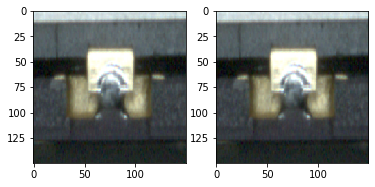

In [24]:
img_path = path_list_up_ok[2]

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)

# 이미지를 4D 텐서로 변경합니다
img_tensor = np.expand_dims(img_tensor, axis=0)
# 모델이 훈련될 때 입력에 적용한 전처리 방식을 동일하게 사용합니다
img_tensor /= 255.

# 이미지 텐서의 크기는 (1, 150, 150, 3)입니다
print(img_tensor.shape)
plt.subplot(1,2,1)
plt.imshow(img)
plt.subplot(1,2,2)
plt.imshow(img_tensor[0])

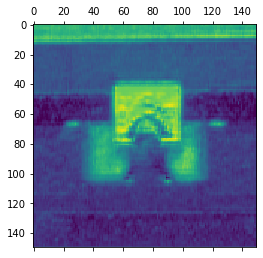

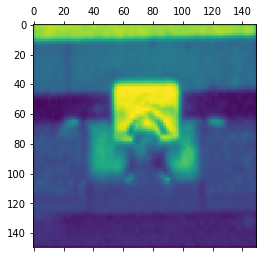

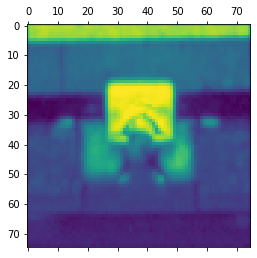

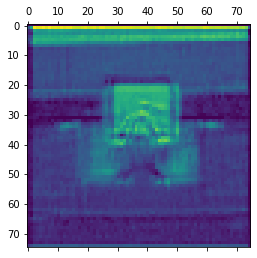

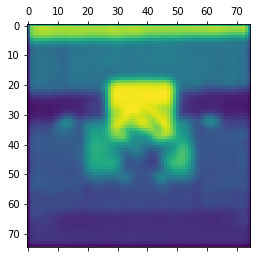

...

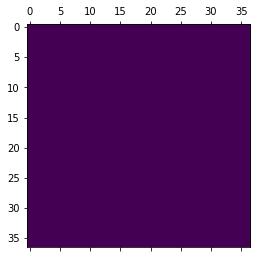

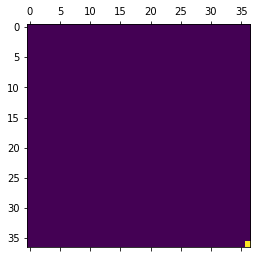

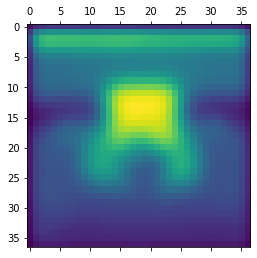

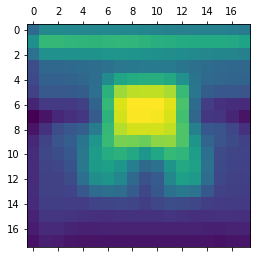

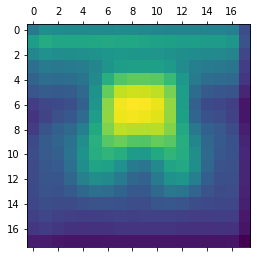

In [36]:
for i in range(0,len(activations)):
    first_layer_activation = activations[i]
    plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
    plt.show()

In [38]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 100, 200, 3)       0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 100, 200, 32)      896       
_________________________________________________________________
batch_normalization_5 (Batch (None, 100, 200, 32)      128       
_________________________________________________________________
activation_5 (Activation)    (None, 100, 200, 32)      0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 100, 200, 32)      9248      
_________________________________________________________________
batch_normalization_6 (Batch (None, 100, 200, 32)      128       
_________________________________________________________________
activation_6 (Activation)    (None, 100, 200, 32)      0         
__________

In [ ]:
from keras import models
from vis.visualization import visualize_activation
from vis.utils import utils
from keras import activations

# 상위 8개 층의 출력을 추출합니다:
layer_outputs = [layer.output for layer in model.layers[:12] if not layer.name.startswith('input') ]
# 입력에 대해 8개 층의 출력을 반환하는 모델을 만듭니다:

activation_model = models.Model(inputs=model.input, outputs=layer_outputs)
activations = activation_model.predict(img_tensor)

In [18]:
from keras.models import load_model

model.load_weights('best_model_baseline_2.h5')

#model.save('best_up_model_try.h5')



#model.fit (X_train, y_train, epochs = 1)
## best_model_baseline_2
# model.layers[-2]   #get single GPU model weights
# old_model.load_weights("best_model_baseline_2.h5")
# old_model.summary()
#model_b2 = load_model('best_up_model_try.h5')

NameError: name 'model' is not defined

In [77]:
#for i in range(0,len(X_train)):
#img = X_train
#x1 = image.img_to_array(img.copy())
#x1 = np.expand_dims(x1,axis=0)
train_pred = model.predict(X_train)
train_pred[train_pred<0.5] = 0
train_pred[train_pred>=0.5] = 1

In [78]:
print(confusion_matrix(y_train, train_pred.reshape(-1)))

[[1282   14]
 [   0   52]]


In [182]:
len(train_pred)

1348

In [68]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_3 (InputLayer)         (None, 100, 200, 3)       0         
_________________________________________________________________
conv2d_9 (Conv2D)            (None, 100, 200, 32)      896       
_________________________________________________________________
batch_normalization_9 (Batch (None, 100, 200, 32)      128       
_________________________________________________________________
activation_9 (Activation)    (None, 100, 200, 32)      0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 100, 200, 32)      9248      
_________________________________________________________________
batch_normalization_10 (Batc (None, 100, 200, 32)      128       
_________________________________________________________________
activation_10 (Activation)   (None, 100, 200, 32)      0         
__________

In [ ]:
for i in range(0,len(y_train)):
    if y_train[i] == 1:
        print(i)
    else:
        pass


52
[[0.]]


Exception ignored in: <function BaseSession._Callable.__del__ at 0x00000203875D6168>
Traceback (most recent call last):
  File "c:\python\python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


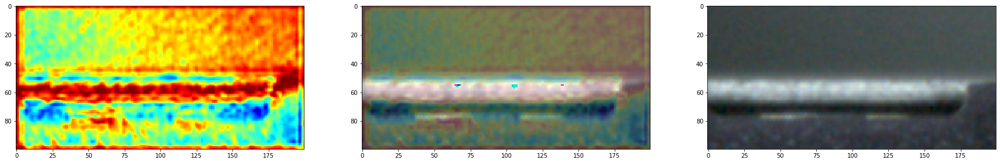

61
[[0.]]


Exception ignored in: <function BaseSession._Callable.__del__ at 0x00000203875D6168>
Traceback (most recent call last):
  File "c:\python\python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


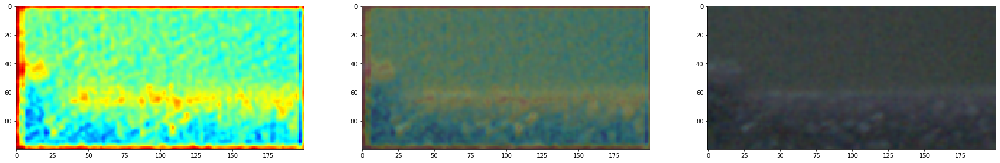

69
[[0.]]


Exception ignored in: <function BaseSession._Callable.__del__ at 0x00000203875D6168>
Traceback (most recent call last):
  File "c:\python\python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


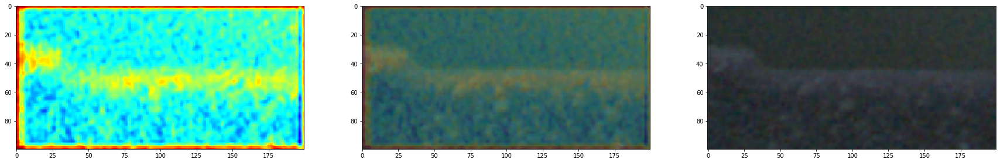

72
[[0.]]


Exception ignored in: <function BaseSession._Callable.__del__ at 0x00000203875D6168>
Traceback (most recent call last):
  File "c:\python\python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


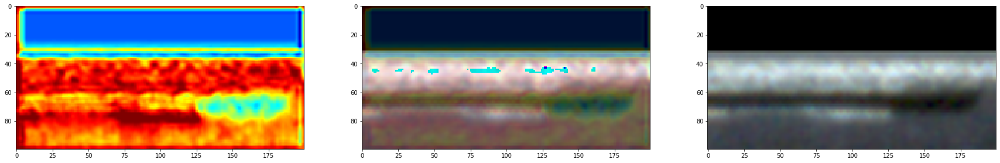

88
[[0.]]


Exception ignored in: <function BaseSession._Callable.__del__ at 0x00000203875D6168>
Traceback (most recent call last):
  File "c:\python\python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


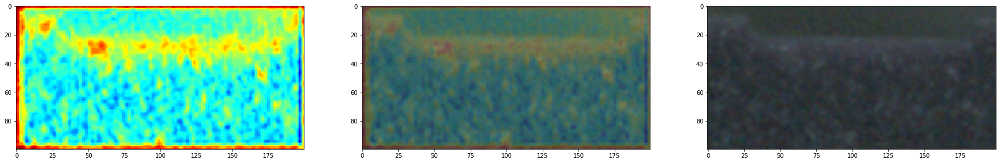

120
[[0.]]


Exception ignored in: <function BaseSession._Callable.__del__ at 0x00000203875D6168>
Traceback (most recent call last):
  File "c:\python\python37\lib\site-packages\tensorflow\python\client\session.py", line 1473, in __del__
    self._session._session, self._handle)
tensorflow.python.framework.errors_impl.CancelledError: (None, None, 'Session has been closed.')


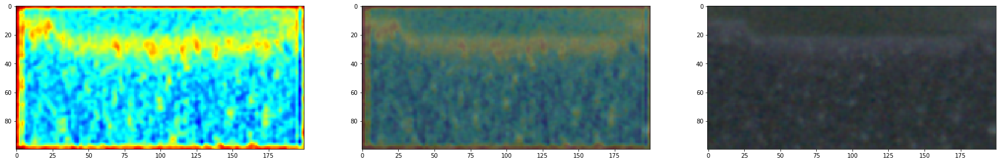

In [74]:
from keras.applications.vgg16 import preprocess_input, decode_predictions
from keras import backend as K
from keras.preprocessing import image

#img_path = img_up_ok_det[0][2]
#img = image.load_img(img_path,target_size = (218, 218))
# img = img_up_ok_det[2]
# x1 = image.img_to_array(img)
# x1 = np.expand_dims(x1,axis=0)
# x1 = preprocess_input(x1)
import tensorflow as tf

#list_all = [28,23,54,55,21,53,58,64]
#list_all = [66,67,68,72,73]   ## baseline1
#list_all = [54,55,196,197,574,575,900,901]   ## baseline2
#list_all = [132,157,160,170,177,226,239,264,271,281,306,341,346,407,409]
#list_all = [832,895,898,903,914,935,994,1107,1116,1129,1134,1260,1298,1305,1307]
#list_all = [831,832,894,895,897,898,902,903,913,914,934,935,993,994,1106,1107]
list_all = [52,61,69,72,88,120]
#for i in range(0,len(img_up_ng_det)):
for i in list_all:
    print(i)    
    if i < 70:
        img = X_test[i]
        x1 = image.img_to_array(img.copy())
        x1 = np.expand_dims(x1,axis=0)
        x1 = preprocess_input(x1)
        pred_ex = model.predict(x1)
        pred_ex[pred_ex<0.5] = 0
        pred_ex[pred_ex>=0.5] = 1
        print(pred_ex)
    else:
        img = X_test[i]
        x1 = image.img_to_array(img.copy())
        x1 = np.expand_dims(x1,axis=0)
        x1 = preprocess_input(x1)
        pred_ex = model.predict(x1)
        pred_ex[pred_ex<0.5] = 0
        pred_ex[pred_ex>=0.5] = 1
        print(pred_ex)
    #img = img_up_ok_det[i]
    #img = up_ng[i]
    #img = cv2.cvtColor(img1.copy(), cv2.COLOR_HSV2RGB)
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        
        idx_ele = np.argmax(train_pred[0])

        # 예측 벡터의 '아프리카 코끼리' 항목
        modeling_output = model.output[:, idx_ele]     
        
        
        # 예측 벡터의 '아프리카 코끼리' 항목
        #modeling_output = model.output[:, 0]

        # VGG16의 마지막 합성곱 층인 block5_conv3 층의 특성 맵
        last_conv_layer = model.get_layer('conv2d_12')

        # block5_conv3의 특성 맵 출력에 대한 '아프리카 코끼리' 클래스의 그래디언트
        grads = K.gradients(modeling_output, last_conv_layer.output)[0]

        # 특성 맵 채널별 그래디언트 평균 값이 담긴 (512,) 크기의 벡터
        pooled_grads = K.mean(grads, axis=(0, 1, 2))

        # 샘플 이미지가 주어졌을 때 방금 전 정의한 pooled_grads와 block5_conv3의 특성 맵 출력을 구합니다
        iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

        # 두 마리 코끼리가 있는 샘플 이미지를 주입하고 두 개의 넘파이 배열을 얻습니다
        pooled_grads_value, conv_layer_output_value = iterate([x1])

        # "아프리카 코끼리" 클래스에 대한 "채널의 중요도"를 특성 맵 배열의 채널에 곱합니다
        for i in range(3):
            conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

        # 만들어진 특성 맵에서 채널 축을 따라 평균한 값이 클래스 활성화의 히트맵입니다
        heatmap = np.mean(conv_layer_output_value, axis=-1)

    sess.close()


    heatmap = np.maximum(heatmap,0)
    heatmap /= np.max(heatmap)
#     plt.matshow(heatmap)
#     plt.show()

    #img1 = img_up_ok_det[0]
    # heatmap을 원본 이미지 크기에 맞게 변경
    #heatmap = cv2.resize(heatmap, (img_up_ok_det[0].shape[1], img_up_ok_det[0].shape[0]))
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    # heatmap을 RGB 포맷으로 변환
    heatmap = np.uint8(255 * heatmap)
    # 히트맵으로 변환
    heatmap_1 = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    #heatmap_1[np.where(heatmap < 110)] = 0
    # 0.4는 히트맵의 강도    
    superimposed_img = (heatmap_1*0.2) + img
    plt.figure(figsize=(30,10))
    plt.subplot(1,3,1)
    plt.imshow(heatmap_1)
    plt.subplot(1,3,2)
    plt.imshow((superimposed_img).astype(np.uint8))
    plt.subplot(1,3,3)
    plt.imshow(img)
    plt.show()




In [ ]:
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# 특성 맵을 그립니다
for layer_name, layer_activation in zip(layer_names, activations):
    # 특성 맵에 있는 특성의 수
    n_features = layer_activation.shape[-1]

    # 특성 맵의 크기는 (1, size, size, n_features)입니다
    size = layer_activation.shape[1]

    # 활성화 채널을 위한 그리드 크기를 구합니다
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # 각 활성화를 하나의 큰 그리드에 채웁니다
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # 그래프로 나타내기 좋게 특성을 처리합니다
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # 그리드를 출력합니다
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()